
# Taller 2 - MLOps: Predicción de Bancarrota de Empresas

Este notebook implementa las soluciones para el Taller 2, siguiendo la metodología CRISP-DM y utilizando el dataset ["Company Bankruptcy Prediction"](https://www.kaggle.com/datasets/fedesoriano/company-bankruptcy-prediction). 

**Objetivo:** Predecir la probabilidad de bancarrota de empresas utilizando diferentes modelos de Machine Learning y desplegar el mejor modelo con FastAPI.

---
### Integrantes
* **Julian Felipe Areiza Paramo** julian.areiza@eia.edu.co
* **Juan Diego Bedoya David** juan.bedoya90@eia.edu.co



## 1. Entendimiento del Negocio

* **Objetivo de negocio:** Identificar empresas con alto riesgo de bancarrota, permitiendo a las instituciones financieras tomar decisiones informadas sobre créditos y otros servicios.
* **Objetivo analítico:** Desarrollar un modelo predictivo que estime la probabilidad de bancarrota basado en los datos financieros y características de las empresas.

## Importación de Librerías

In [1]:
import numpy as np
import os
from kaggle.api.kaggle_api_extended import KaggleApi
import pandas as pd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from scipy.stats.mstats import winsorize
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, roc_auc_score
from pycaret.classification import *
import optuna
from imblearn.over_sampling import SMOTE
import joblib




import warnings
warnings.filterwarnings('ignore')

#### Conexión Kaggle y carga del dataset

In [2]:
api = KaggleApi()
api.authenticate()


dataset_path = "company-bankruptcy-prediction"
if not os.path.exists(dataset_path):
    api.dataset_download_files(
        "fedesoriano/company-bankruptcy-prediction", 
        path=dataset_path, 
        unzip=True
    )
print("Dataset descargado y descomprimido.")

Dataset descargado y descomprimido.


In [3]:
# Cargar el dataset
data_file = os.path.join(dataset_path, "data.csv")
df= pd.read_csv(data_file)

## 2. Entendimiento de los datos
* Análisis univariante, análisis bivariante o cualquier tipo de gráficas o transformación de datos que permitan entender los datos. Haga un proceso de exploración extenso.

In [4]:
df.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

In [6]:
df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


In [7]:
print(df['Bankrupt?'].value_counts())
print('-'* 50)
print('Financieramente Estable: ', round(df['Bankrupt?'].value_counts()[0]/len(df) * 100,2), '% del dataset')
print('Financieramente Inestable: ', round(df['Bankrupt?'].value_counts()[1]/len(df) * 100,2), '% del dataset')

Bankrupt?
0    6599
1     220
Name: count, dtype: int64
--------------------------------------------------
Financieramente Estable:  96.77 % del dataset
Financieramente Inestable:  3.23 % del dataset


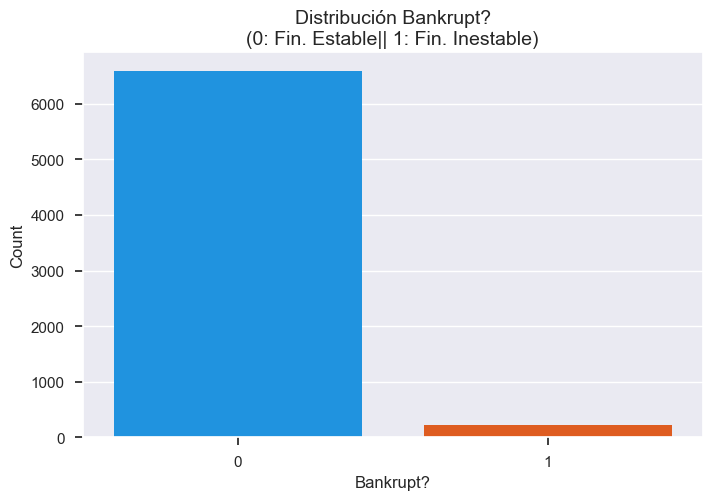

In [8]:
plt.style.use('seaborn-v0_8')
sns.set_context("notebook")

plt.figure(figsize=(8, 5))
sns.countplot(x='Bankrupt?', data=df, palette=['#0099FF','#FE5000'])
plt.title('Distribución Bankrupt?\n(0: Fin. Estable|| 1: Fin. Inestable)', fontsize=14)
plt.xlabel('Bankrupt?', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()

Análisis Univariante.

Variables Numéricas

 Distribución Variable: Bankrupt?


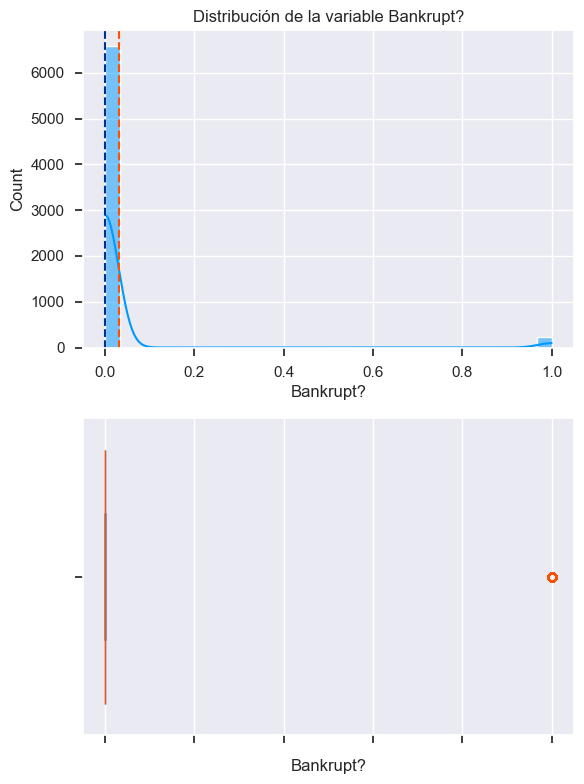

count    6819.000000
mean        0.032263
std         0.176710
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Bankrupt?, dtype: float64
------------------------------------------------------------



 Distribución Variable:  ROA(C) before interest and depreciation before interest


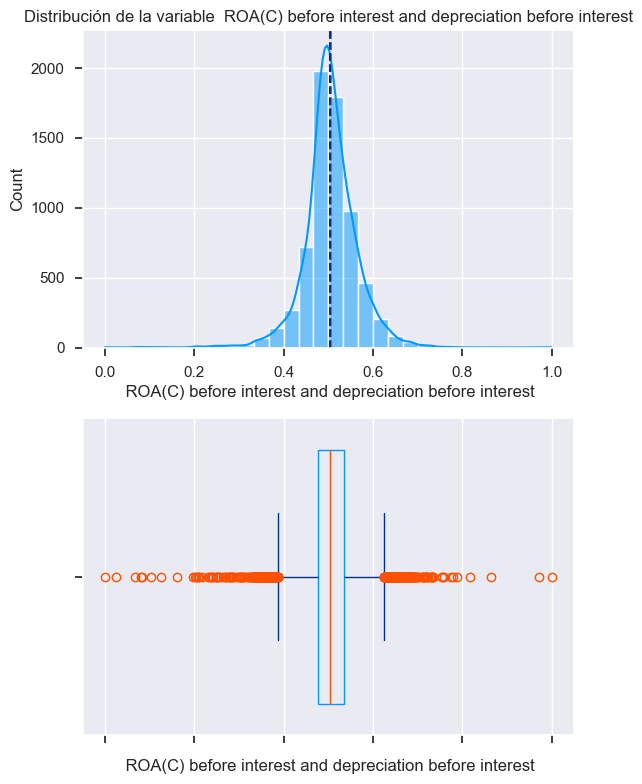

count    6819.000000
mean        0.505180
std         0.060686
min         0.000000
25%         0.476527
50%         0.502706
75%         0.535563
max         1.000000
Name:  ROA(C) before interest and depreciation before interest, dtype: float64
------------------------------------------------------------



 Distribución Variable:  ROA(A) before interest and % after tax


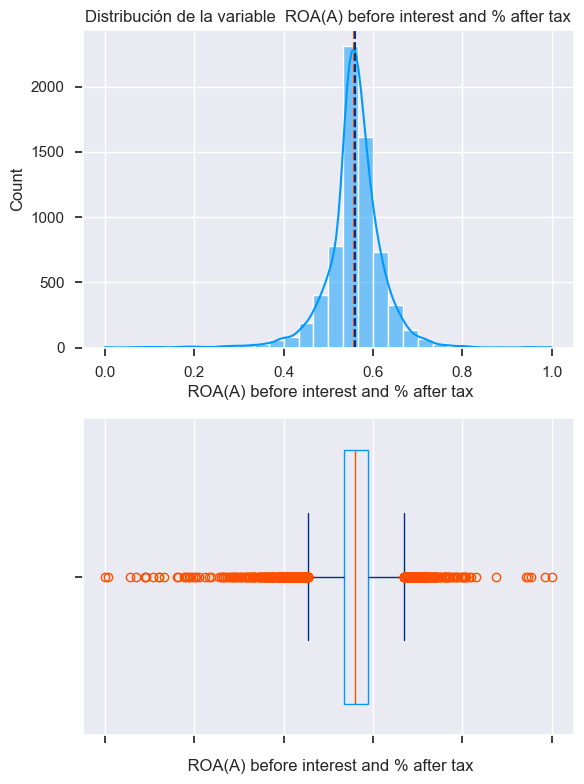

count    6819.000000
mean        0.558625
std         0.065620
min         0.000000
25%         0.535543
50%         0.559802
75%         0.589157
max         1.000000
Name:  ROA(A) before interest and % after tax, dtype: float64
------------------------------------------------------------



 Distribución Variable:  ROA(B) before interest and depreciation after tax


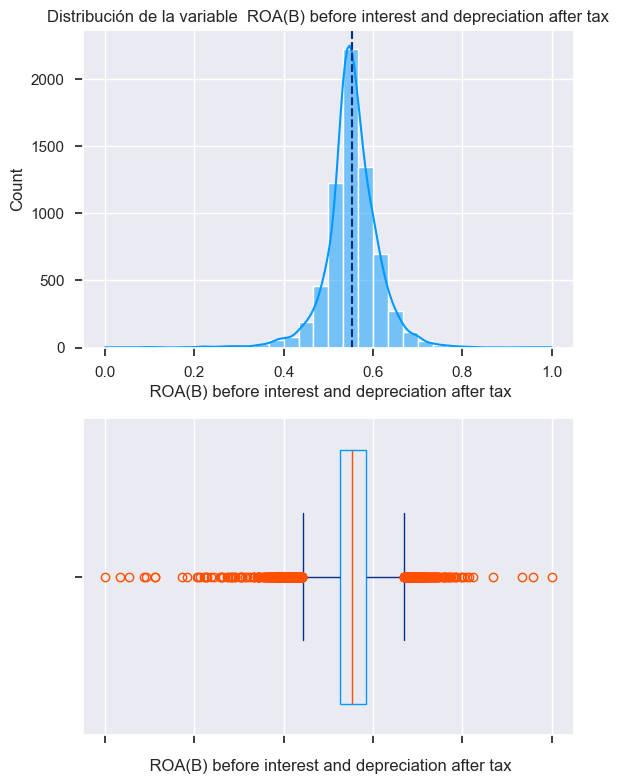

count    6819.000000
mean        0.553589
std         0.061595
min         0.000000
25%         0.527277
50%         0.552278
75%         0.584105
max         1.000000
Name:  ROA(B) before interest and depreciation after tax, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Operating Gross Margin


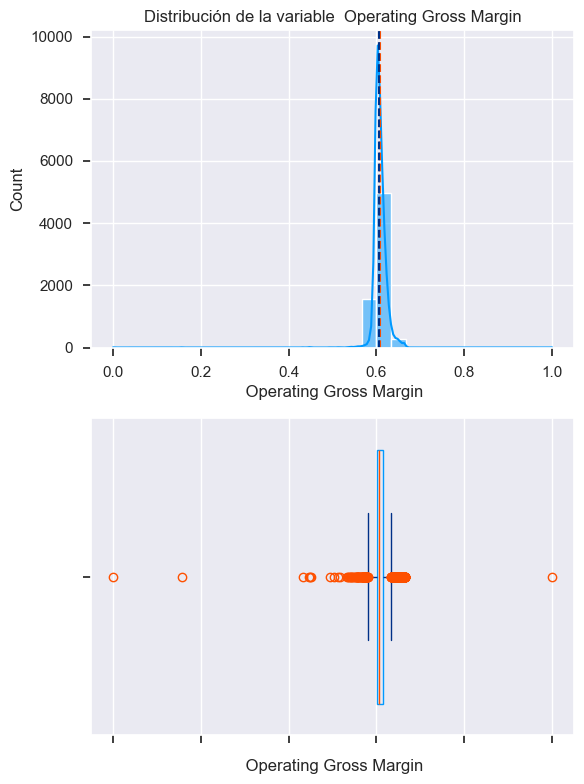

count    6819.000000
mean        0.607948
std         0.016934
min         0.000000
25%         0.600445
50%         0.605997
75%         0.613914
max         1.000000
Name:  Operating Gross Margin, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Realized Sales Gross Margin


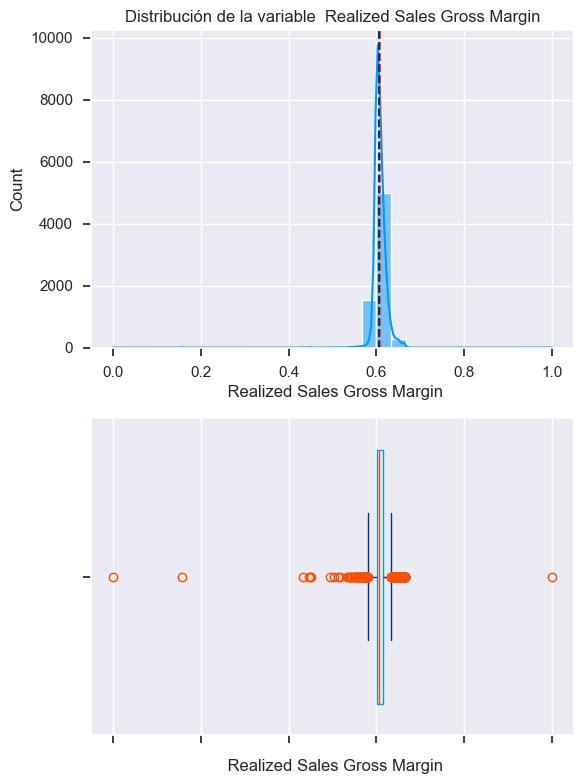

count    6819.000000
mean        0.607929
std         0.016916
min         0.000000
25%         0.600434
50%         0.605976
75%         0.613842
max         1.000000
Name:  Realized Sales Gross Margin, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Operating Profit Rate


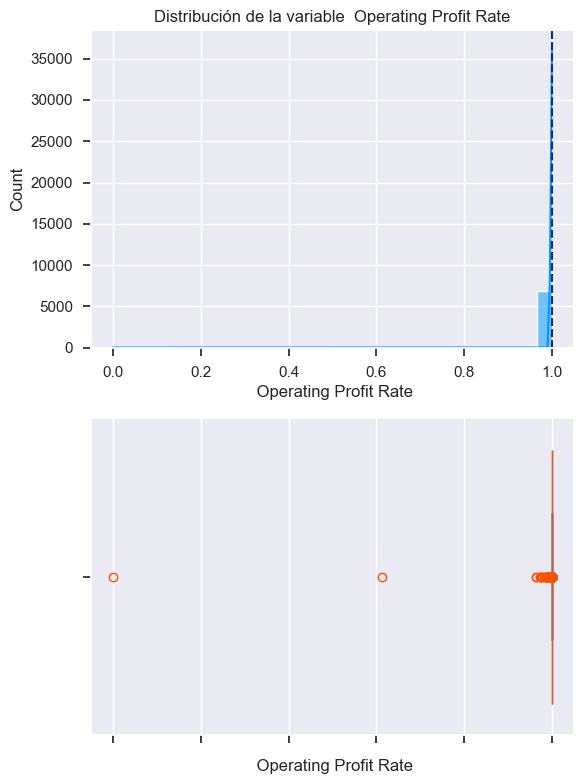

count    6819.000000
mean        0.998755
std         0.013010
min         0.000000
25%         0.998969
50%         0.999022
75%         0.999095
max         1.000000
Name:  Operating Profit Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Pre-tax net Interest Rate


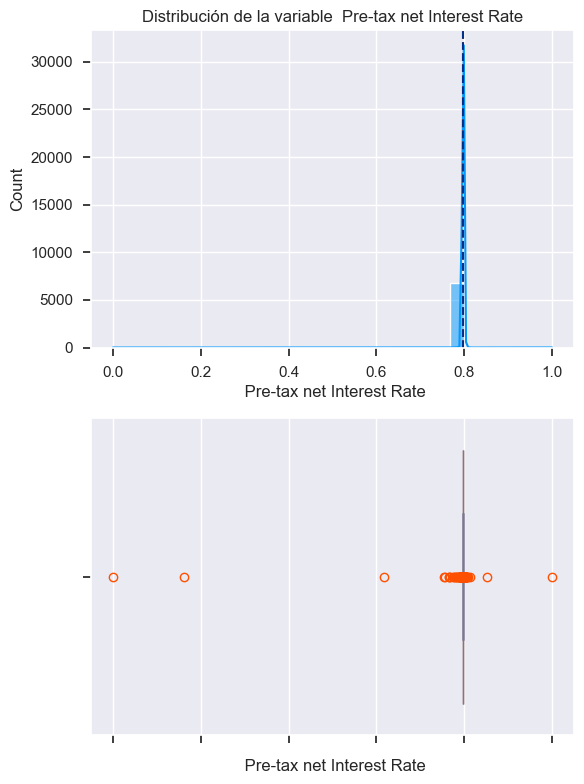

count    6819.000000
mean        0.797190
std         0.012869
min         0.000000
25%         0.797386
50%         0.797464
75%         0.797579
max         1.000000
Name:  Pre-tax net Interest Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  After-tax net Interest Rate


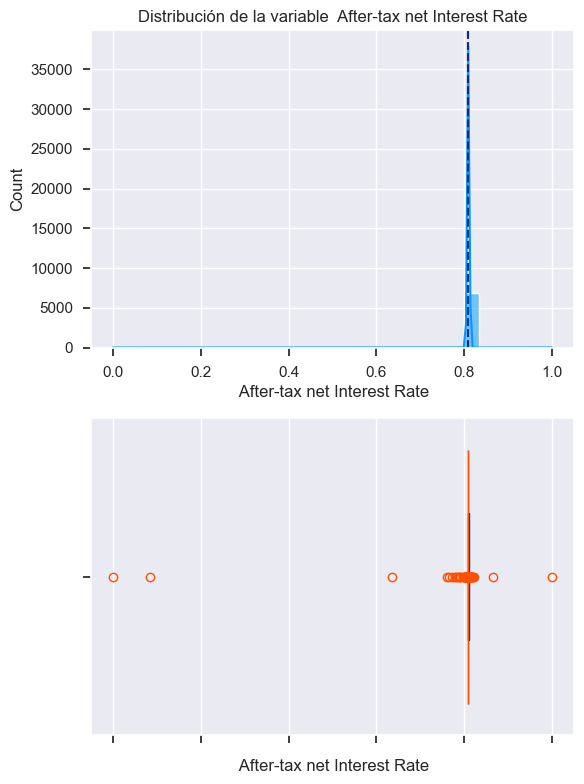

count    6819.000000
mean        0.809084
std         0.013601
min         0.000000
25%         0.809312
50%         0.809375
75%         0.809469
max         1.000000
Name:  After-tax net Interest Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Non-industry income and expenditure/revenue


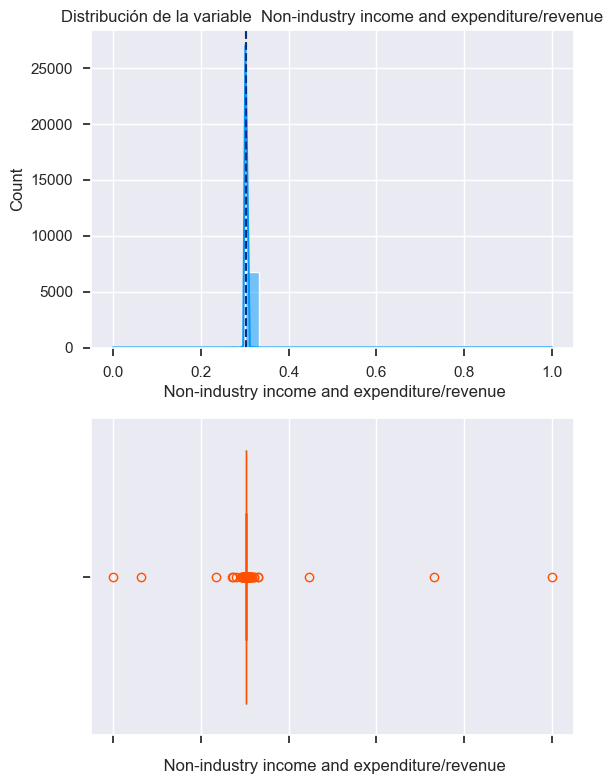

count    6819.000000
mean        0.303623
std         0.011163
min         0.000000
25%         0.303466
50%         0.303525
75%         0.303585
max         1.000000
Name:  Non-industry income and expenditure/revenue, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Continuous interest rate (after tax)


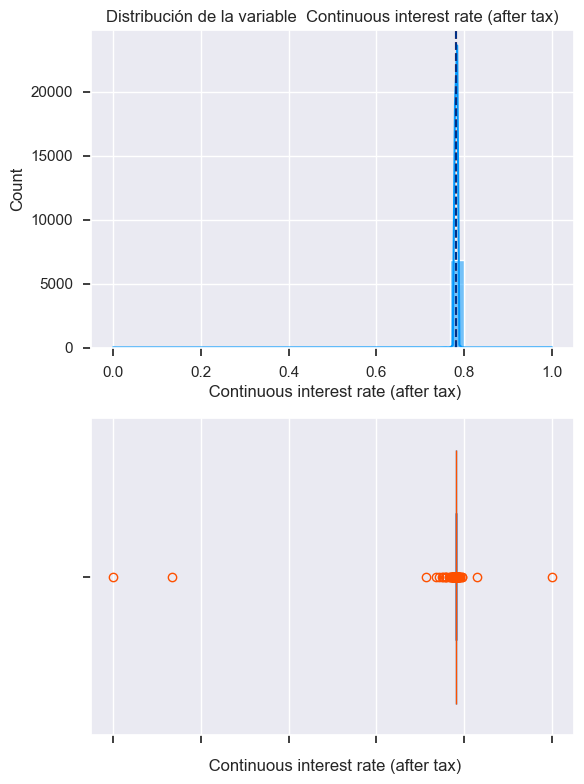

count    6819.000000
mean        0.781381
std         0.012679
min         0.000000
25%         0.781567
50%         0.781635
75%         0.781735
max         1.000000
Name:  Continuous interest rate (after tax), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Operating Expense Rate


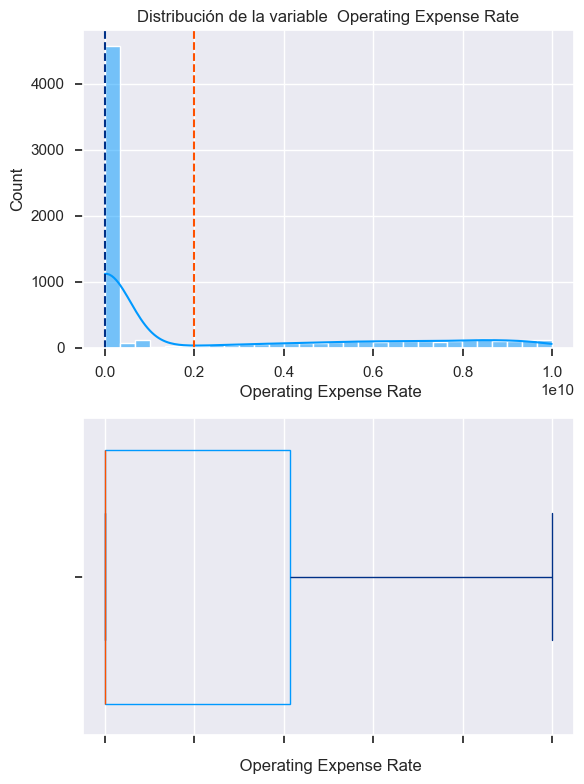

count    6.819000e+03
mean     1.995347e+09
std      3.237684e+09
min      0.000000e+00
25%      1.566874e-04
50%      2.777589e-04
75%      4.145000e+09
max      9.990000e+09
Name:  Operating Expense Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Research and development expense rate


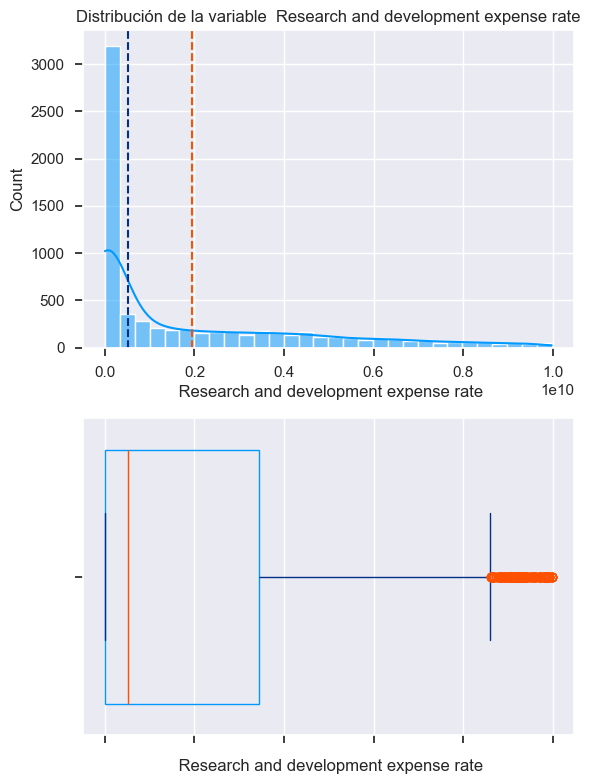

count    6.819000e+03
mean     1.950427e+09
std      2.598292e+09
min      0.000000e+00
25%      1.281880e-04
50%      5.090000e+08
75%      3.450000e+09
max      9.980000e+09
Name:  Research and development expense rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Cash flow rate


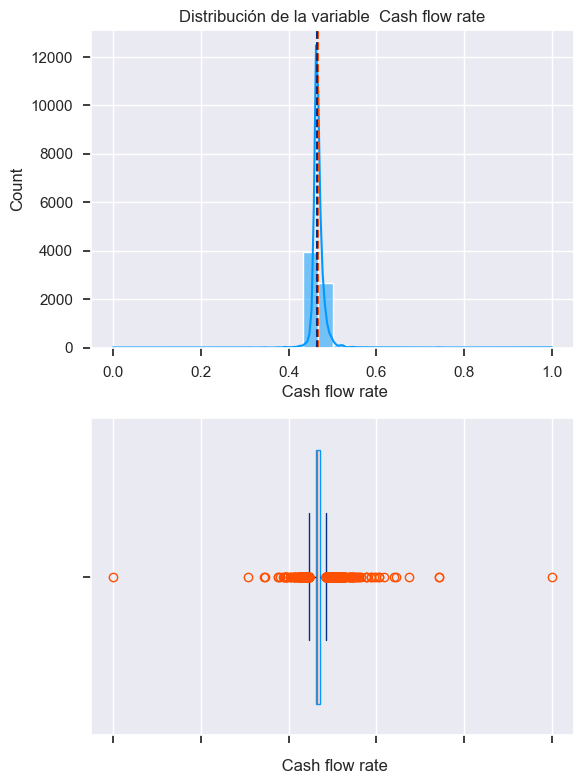

count    6819.000000
mean        0.467431
std         0.017036
min         0.000000
25%         0.461558
50%         0.465080
75%         0.471004
max         1.000000
Name:  Cash flow rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Interest-bearing debt interest rate


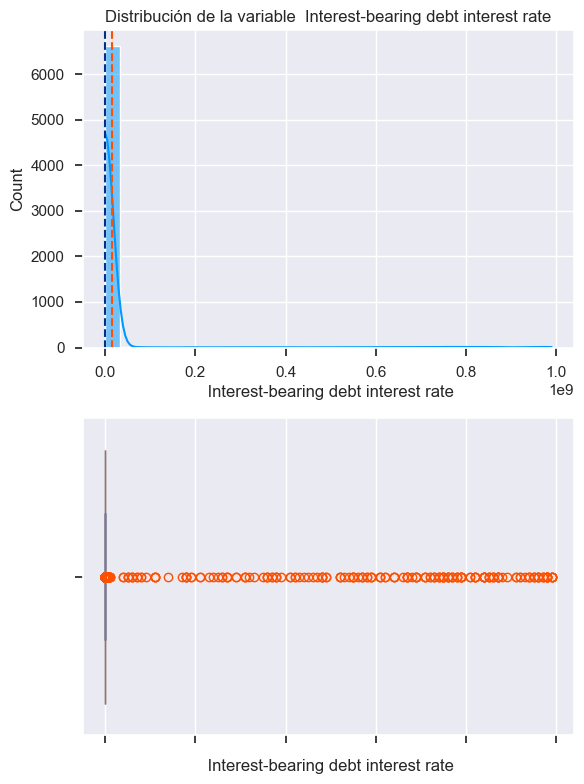

count    6.819000e+03
mean     1.644801e+07
std      1.082750e+08
min      0.000000e+00
25%      2.030203e-04
50%      3.210321e-04
75%      5.325533e-04
max      9.900000e+08
Name:  Interest-bearing debt interest rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Tax rate (A)


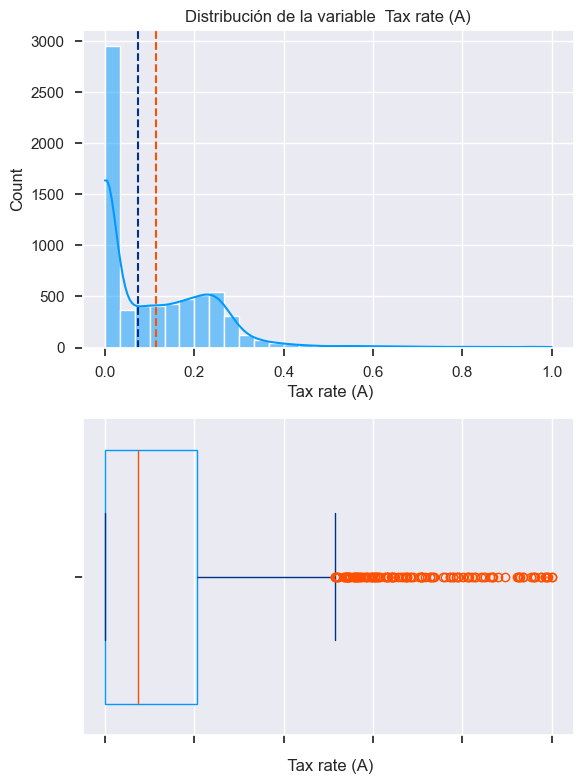

count    6819.000000
mean        0.115001
std         0.138667
min         0.000000
25%         0.000000
50%         0.073489
75%         0.205841
max         1.000000
Name:  Tax rate (A), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Net Value Per Share (B)


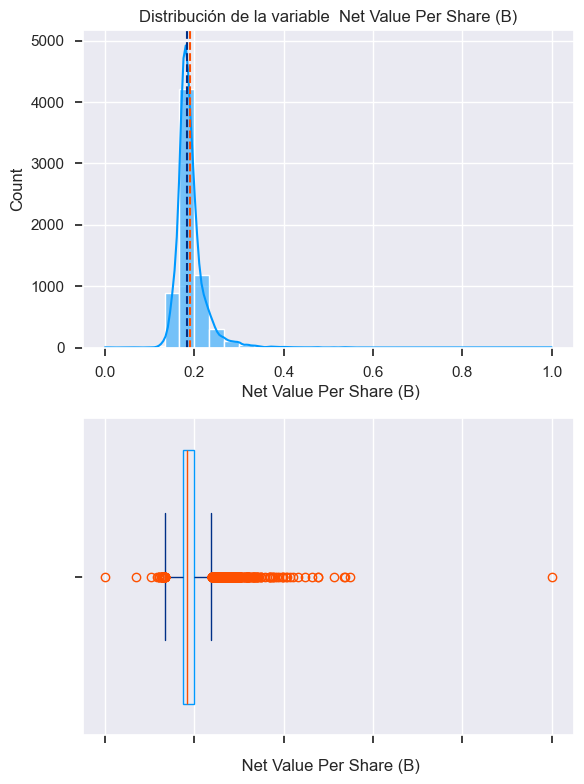

count    6819.000000
mean        0.190661
std         0.033390
min         0.000000
25%         0.173613
50%         0.184400
75%         0.199570
max         1.000000
Name:  Net Value Per Share (B), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Net Value Per Share (A)


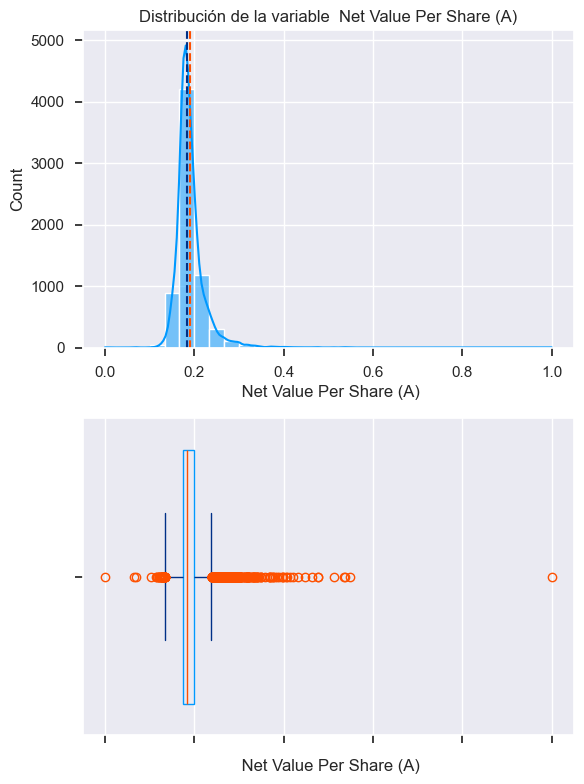

count    6819.000000
mean        0.190633
std         0.033474
min         0.000000
25%         0.173613
50%         0.184400
75%         0.199570
max         1.000000
Name:  Net Value Per Share (A), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Net Value Per Share (C)


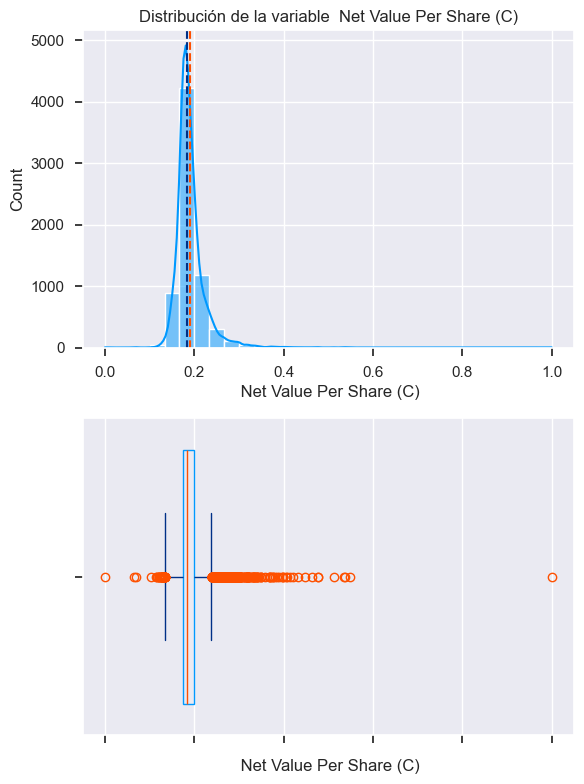

count    6819.000000
mean        0.190672
std         0.033480
min         0.000000
25%         0.173676
50%         0.184400
75%         0.199612
max         1.000000
Name:  Net Value Per Share (C), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Persistent EPS in the Last Four Seasons


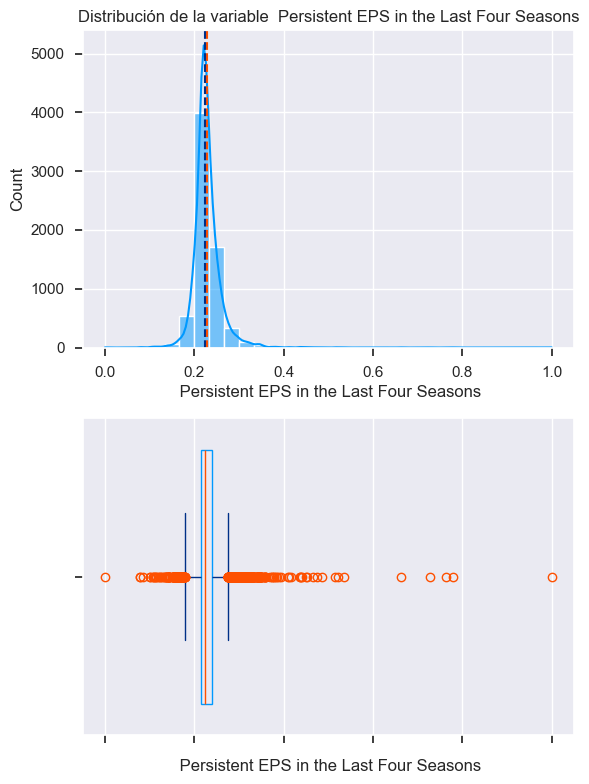

count    6819.000000
mean        0.228813
std         0.033263
min         0.000000
25%         0.214711
50%         0.224544
75%         0.238820
max         1.000000
Name:  Persistent EPS in the Last Four Seasons, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Cash Flow Per Share


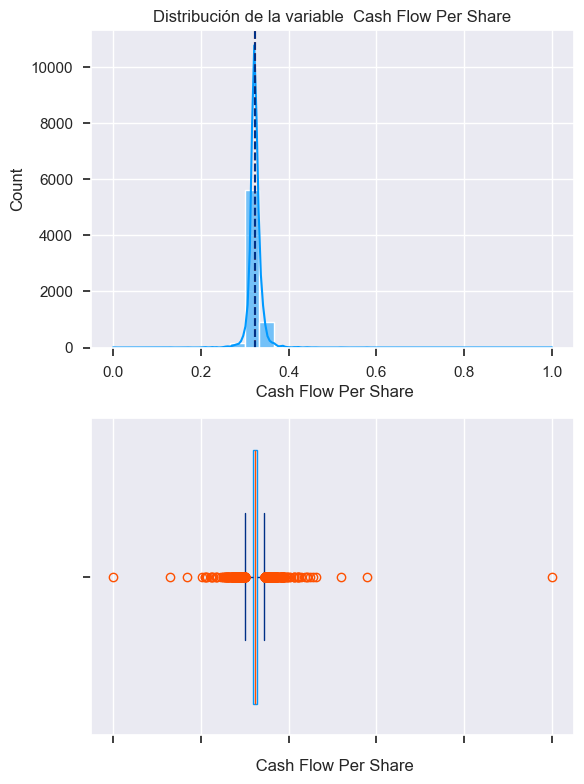

count    6819.000000
mean        0.323482
std         0.017611
min         0.000000
25%         0.317748
50%         0.322487
75%         0.328623
max         1.000000
Name:  Cash Flow Per Share, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Revenue Per Share (Yuan ¥)


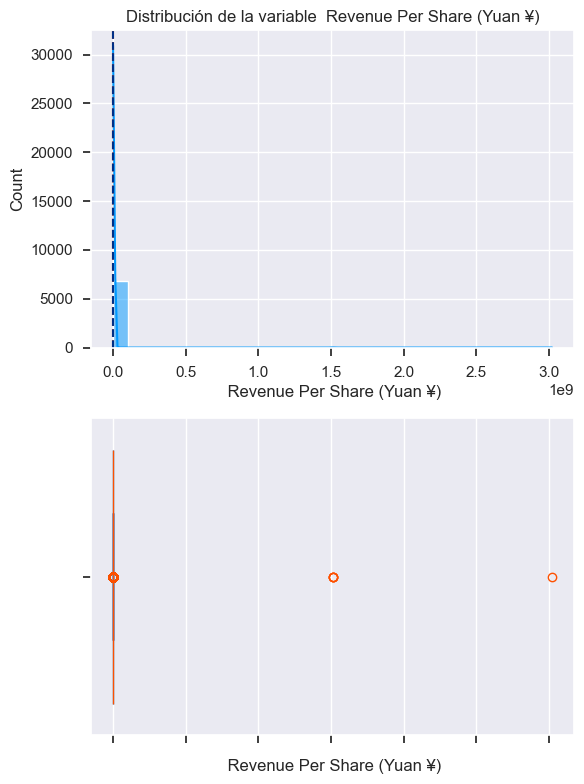

count    6.819000e+03
mean     1.328641e+06
std      5.170709e+07
min      0.000000e+00
25%      1.563138e-02
50%      2.737571e-02
75%      4.635722e-02
max      3.020000e+09
Name:  Revenue Per Share (Yuan ¥), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Operating Profit Per Share (Yuan ¥)


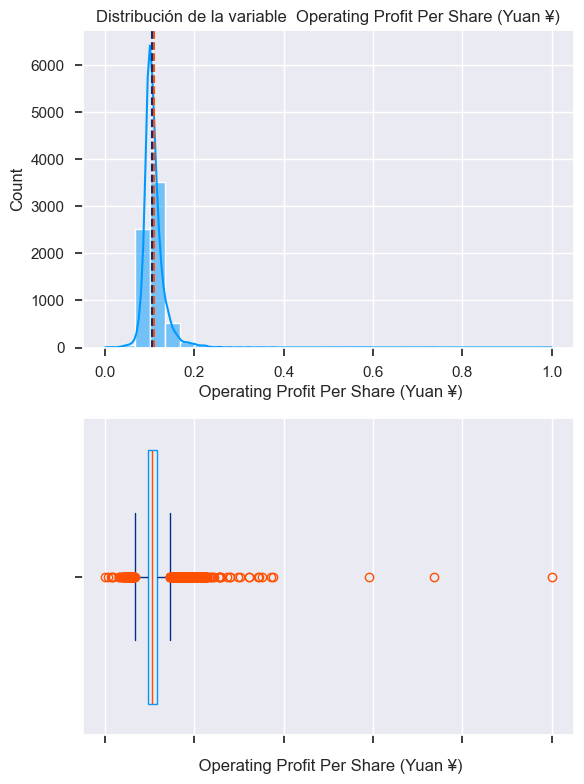

count    6819.000000
mean        0.109091
std         0.027942
min         0.000000
25%         0.096083
50%         0.104226
75%         0.116155
max         1.000000
Name:  Operating Profit Per Share (Yuan ¥), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Per Share Net profit before tax (Yuan ¥)


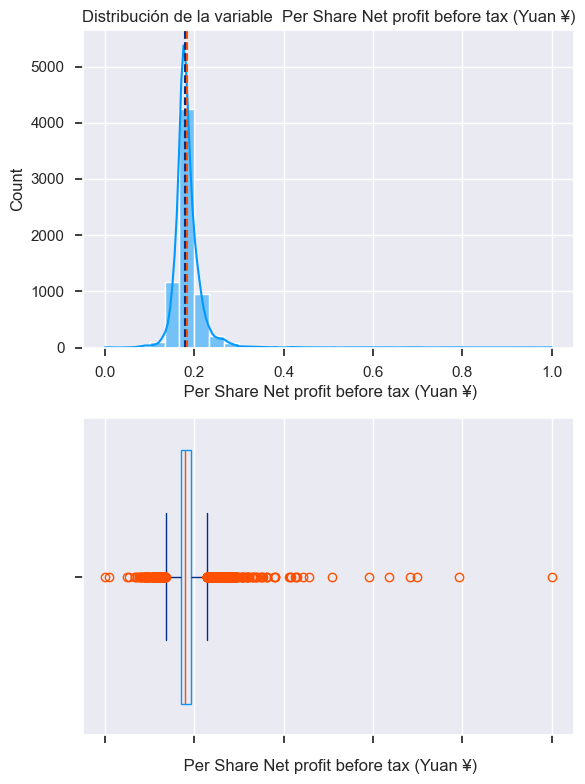

count    6819.000000
mean        0.184361
std         0.033180
min         0.000000
25%         0.170370
50%         0.179709
75%         0.193493
max         1.000000
Name:  Per Share Net profit before tax (Yuan ¥), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Realized Sales Gross Profit Growth Rate


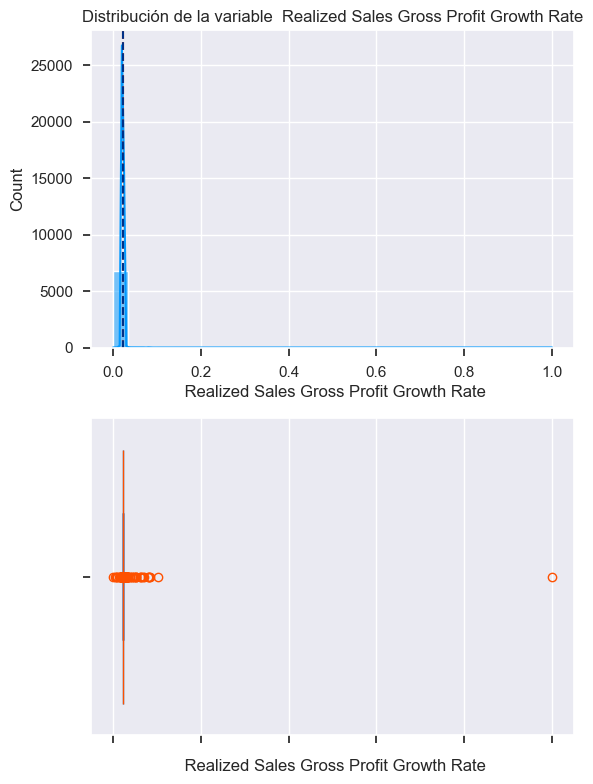

count    6819.000000
mean        0.022408
std         0.012079
min         0.000000
25%         0.022065
50%         0.022102
75%         0.022153
max         1.000000
Name:  Realized Sales Gross Profit Growth Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Operating Profit Growth Rate


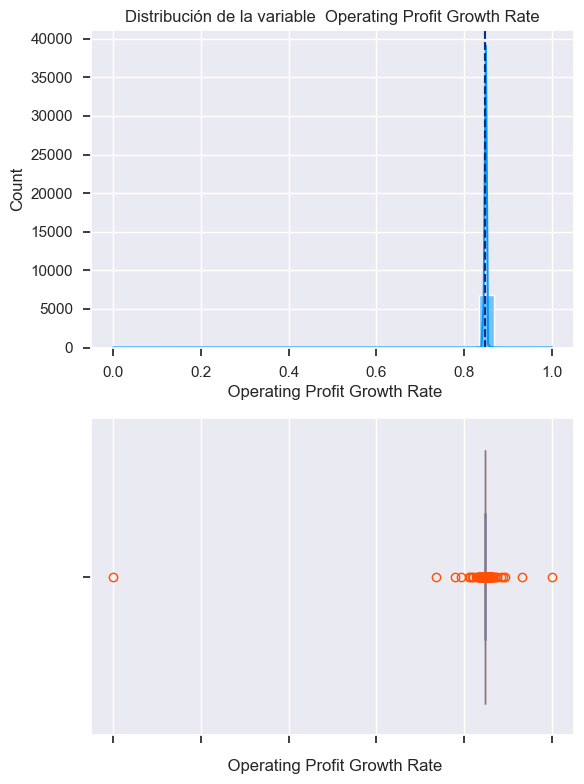

count    6819.000000
mean        0.847980
std         0.010752
min         0.000000
25%         0.847984
50%         0.848044
75%         0.848123
max         1.000000
Name:  Operating Profit Growth Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  After-tax Net Profit Growth Rate


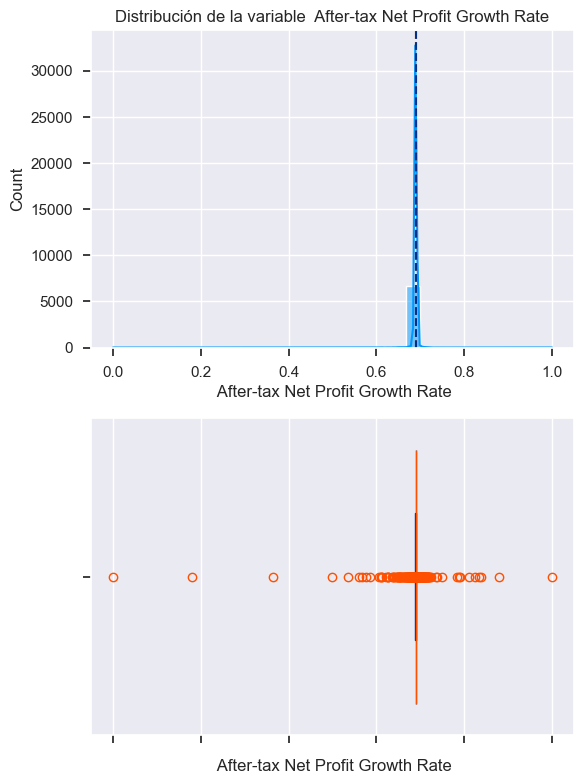

count    6819.000000
mean        0.689146
std         0.013853
min         0.000000
25%         0.689270
50%         0.689439
75%         0.689647
max         1.000000
Name:  After-tax Net Profit Growth Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Regular Net Profit Growth Rate


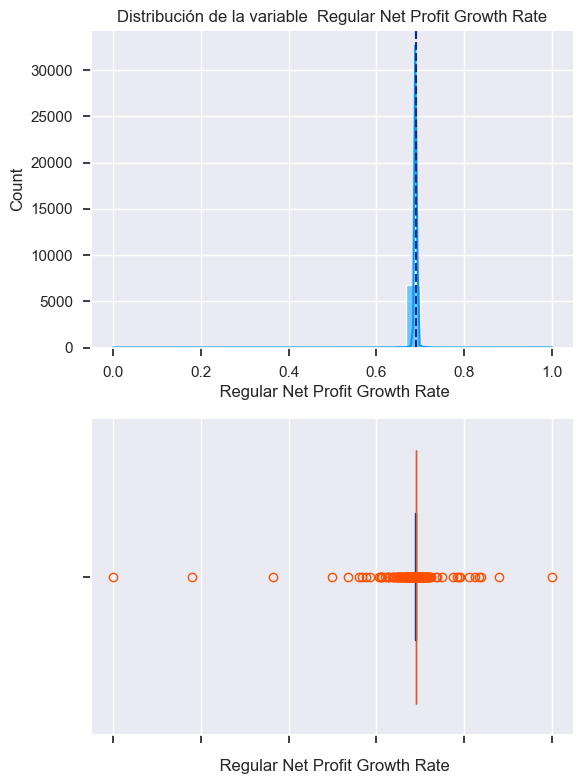

count    6819.000000
mean        0.689150
std         0.013910
min         0.000000
25%         0.689270
50%         0.689439
75%         0.689647
max         1.000000
Name:  Regular Net Profit Growth Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Continuous Net Profit Growth Rate


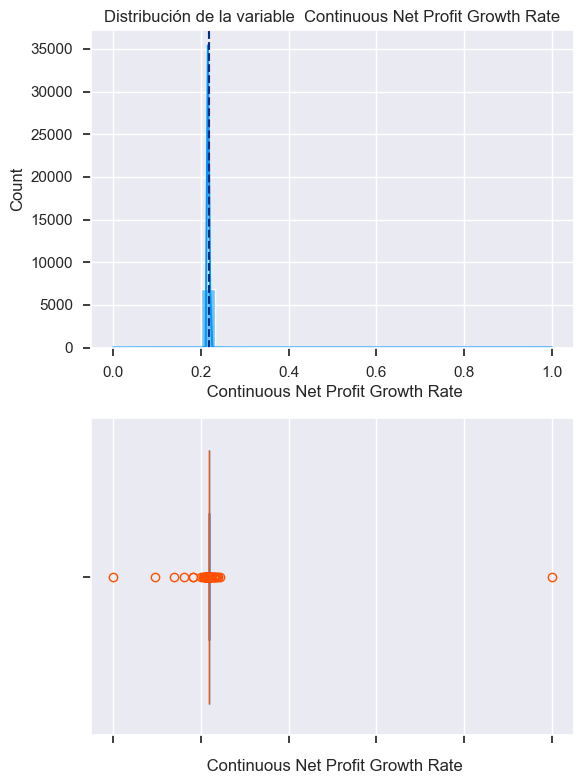

count    6819.000000
mean        0.217639
std         0.010063
min         0.000000
25%         0.217580
50%         0.217598
75%         0.217622
max         1.000000
Name:  Continuous Net Profit Growth Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Total Asset Growth Rate


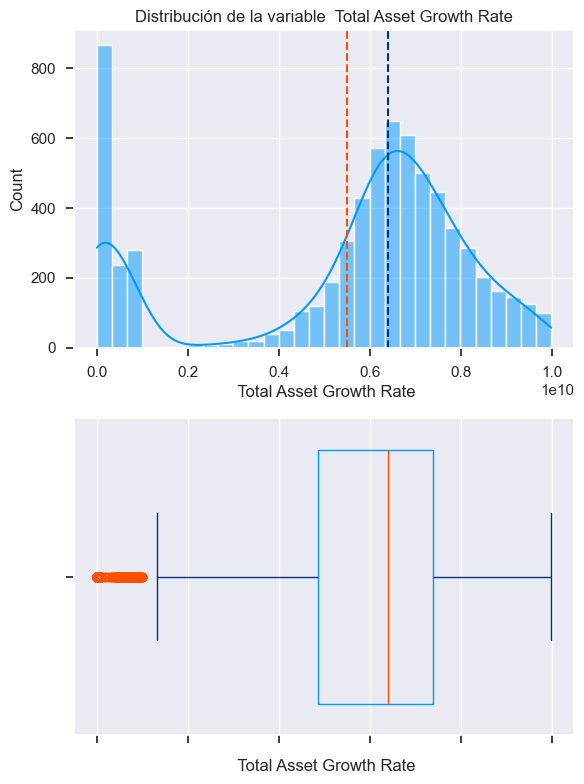

count    6.819000e+03
mean     5.508097e+09
std      2.897718e+09
min      0.000000e+00
25%      4.860000e+09
50%      6.400000e+09
75%      7.390000e+09
max      9.990000e+09
Name:  Total Asset Growth Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Net Value Growth Rate


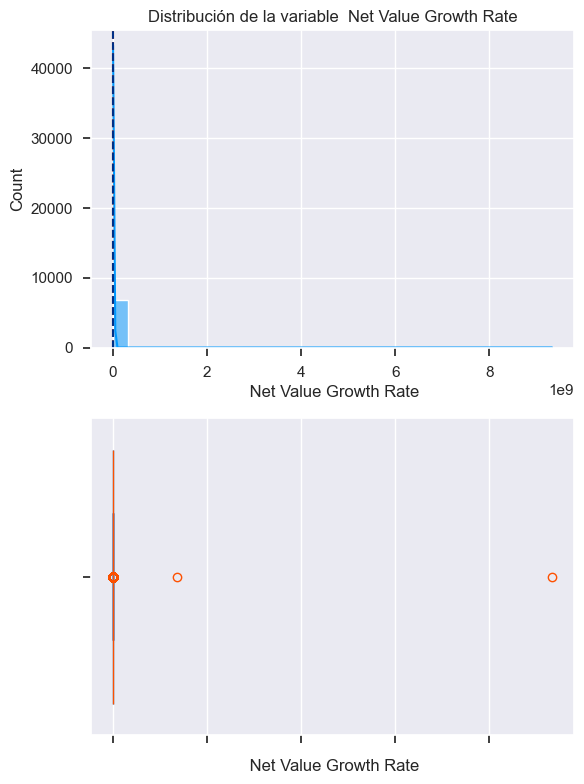

count    6.819000e+03
mean     1.566212e+06
std      1.141594e+08
min      0.000000e+00
25%      4.409689e-04
50%      4.619555e-04
75%      4.993621e-04
max      9.330000e+09
Name:  Net Value Growth Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Total Asset Return Growth Rate Ratio


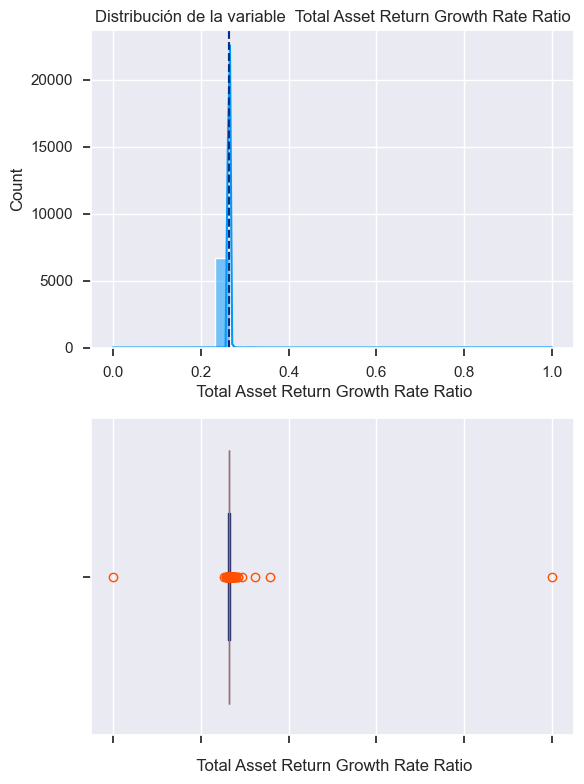

count    6819.000000
mean        0.264248
std         0.009634
min         0.000000
25%         0.263759
50%         0.264050
75%         0.264388
max         1.000000
Name:  Total Asset Return Growth Rate Ratio, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Cash Reinvestment %


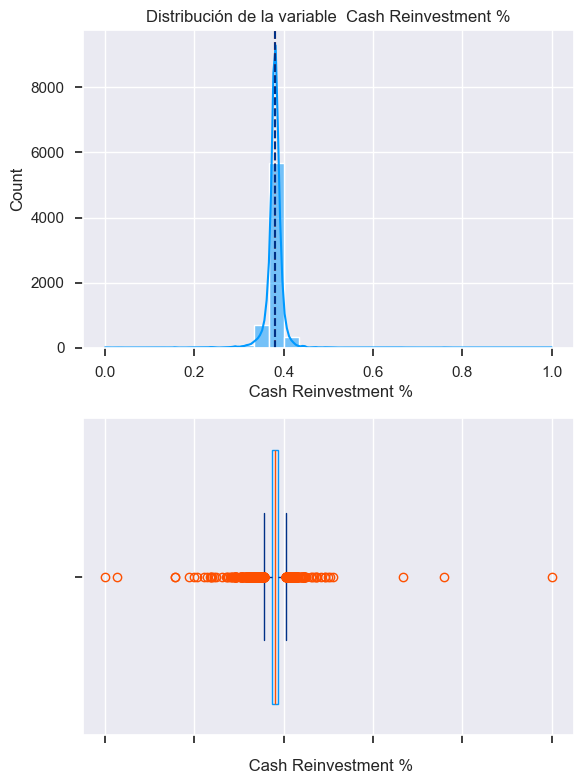

count    6819.000000
mean        0.379677
std         0.020737
min         0.000000
25%         0.374749
50%         0.380425
75%         0.386731
max         1.000000
Name:  Cash Reinvestment %, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Current Ratio


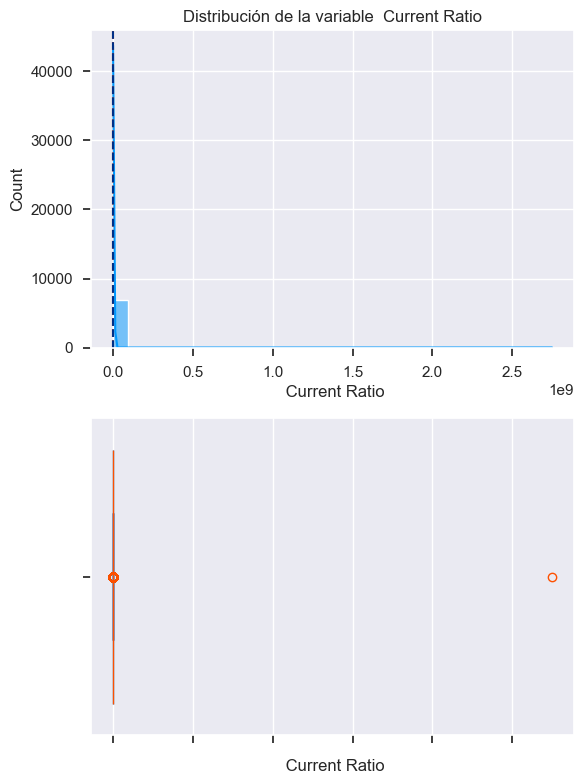

count    6.819000e+03
mean     4.032850e+05
std      3.330216e+07
min      0.000000e+00
25%      7.555047e-03
50%      1.058717e-02
75%      1.626953e-02
max      2.750000e+09
Name:  Current Ratio, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Quick Ratio


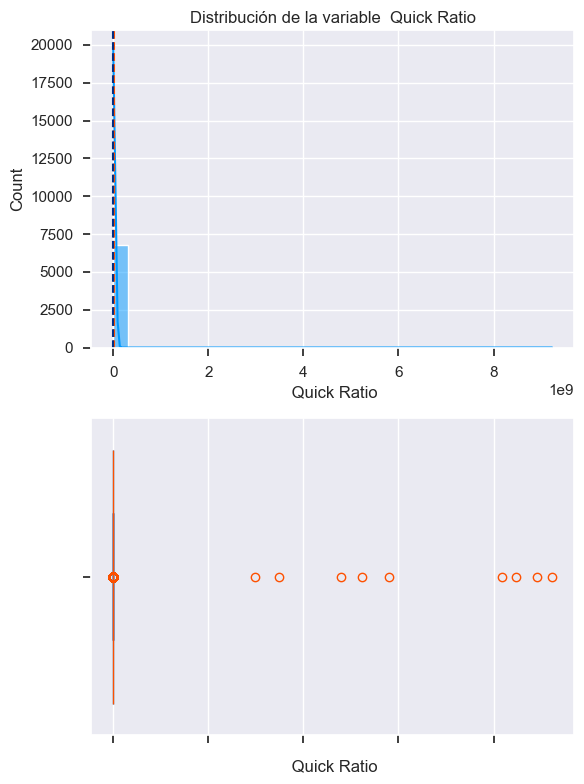

count    6.819000e+03
mean     8.376595e+06
std      2.446847e+08
min      0.000000e+00
25%      4.725903e-03
50%      7.412472e-03
75%      1.224911e-02
max      9.230000e+09
Name:  Quick Ratio, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Interest Expense Ratio


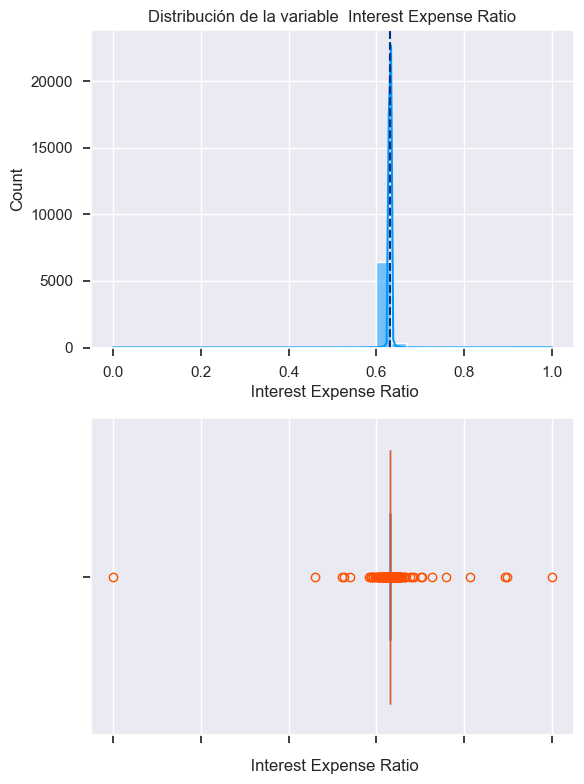

count    6819.000000
mean        0.630991
std         0.011238
min         0.000000
25%         0.630612
50%         0.630698
75%         0.631125
max         1.000000
Name:  Interest Expense Ratio, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Total debt/Total net worth


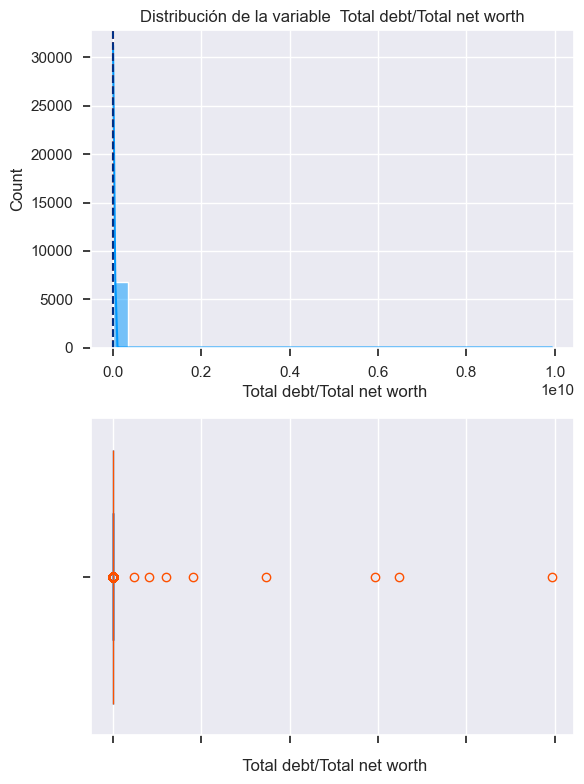

count    6.819000e+03
mean     4.416337e+06
std      1.684069e+08
min      0.000000e+00
25%      3.007049e-03
50%      5.546284e-03
75%      9.273293e-03
max      9.940000e+09
Name:  Total debt/Total net worth, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Debt ratio %


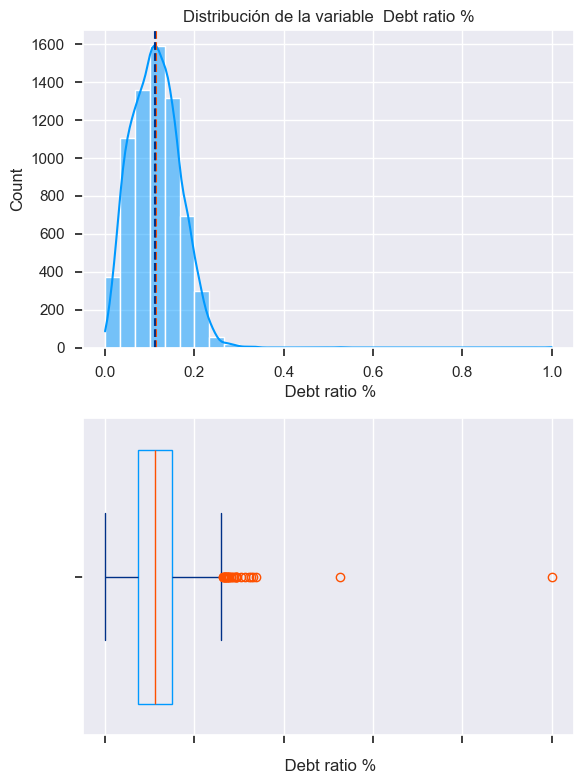

count    6819.000000
mean        0.113177
std         0.053920
min         0.000000
25%         0.072891
50%         0.111407
75%         0.148804
max         1.000000
Name:  Debt ratio %, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Net worth/Assets


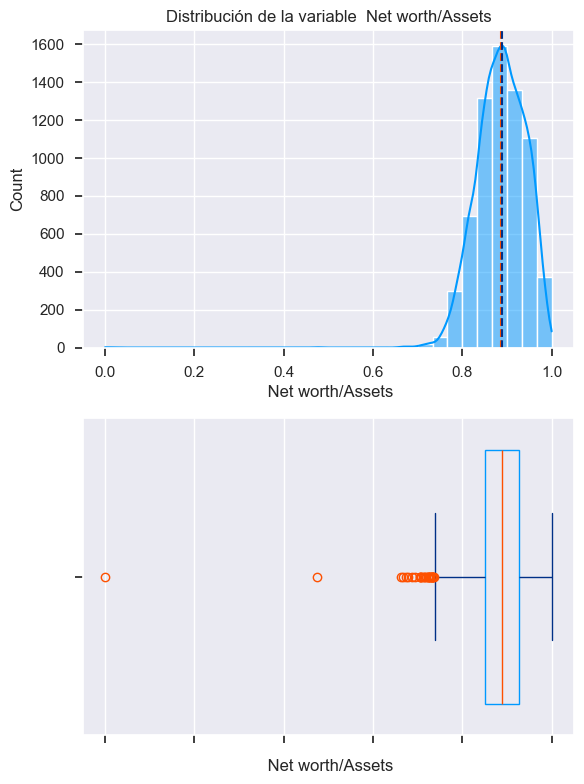

count    6819.000000
mean        0.886823
std         0.053920
min         0.000000
25%         0.851196
50%         0.888593
75%         0.927109
max         1.000000
Name:  Net worth/Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Long-term fund suitability ratio (A)


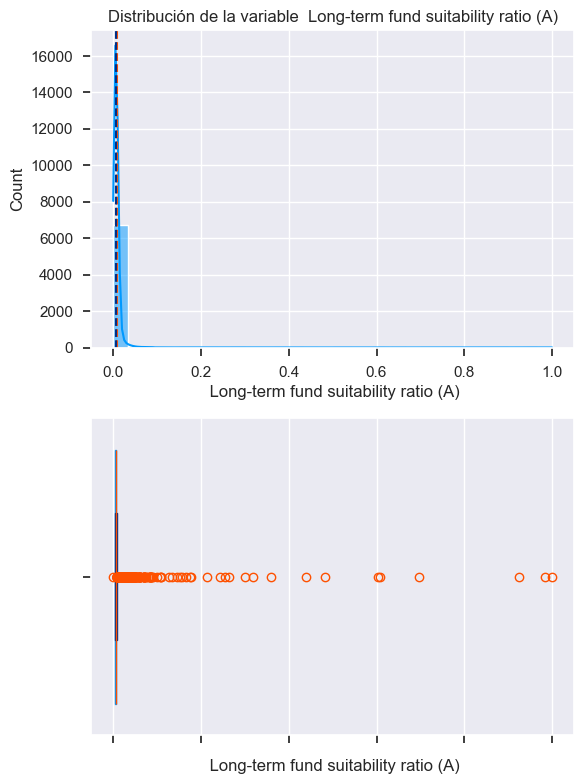

count    6819.000000
mean        0.008783
std         0.028153
min         0.000000
25%         0.005244
50%         0.005665
75%         0.006847
max         1.000000
Name:  Long-term fund suitability ratio (A), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Borrowing dependency


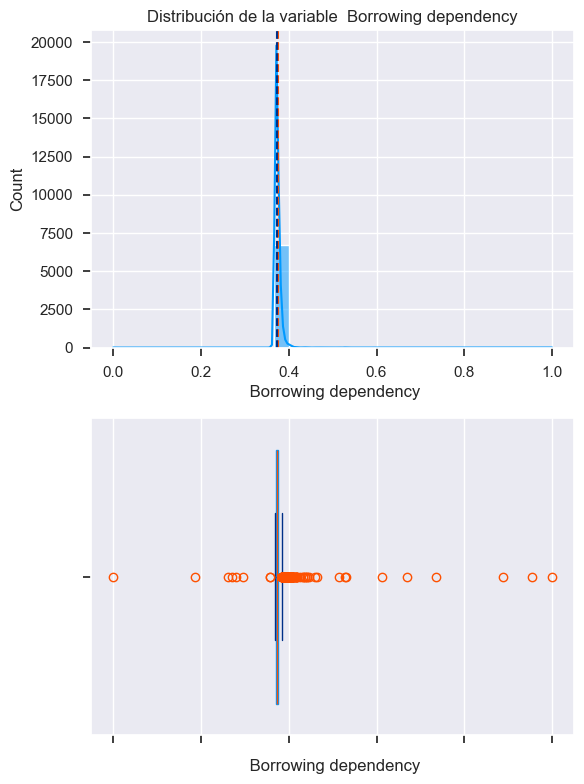

count    6819.000000
mean        0.374654
std         0.016286
min         0.000000
25%         0.370168
50%         0.372624
75%         0.376271
max         1.000000
Name:  Borrowing dependency, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Contingent liabilities/Net worth


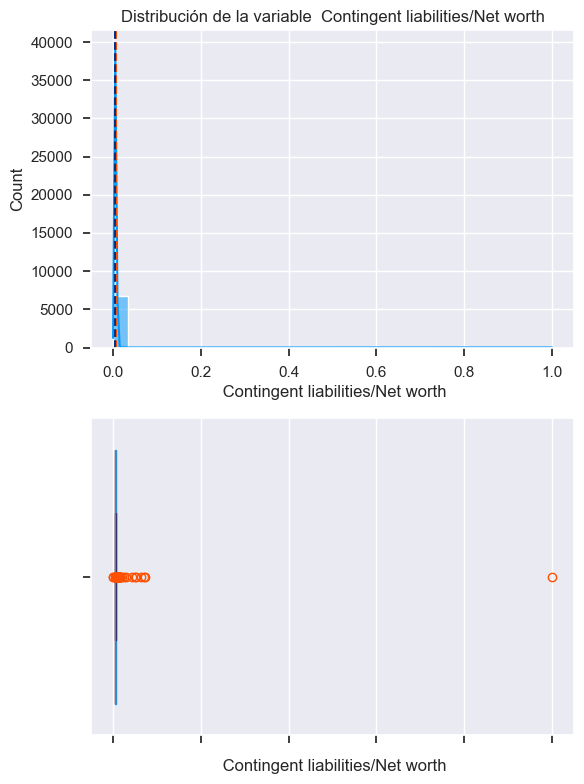

count    6819.000000
mean        0.005968
std         0.012188
min         0.000000
25%         0.005366
50%         0.005366
75%         0.005764
max         1.000000
Name:  Contingent liabilities/Net worth, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Operating profit/Paid-in capital


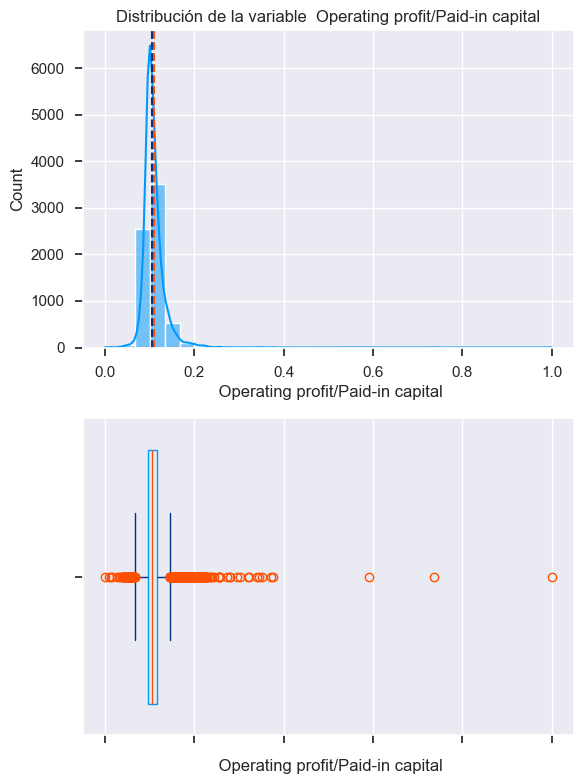

count    6819.000000
mean        0.108977
std         0.027782
min         0.000000
25%         0.096105
50%         0.104133
75%         0.115927
max         1.000000
Name:  Operating profit/Paid-in capital, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Net profit before tax/Paid-in capital


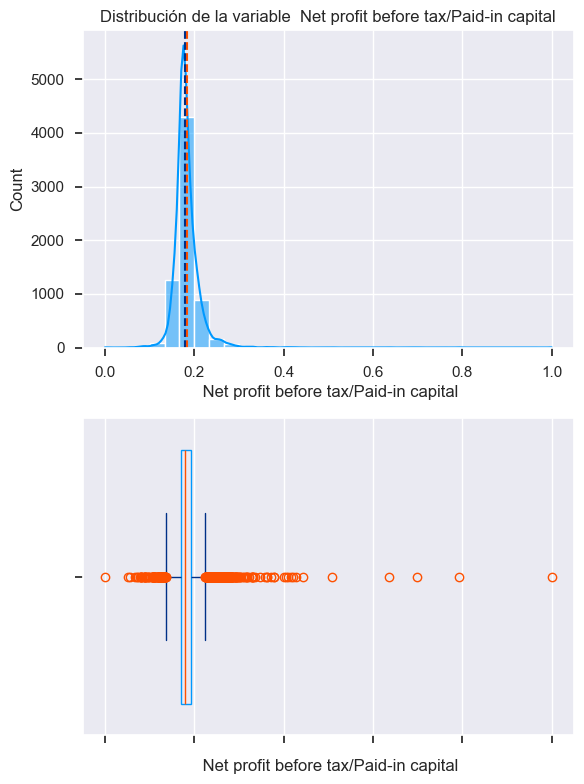

count    6819.000000
mean        0.182715
std         0.030785
min         0.000000
25%         0.169376
50%         0.178456
75%         0.191607
max         1.000000
Name:  Net profit before tax/Paid-in capital, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Inventory and accounts receivable/Net value


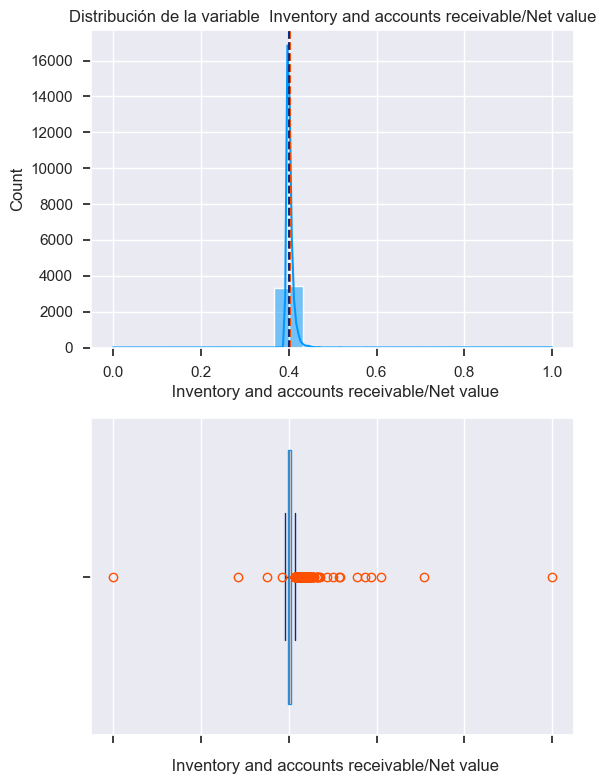

count    6819.000000
mean        0.402459
std         0.013324
min         0.000000
25%         0.397403
50%         0.400131
75%         0.404551
max         1.000000
Name:  Inventory and accounts receivable/Net value, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Total Asset Turnover


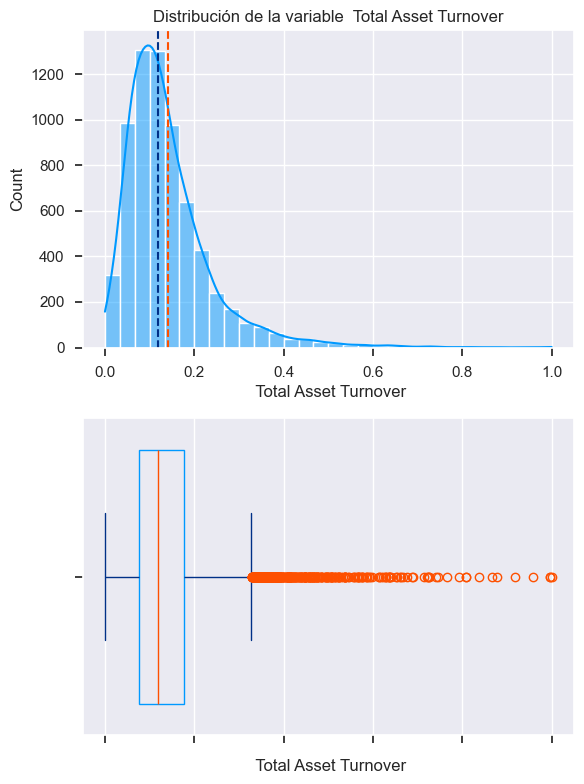

count    6819.000000
mean        0.141606
std         0.101145
min         0.000000
25%         0.076462
50%         0.118441
75%         0.176912
max         1.000000
Name:  Total Asset Turnover, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Accounts Receivable Turnover


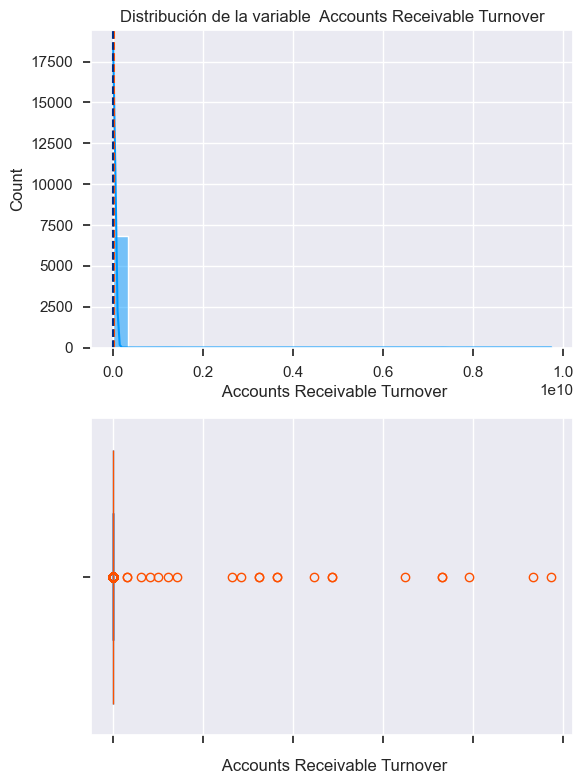

count    6.819000e+03
mean     1.278971e+07
std      2.782598e+08
min      0.000000e+00
25%      7.101336e-04
50%      9.678107e-04
75%      1.454759e-03
max      9.740000e+09
Name:  Accounts Receivable Turnover, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Average Collection Days


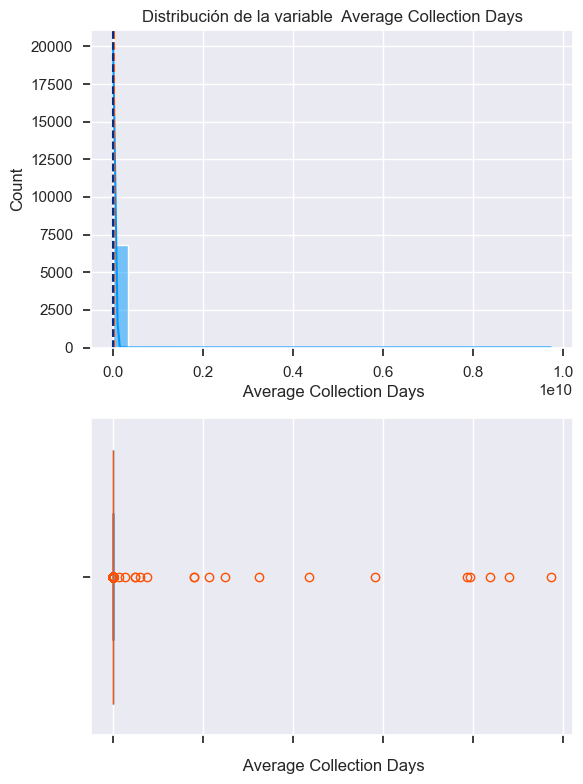

count    6.819000e+03
mean     9.826221e+06
std      2.563589e+08
min      0.000000e+00
25%      4.386530e-03
50%      6.572537e-03
75%      8.972876e-03
max      9.730000e+09
Name:  Average Collection Days, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Inventory Turnover Rate (times)


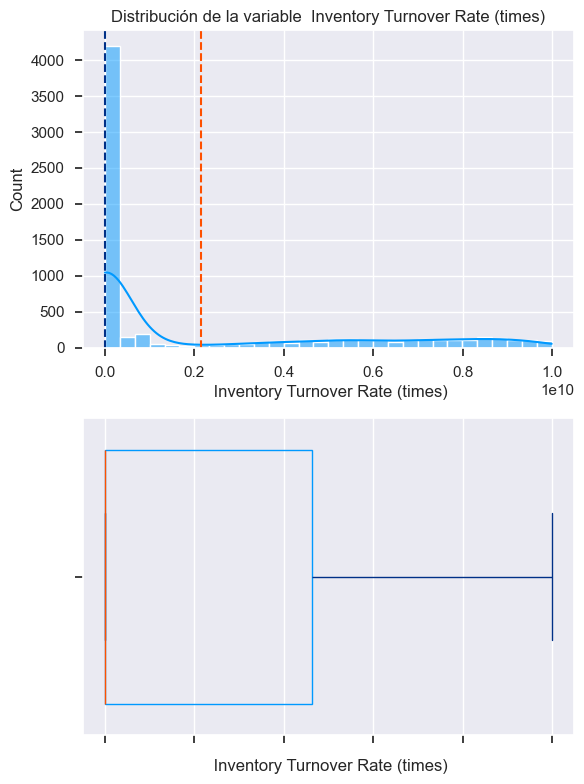

count    6.819000e+03
mean     2.149106e+09
std      3.247967e+09
min      0.000000e+00
25%      1.728256e-04
50%      7.646743e-04
75%      4.620000e+09
max      9.990000e+09
Name:  Inventory Turnover Rate (times), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Fixed Assets Turnover Frequency


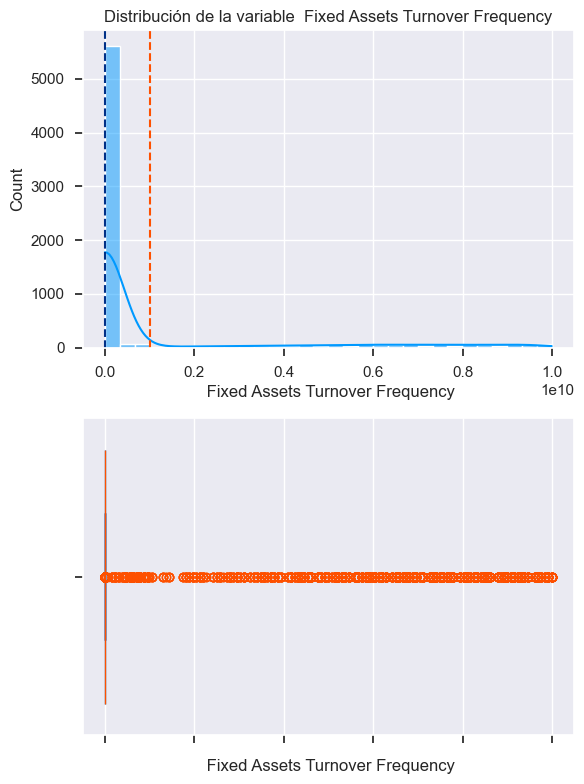

count    6.819000e+03
mean     1.008596e+09
std      2.477557e+09
min      0.000000e+00
25%      2.330013e-04
50%      5.930942e-04
75%      3.652371e-03
max      9.990000e+09
Name:  Fixed Assets Turnover Frequency, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Net Worth Turnover Rate (times)


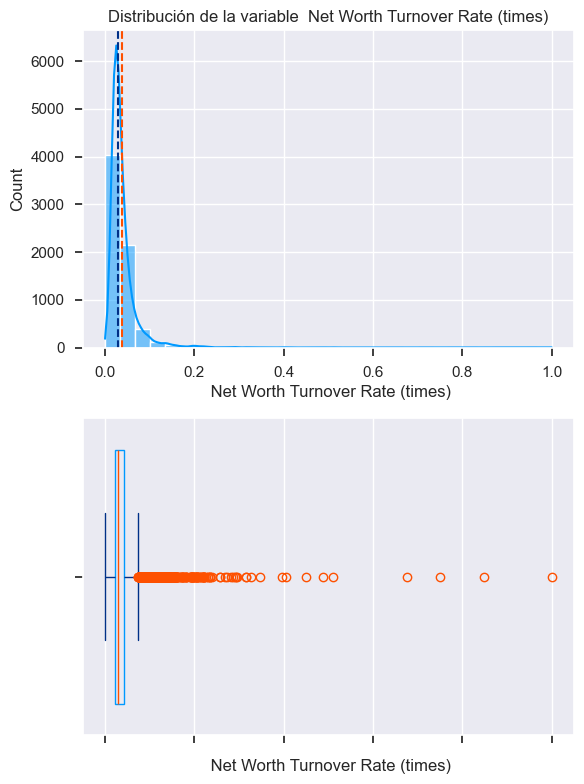

count    6819.000000
mean        0.038595
std         0.036680
min         0.000000
25%         0.021774
50%         0.029516
75%         0.042903
max         1.000000
Name:  Net Worth Turnover Rate (times), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Revenue per person


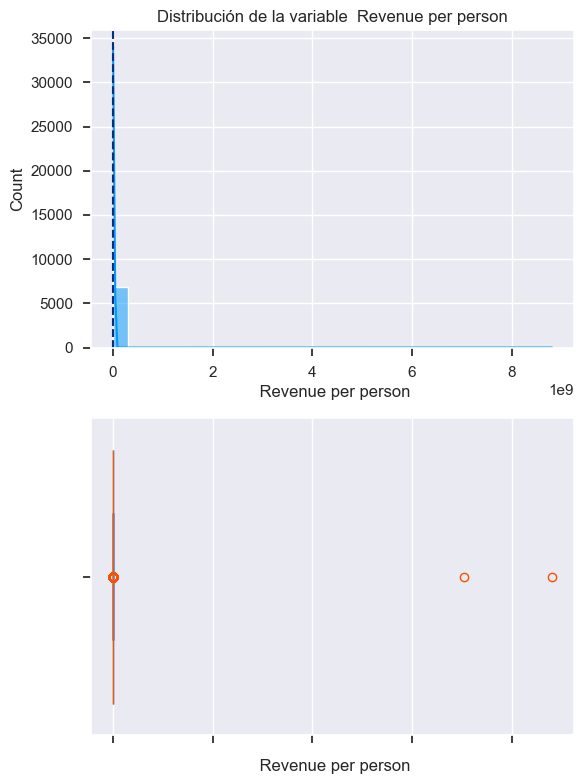

count    6.819000e+03
mean     2.325854e+06
std      1.366327e+08
min      0.000000e+00
25%      1.043285e-02
50%      1.861551e-02
75%      3.585477e-02
max      8.810000e+09
Name:  Revenue per person, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Operating profit per person


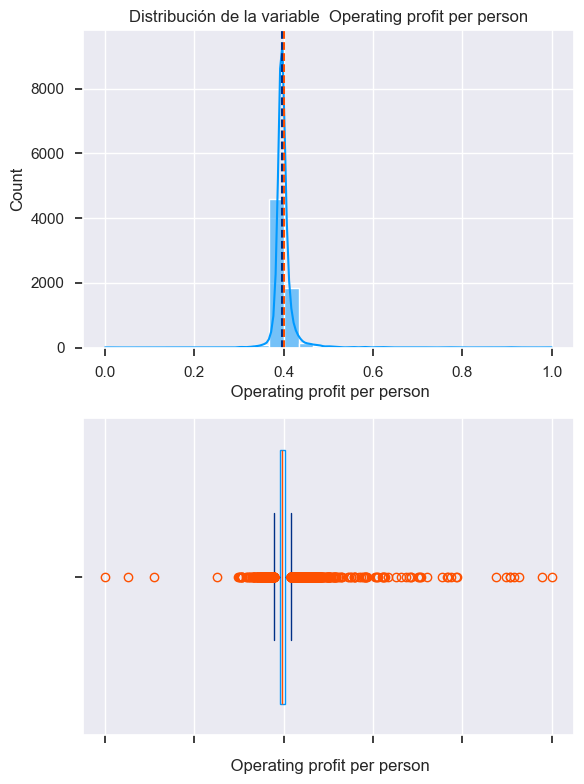

count    6819.000000
mean        0.400671
std         0.032720
min         0.000000
25%         0.392438
50%         0.395898
75%         0.401851
max         1.000000
Name:  Operating profit per person, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Allocation rate per person


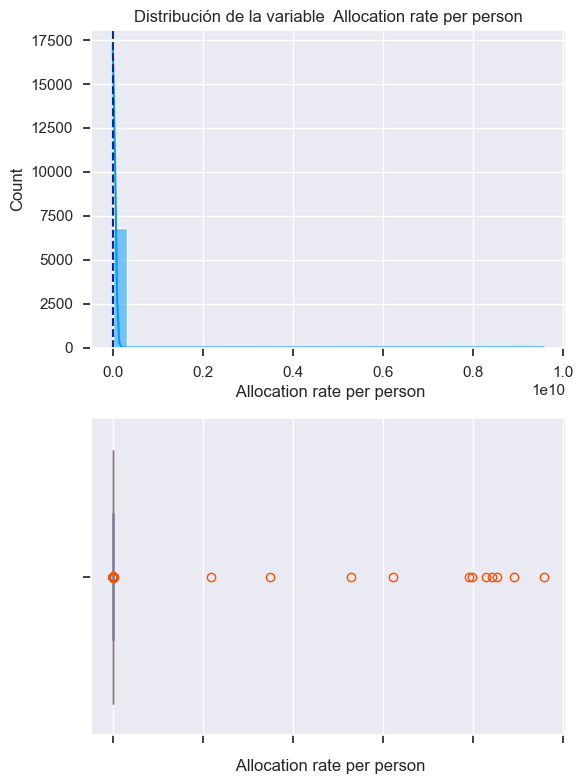

count    6.819000e+03
mean     1.125579e+07
std      2.945063e+08
min      0.000000e+00
25%      4.120529e-03
50%      7.844373e-03
75%      1.502031e-02
max      9.570000e+09
Name:  Allocation rate per person, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Working Capital to Total Assets


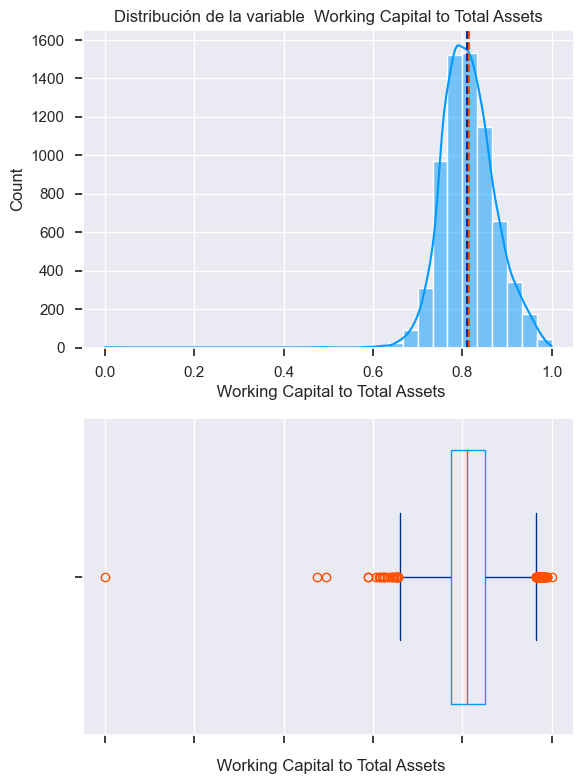

count    6819.000000
mean        0.814125
std         0.059054
min         0.000000
25%         0.774309
50%         0.810275
75%         0.850383
max         1.000000
Name:  Working Capital to Total Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Quick Assets/Total Assets


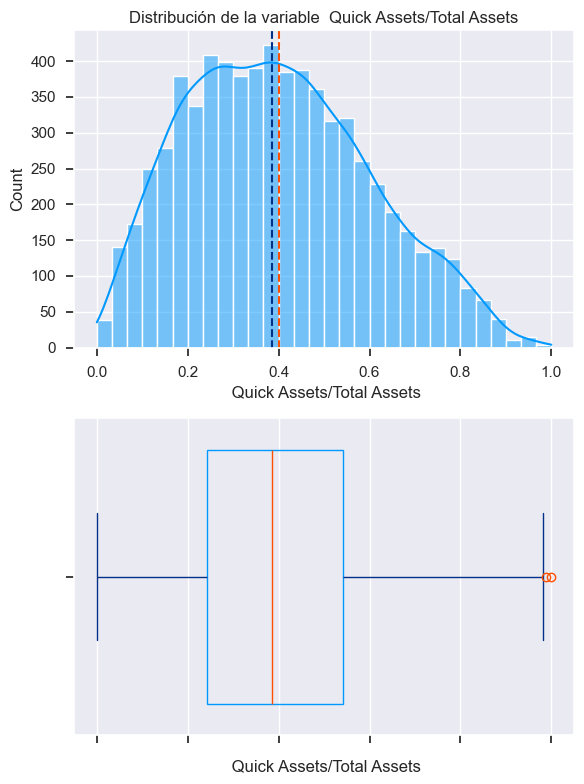

count    6819.000000
mean        0.400132
std         0.201998
min         0.000000
25%         0.241973
50%         0.386451
75%         0.540594
max         1.000000
Name:  Quick Assets/Total Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Current Assets/Total Assets


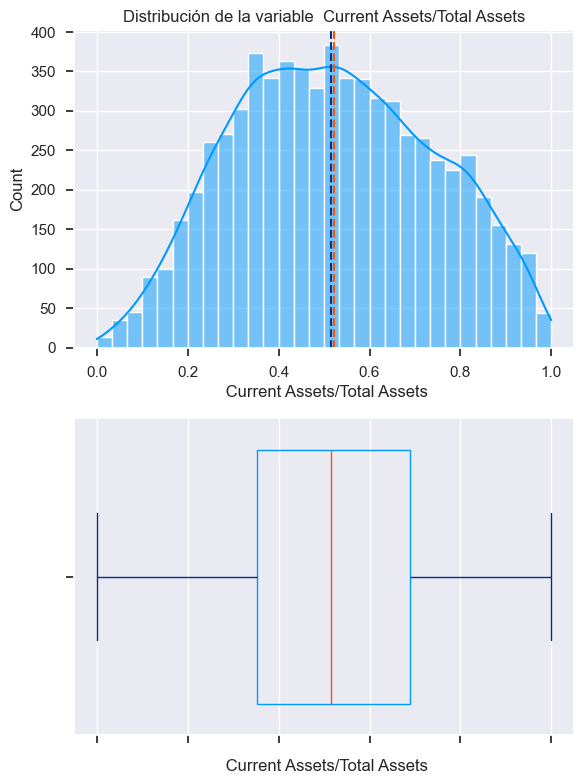

count    6819.000000
mean        0.522273
std         0.218112
min         0.000000
25%         0.352845
50%         0.514830
75%         0.689051
max         1.000000
Name:  Current Assets/Total Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Cash/Total Assets


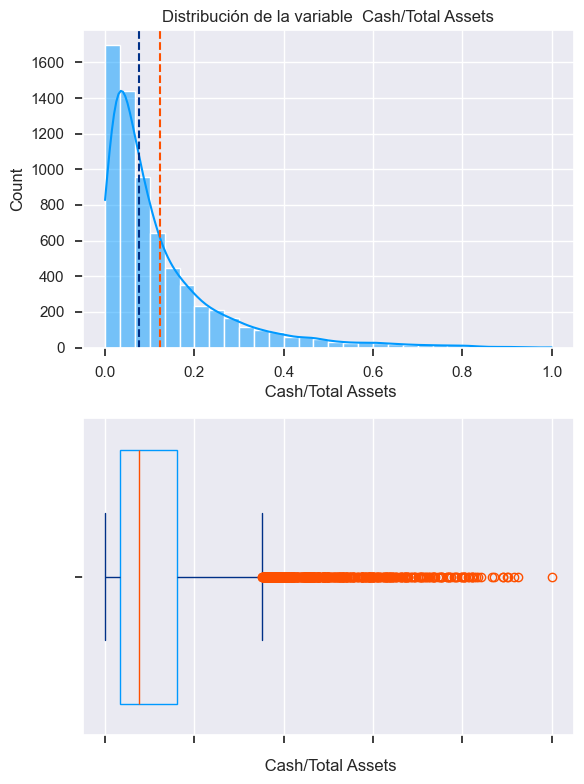

count    6819.000000
mean        0.124095
std         0.139251
min         0.000000
25%         0.033543
50%         0.074887
75%         0.161073
max         1.000000
Name:  Cash/Total Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Quick Assets/Current Liability


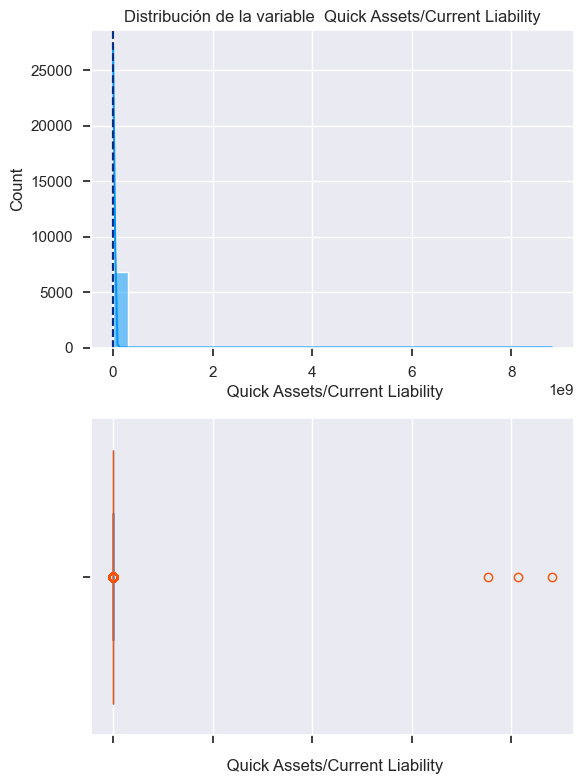

count    6.819000e+03
mean     3.592902e+06
std      1.716209e+08
min      0.000000e+00
25%      5.239776e-03
50%      7.908898e-03
75%      1.295091e-02
max      8.820000e+09
Name:  Quick Assets/Current Liability, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Cash/Current Liability


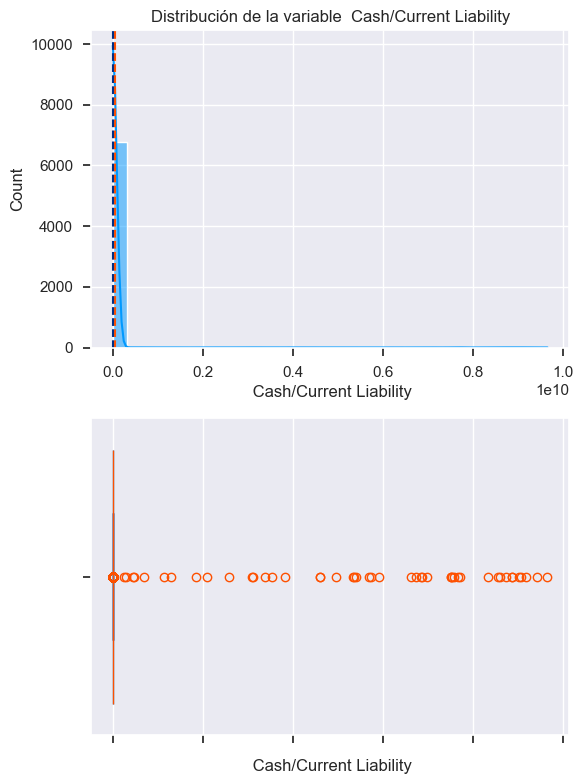

count    6.819000e+03
mean     3.715999e+07
std      5.103509e+08
min      0.000000e+00
25%      1.973008e-03
50%      4.903886e-03
75%      1.280557e-02
max      9.650000e+09
Name:  Cash/Current Liability, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Current Liability to Assets


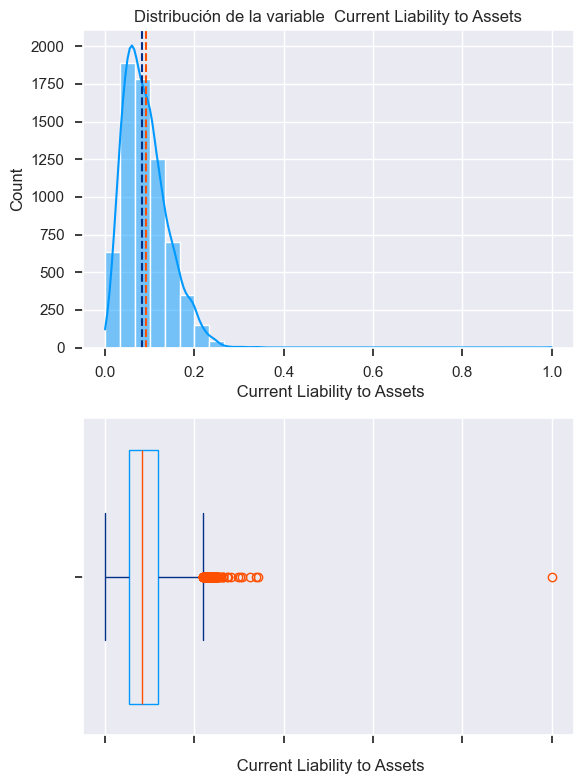

count    6819.000000
mean        0.090673
std         0.050290
min         0.000000
25%         0.053301
50%         0.082705
75%         0.119523
max         1.000000
Name:  Current Liability to Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Operating Funds to Liability


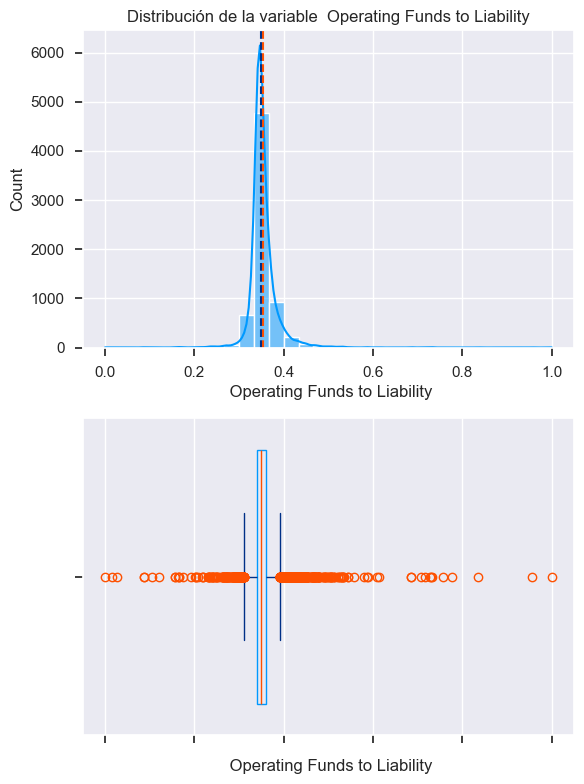

count    6819.000000
mean        0.353828
std         0.035147
min         0.000000
25%         0.341023
50%         0.348597
75%         0.360915
max         1.000000
Name:  Operating Funds to Liability, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Inventory/Working Capital


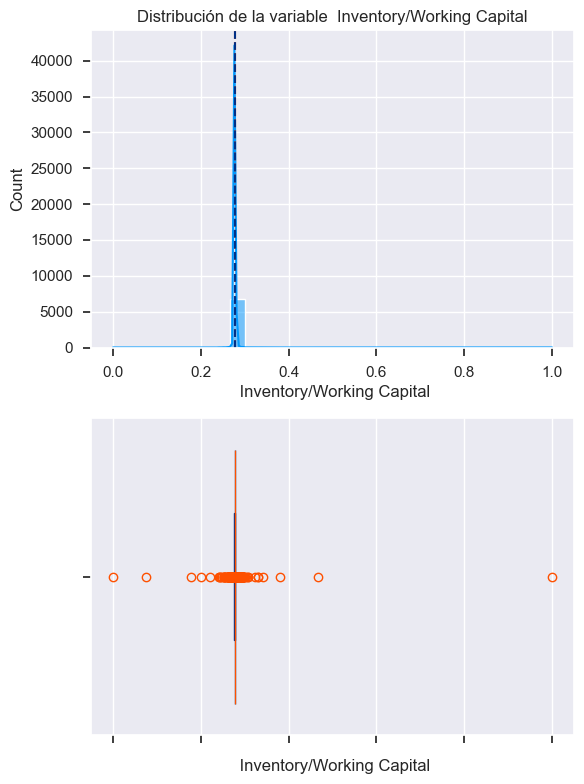

count    6819.000000
mean        0.277395
std         0.010469
min         0.000000
25%         0.277034
50%         0.277178
75%         0.277429
max         1.000000
Name:  Inventory/Working Capital, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Inventory/Current Liability


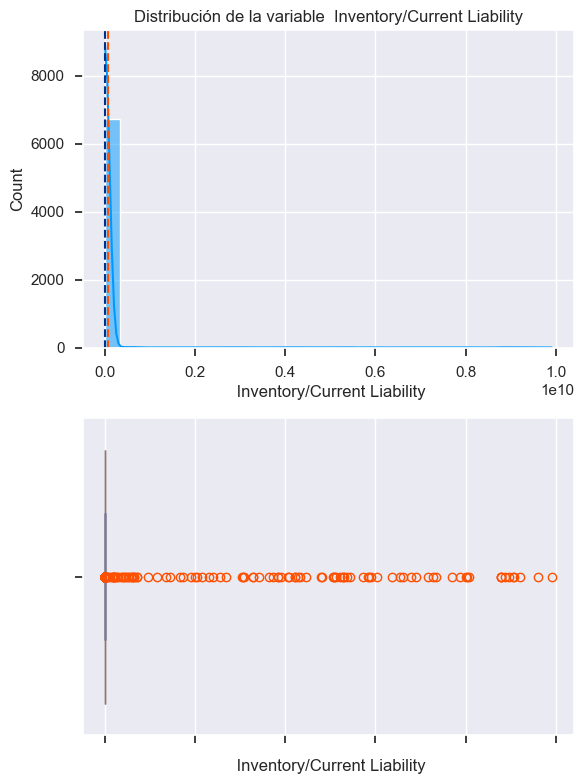

count    6.819000e+03
mean     5.580680e+07
std      5.820516e+08
min      0.000000e+00
25%      3.163148e-03
50%      6.497335e-03
75%      1.114677e-02
max      9.910000e+09
Name:  Inventory/Current Liability, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Current Liabilities/Liability


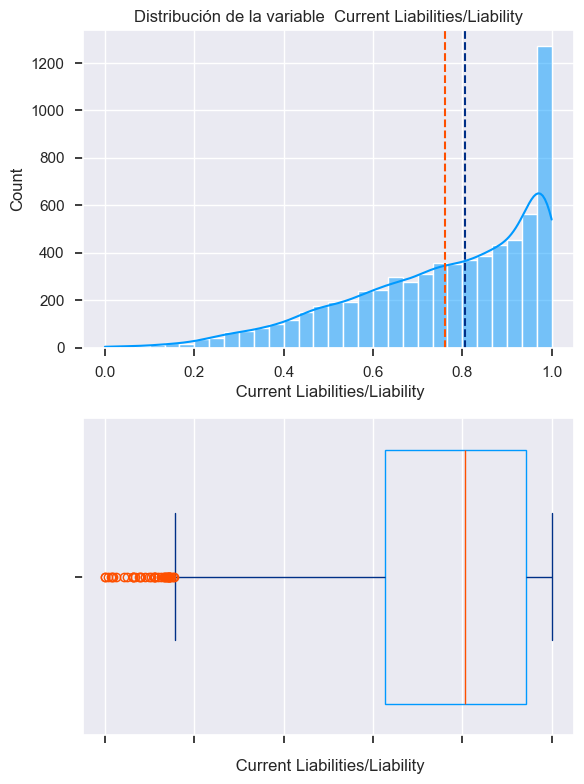

count    6819.000000
mean        0.761599
std         0.206677
min         0.000000
25%         0.626981
50%         0.806881
75%         0.942027
max         1.000000
Name:  Current Liabilities/Liability, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Working Capital/Equity


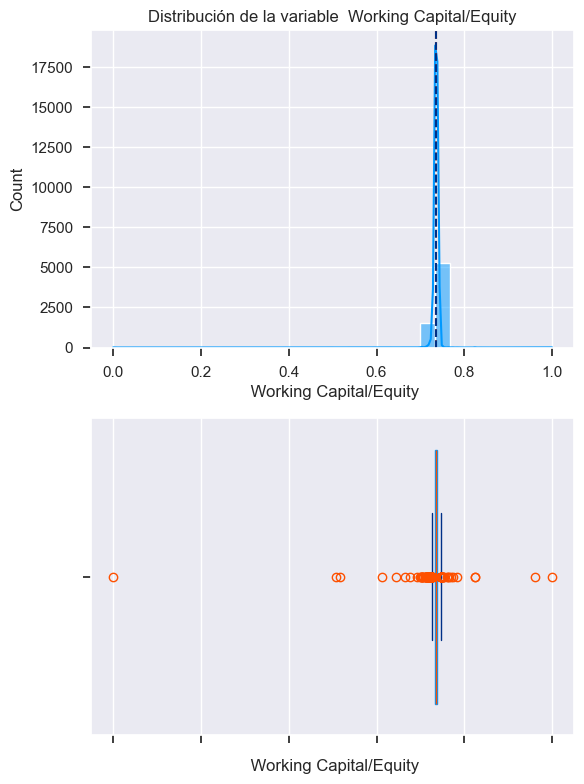

count    6819.000000
mean        0.735817
std         0.011678
min         0.000000
25%         0.733612
50%         0.736013
75%         0.738560
max         1.000000
Name:  Working Capital/Equity, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Current Liabilities/Equity


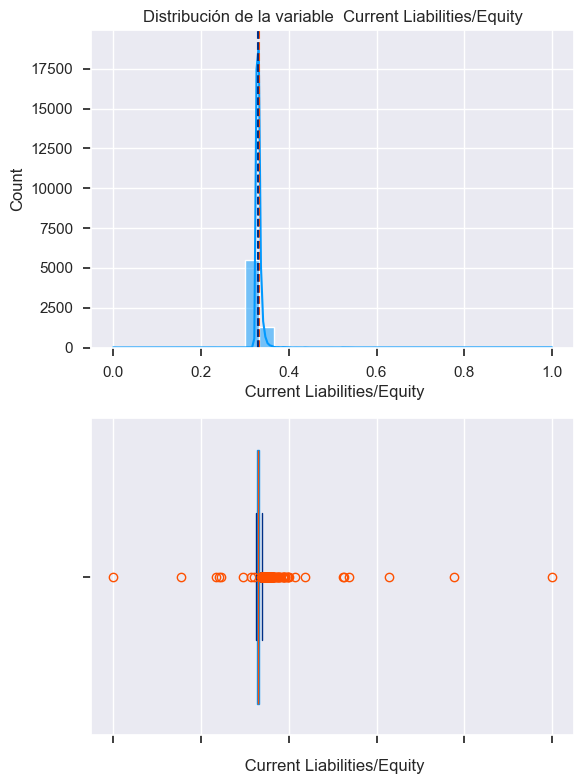

count    6819.000000
mean        0.331410
std         0.013488
min         0.000000
25%         0.328096
50%         0.329685
75%         0.332322
max         1.000000
Name:  Current Liabilities/Equity, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Long-term Liability to Current Assets


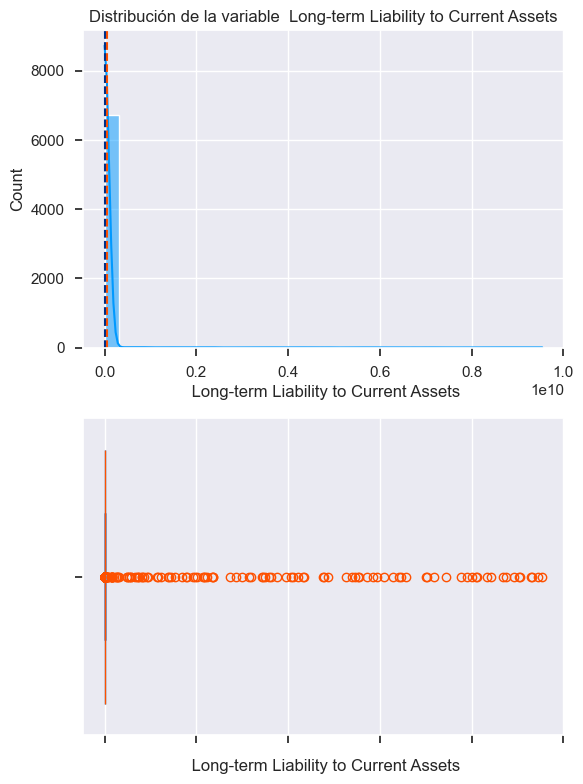

count    6.819000e+03
mean     5.416004e+07
std      5.702706e+08
min      0.000000e+00
25%      0.000000e+00
50%      1.974619e-03
75%      9.005946e-03
max      9.540000e+09
Name:  Long-term Liability to Current Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Retained Earnings to Total Assets


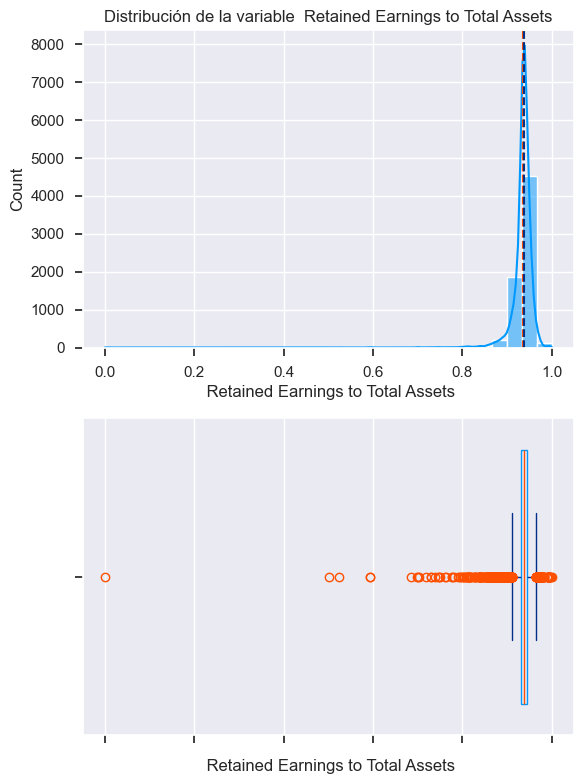

count    6819.000000
mean        0.934733
std         0.025564
min         0.000000
25%         0.931097
50%         0.937672
75%         0.944811
max         1.000000
Name:  Retained Earnings to Total Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Total income/Total expense


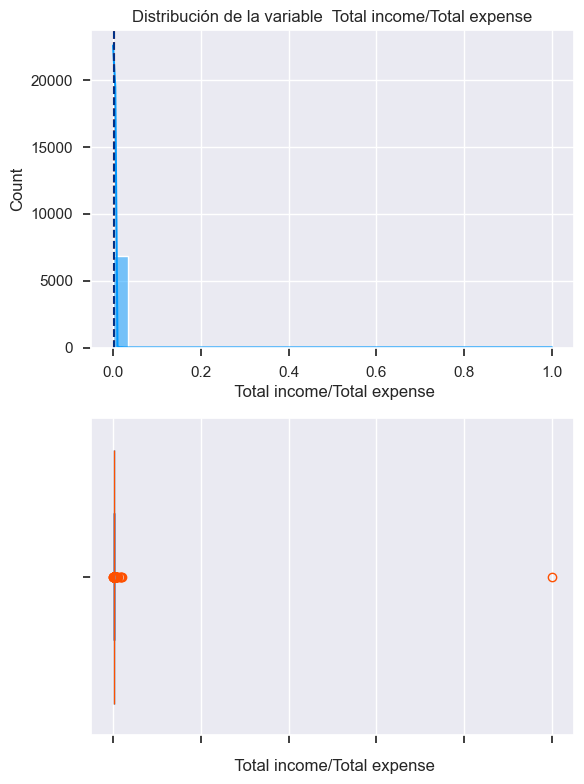

count    6819.000000
mean        0.002549
std         0.012093
min         0.000000
25%         0.002236
50%         0.002336
75%         0.002492
max         1.000000
Name:  Total income/Total expense, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Total expense/Assets


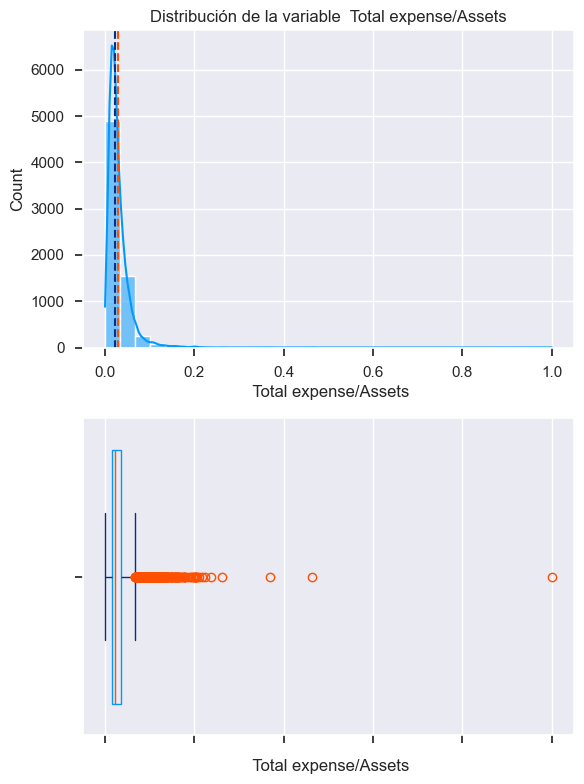

count    6819.000000
mean        0.029184
std         0.027149
min         0.000000
25%         0.014567
50%         0.022674
75%         0.035930
max         1.000000
Name:  Total expense/Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Current Asset Turnover Rate


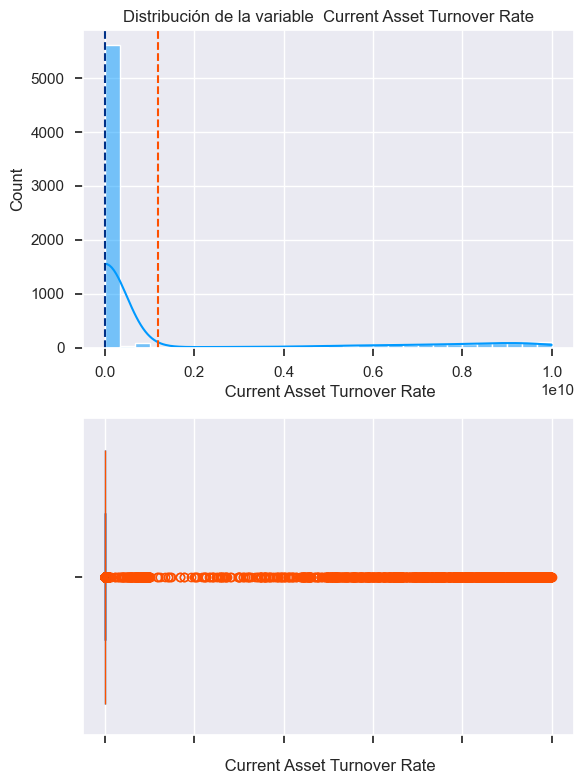

count    6.819000e+03
mean     1.195856e+09
std      2.821161e+09
min      0.000000e+00
25%      1.456236e-04
50%      1.987816e-04
75%      4.525945e-04
max      1.000000e+10
Name:  Current Asset Turnover Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Quick Asset Turnover Rate


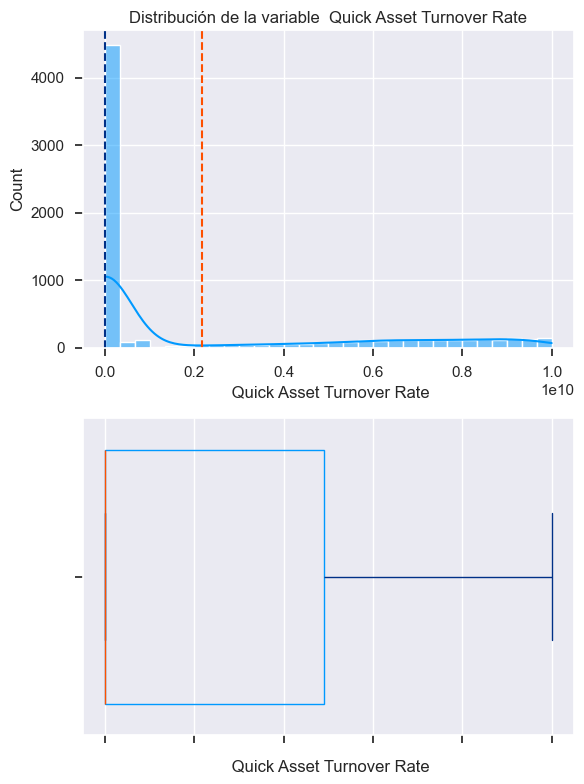

count    6.819000e+03
mean     2.163735e+09
std      3.374944e+09
min      0.000000e+00
25%      1.417149e-04
50%      2.247728e-04
75%      4.900000e+09
max      1.000000e+10
Name:  Quick Asset Turnover Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Working capitcal Turnover Rate


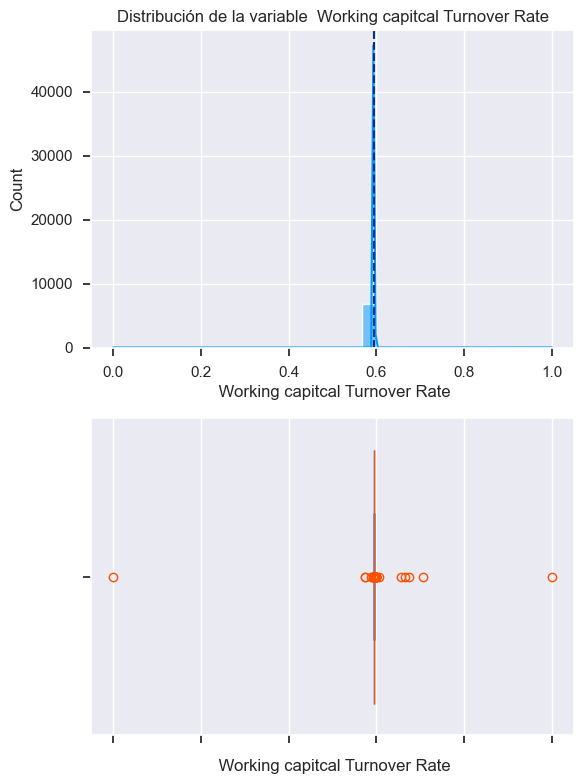

count    6819.000000
mean        0.594006
std         0.008959
min         0.000000
25%         0.593934
50%         0.593963
75%         0.594002
max         1.000000
Name:  Working capitcal Turnover Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Cash Turnover Rate


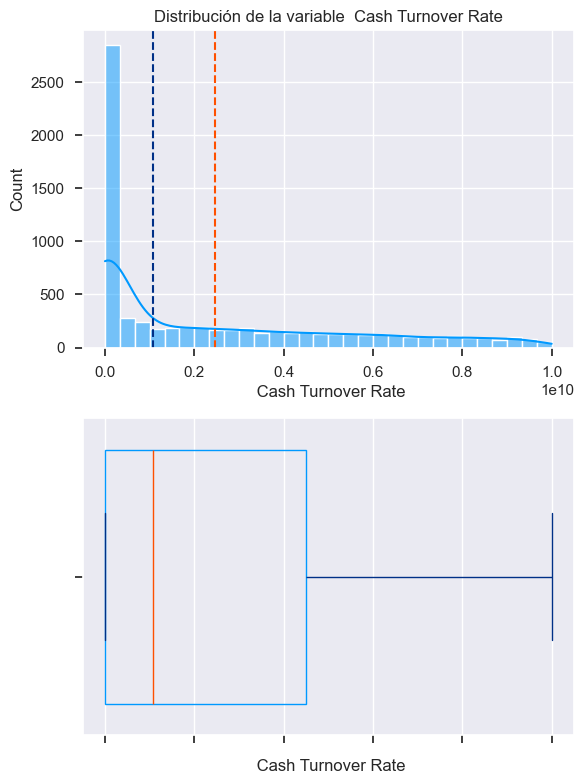

count    6.819000e+03
mean     2.471977e+09
std      2.938623e+09
min      0.000000e+00
25%      2.735337e-04
50%      1.080000e+09
75%      4.510000e+09
max      1.000000e+10
Name:  Cash Turnover Rate, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Cash Flow to Sales


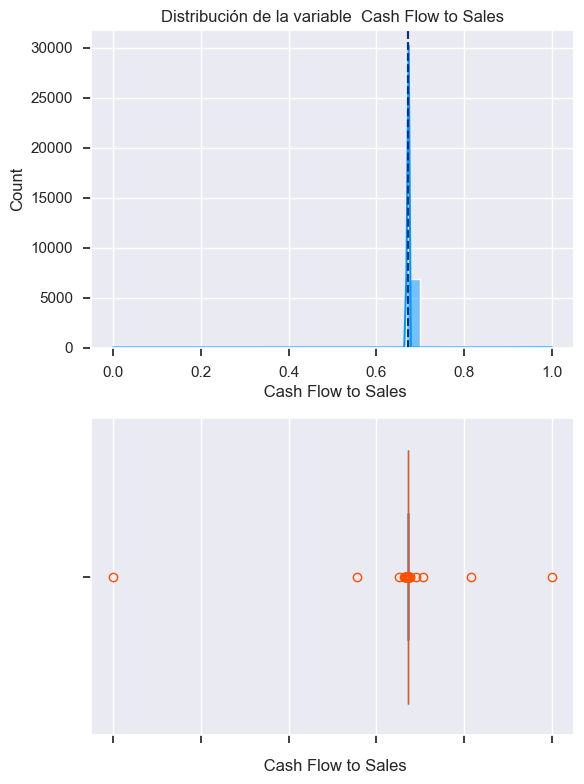

count    6819.000000
mean        0.671531
std         0.009341
min         0.000000
25%         0.671565
50%         0.671574
75%         0.671587
max         1.000000
Name:  Cash Flow to Sales, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Fixed Assets to Assets


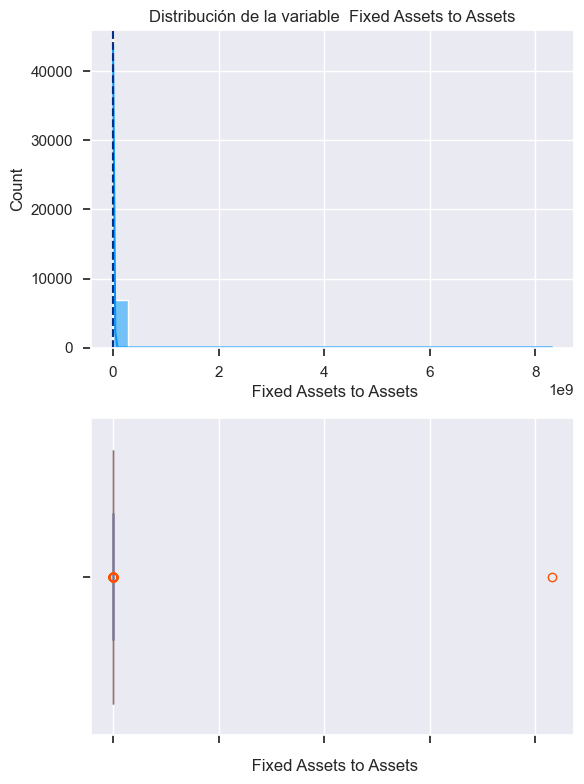

count    6.819000e+03
mean     1.220121e+06
std      1.007542e+08
min      0.000000e+00
25%      8.536037e-02
50%      1.968810e-01
75%      3.722000e-01
max      8.320000e+09
Name:  Fixed Assets to Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Current Liability to Liability


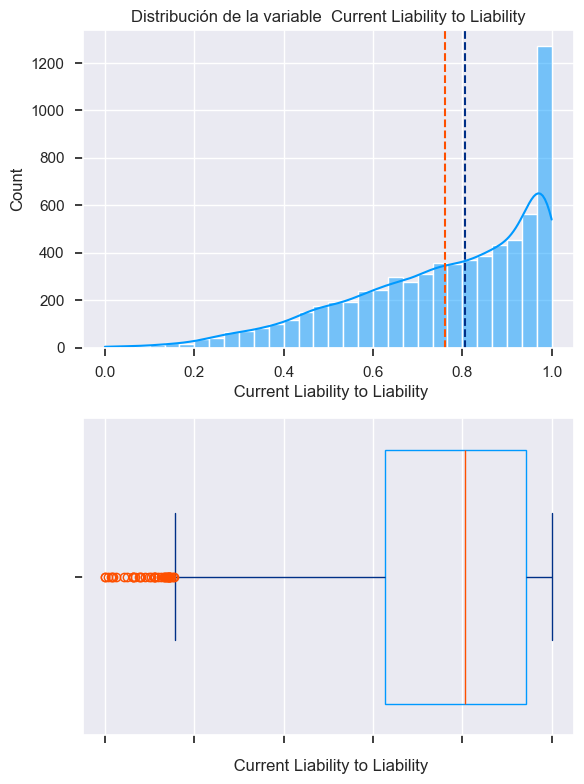

count    6819.000000
mean        0.761599
std         0.206677
min         0.000000
25%         0.626981
50%         0.806881
75%         0.942027
max         1.000000
Name:  Current Liability to Liability, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Current Liability to Equity


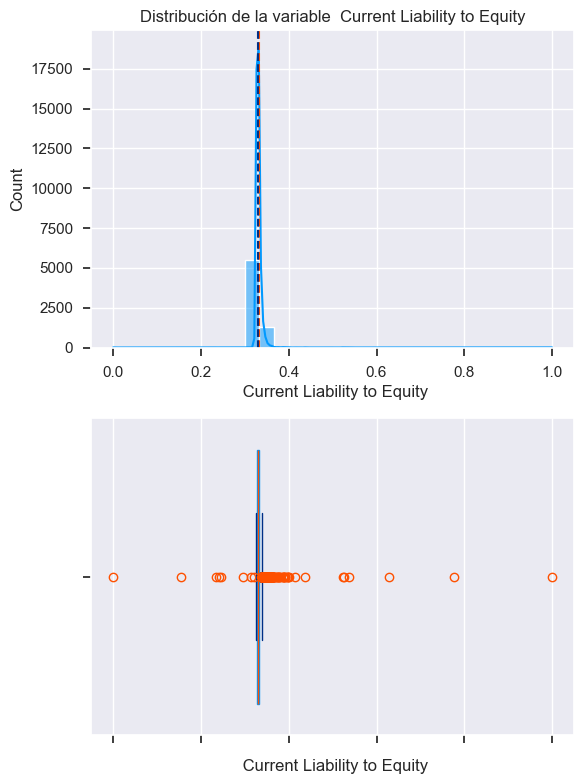

count    6819.000000
mean        0.331410
std         0.013488
min         0.000000
25%         0.328096
50%         0.329685
75%         0.332322
max         1.000000
Name:  Current Liability to Equity, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Equity to Long-term Liability


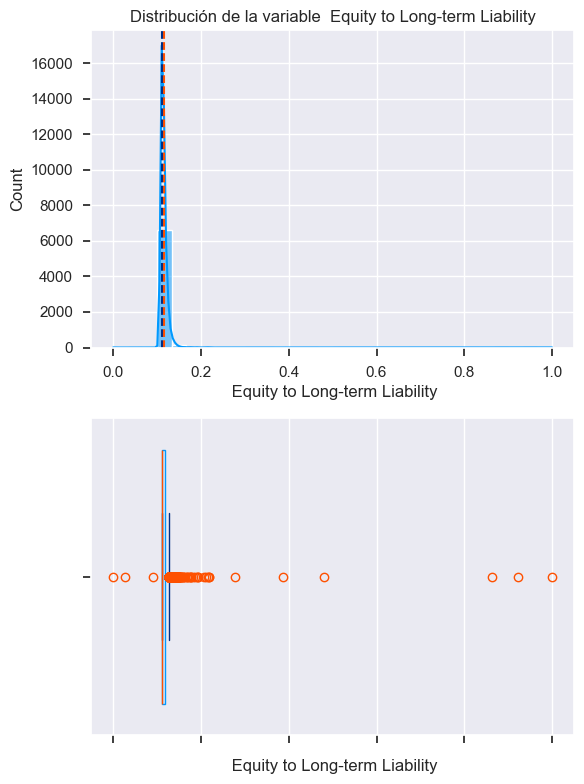

count    6819.000000
mean        0.115645
std         0.019529
min         0.000000
25%         0.110933
50%         0.112340
75%         0.117106
max         1.000000
Name:  Equity to Long-term Liability, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Cash Flow to Total Assets


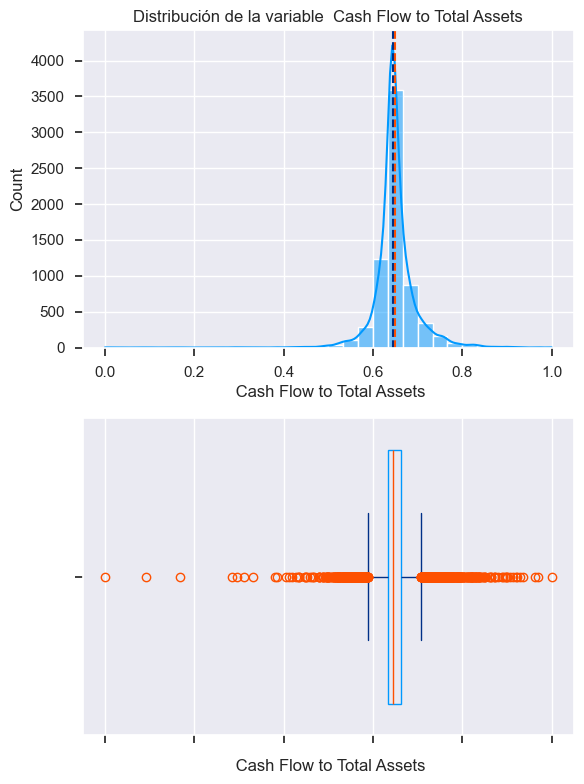

count    6819.000000
mean        0.649731
std         0.047372
min         0.000000
25%         0.633265
50%         0.645366
75%         0.663062
max         1.000000
Name:  Cash Flow to Total Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Cash Flow to Liability


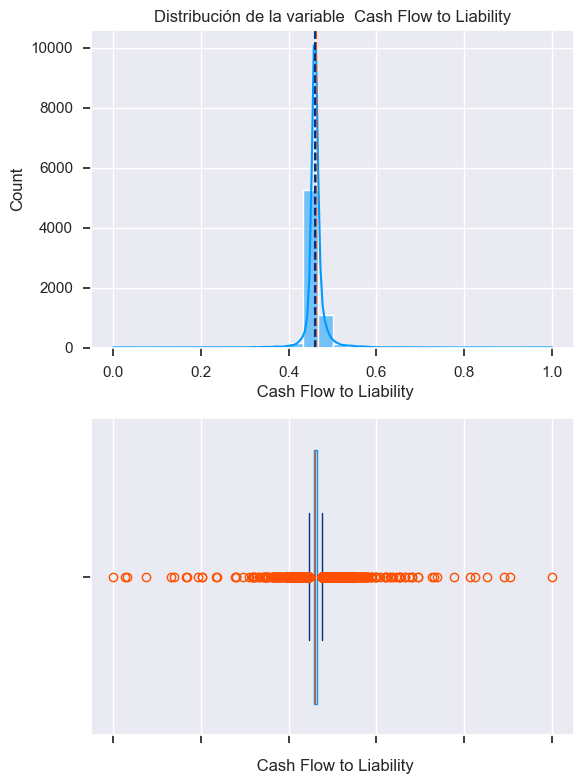

count    6819.000000
mean        0.461849
std         0.029943
min         0.000000
25%         0.457116
50%         0.459750
75%         0.464236
max         1.000000
Name:  Cash Flow to Liability, dtype: float64
------------------------------------------------------------



 Distribución Variable:  CFO to Assets


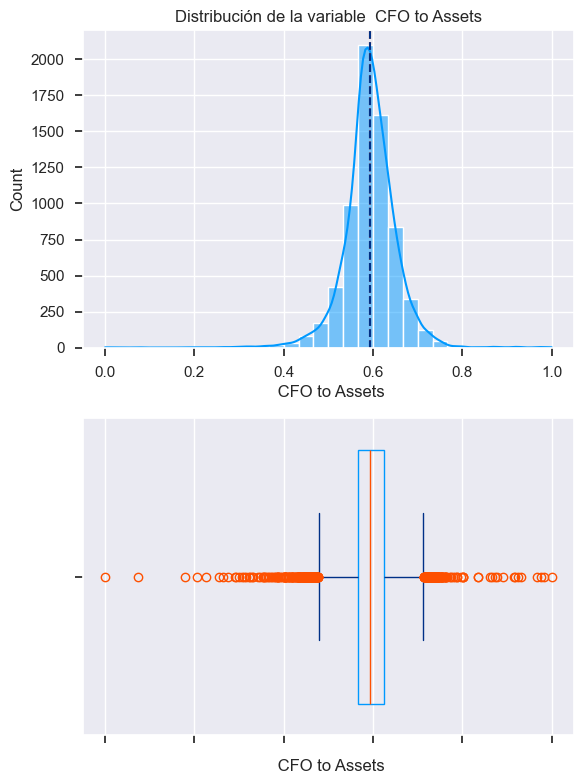

count    6819.000000
mean        0.593415
std         0.058561
min         0.000000
25%         0.565987
50%         0.593266
75%         0.624769
max         1.000000
Name:  CFO to Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Cash Flow to Equity


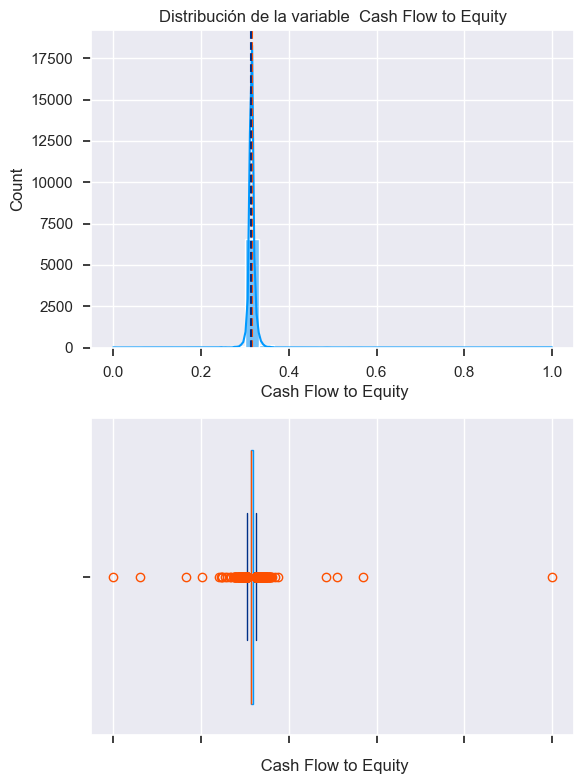

count    6819.000000
mean        0.315582
std         0.012961
min         0.000000
25%         0.312995
50%         0.314953
75%         0.317707
max         1.000000
Name:  Cash Flow to Equity, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Current Liability to Current Assets


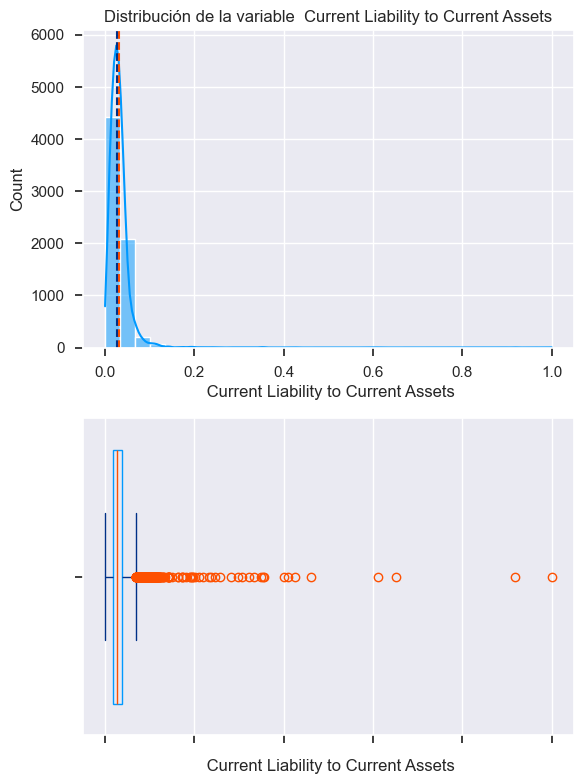

count    6819.000000
mean        0.031506
std         0.030845
min         0.000000
25%         0.018034
50%         0.027597
75%         0.038375
max         1.000000
Name:  Current Liability to Current Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Liability-Assets Flag


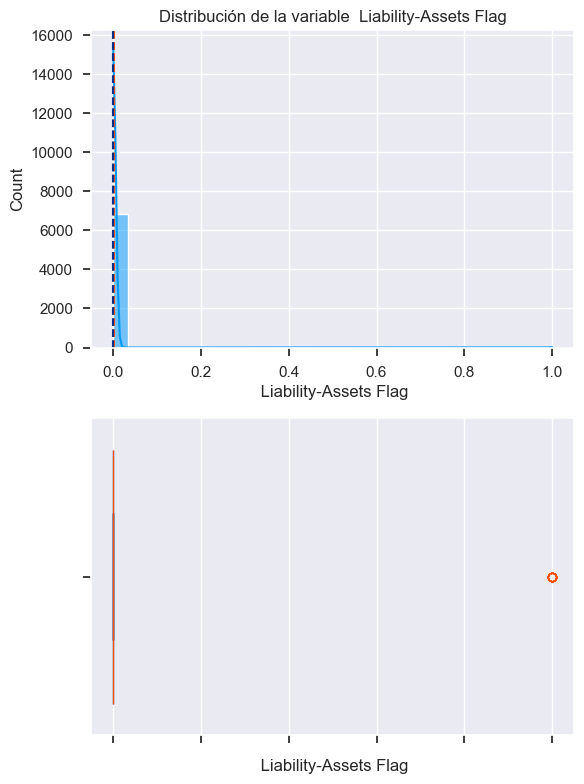

count    6819.000000
mean        0.001173
std         0.034234
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name:  Liability-Assets Flag, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Net Income to Total Assets


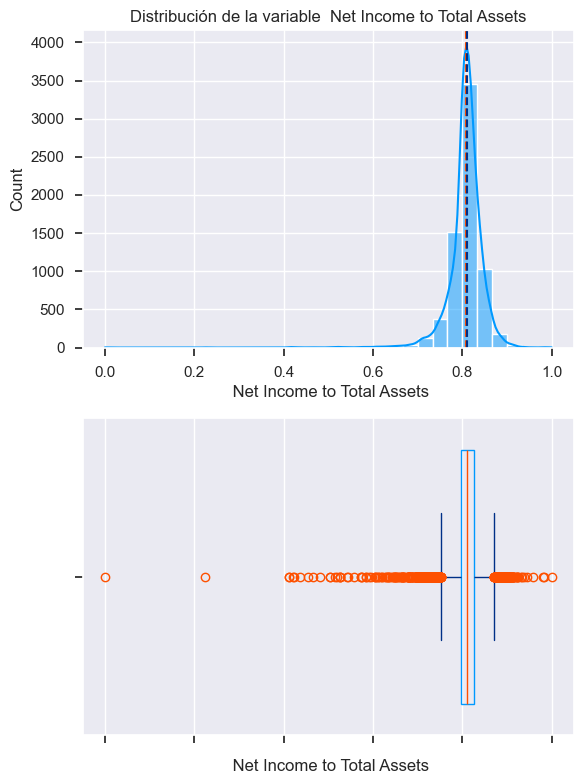

count    6819.000000
mean        0.807760
std         0.040332
min         0.000000
25%         0.796750
50%         0.810619
75%         0.826455
max         1.000000
Name:  Net Income to Total Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Total assets to GNP price


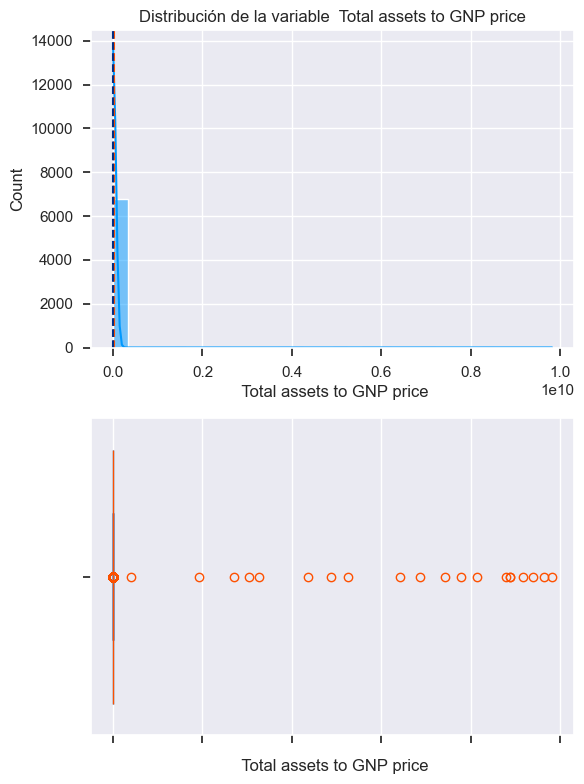

count    6.819000e+03
mean     1.862942e+07
std      3.764501e+08
min      0.000000e+00
25%      9.036205e-04
50%      2.085213e-03
75%      5.269777e-03
max      9.820000e+09
Name:  Total assets to GNP price, dtype: float64
------------------------------------------------------------



 Distribución Variable:  No-credit Interval


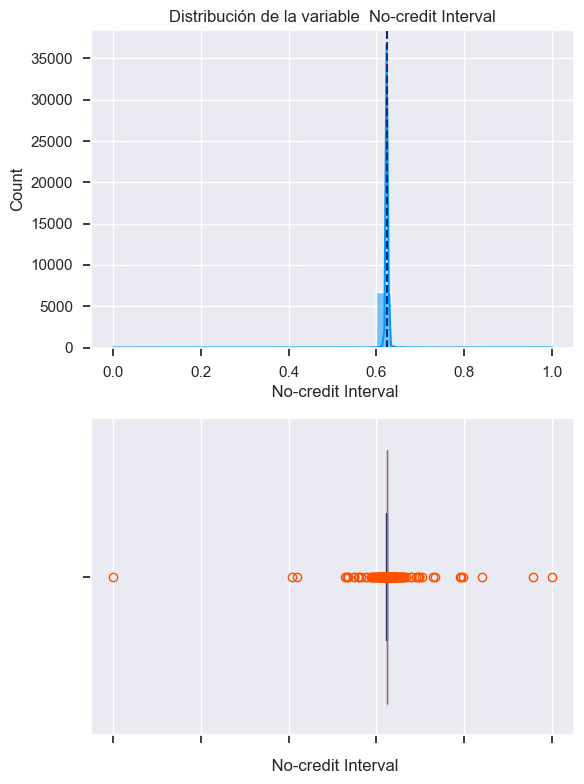

count    6819.000000
mean        0.623915
std         0.012290
min         0.000000
25%         0.623636
50%         0.623879
75%         0.624168
max         1.000000
Name:  No-credit Interval, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Gross Profit to Sales


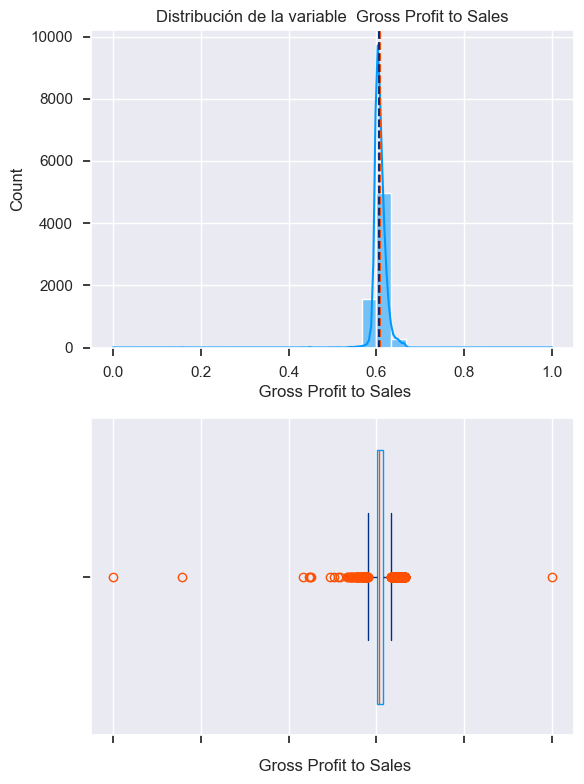

count    6819.000000
mean        0.607946
std         0.016934
min         0.000000
25%         0.600443
50%         0.605998
75%         0.613913
max         1.000000
Name:  Gross Profit to Sales, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Net Income to Stockholder's Equity


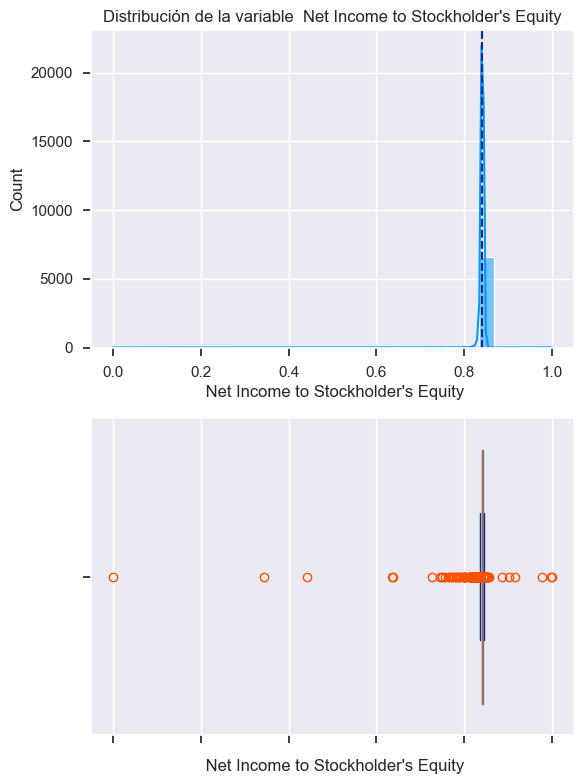

count    6819.000000
mean        0.840402
std         0.014523
min         0.000000
25%         0.840115
50%         0.841179
75%         0.842357
max         1.000000
Name:  Net Income to Stockholder's Equity, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Liability to Equity


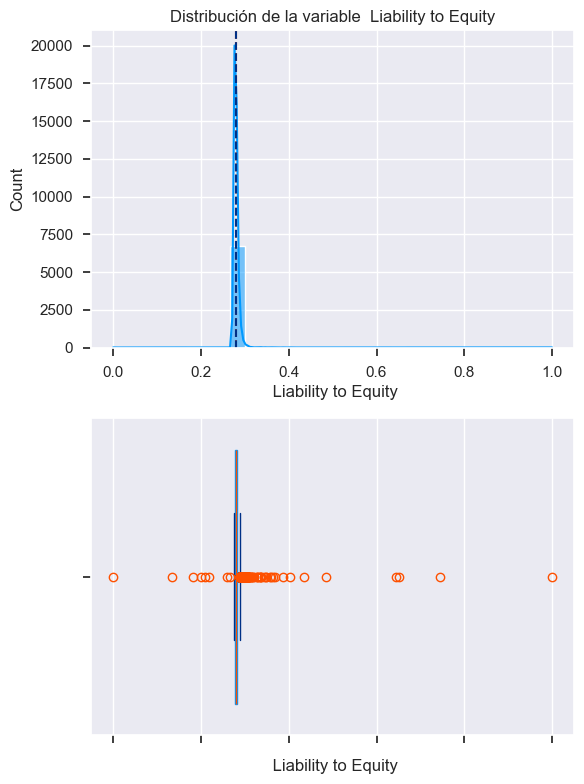

count    6819.000000
mean        0.280365
std         0.014463
min         0.000000
25%         0.276944
50%         0.278778
75%         0.281449
max         1.000000
Name:  Liability to Equity, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Degree of Financial Leverage (DFL)


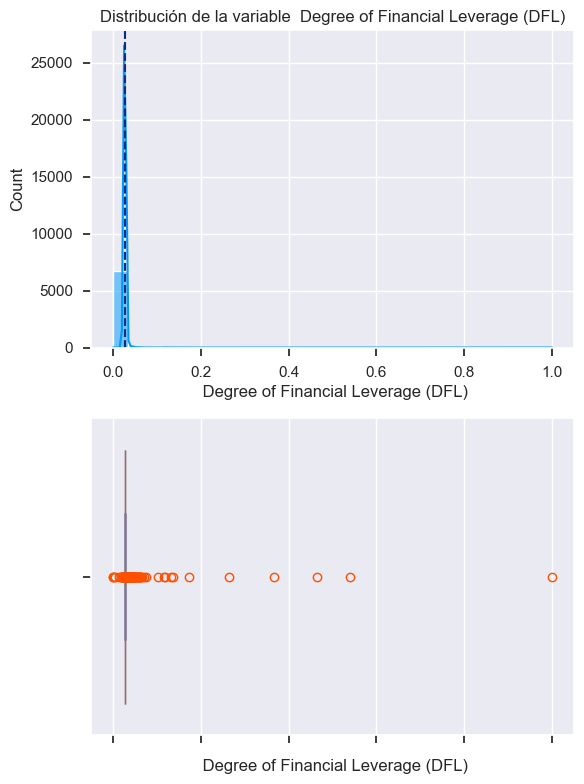

count    6819.000000
mean        0.027541
std         0.015668
min         0.000000
25%         0.026791
50%         0.026808
75%         0.026913
max         1.000000
Name:  Degree of Financial Leverage (DFL), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Interest Coverage Ratio (Interest expense to EBIT)


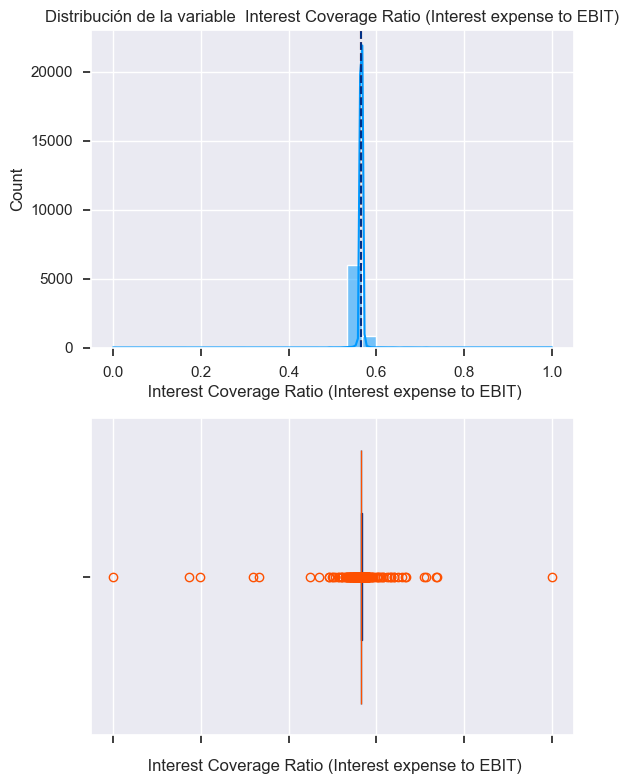

count    6819.000000
mean        0.565358
std         0.013214
min         0.000000
25%         0.565158
50%         0.565252
75%         0.565725
max         1.000000
Name:  Interest Coverage Ratio (Interest expense to EBIT), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Net Income Flag


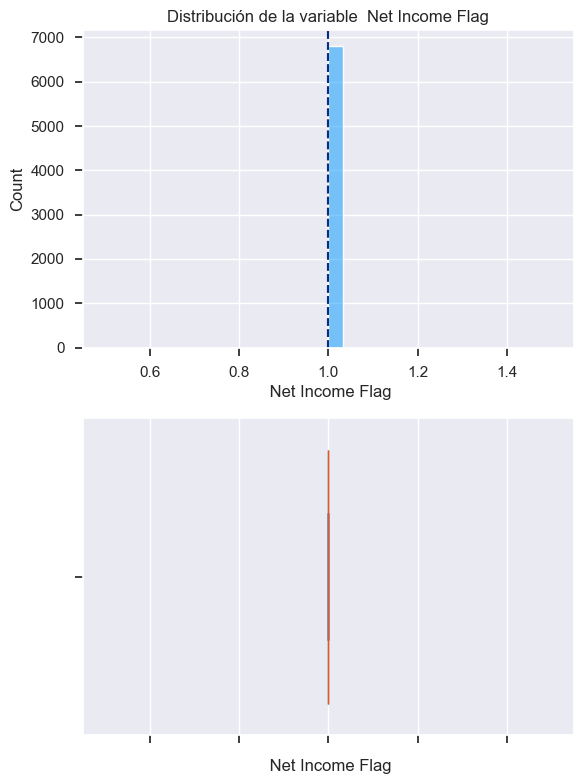

count    6819.0
mean        1.0
std         0.0
min         1.0
25%         1.0
50%         1.0
75%         1.0
max         1.0
Name:  Net Income Flag, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Equity to Liability


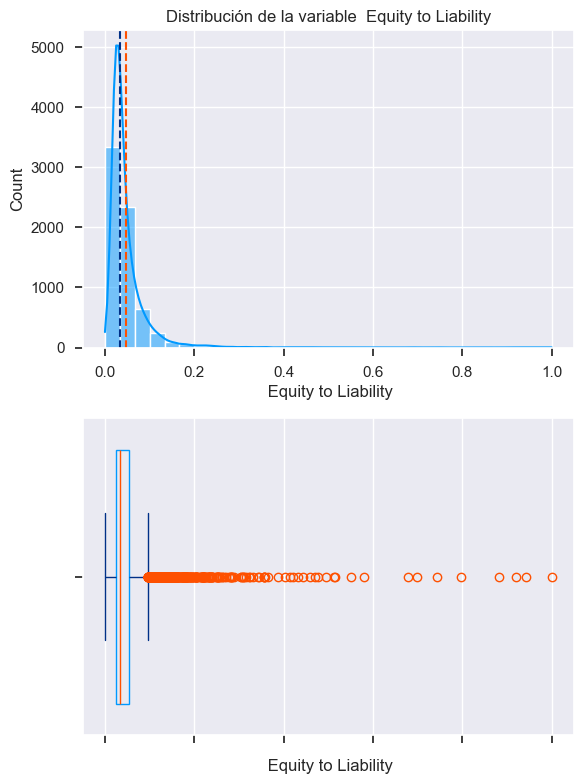

count    6819.000000
mean        0.047578
std         0.050014
min         0.000000
25%         0.024477
50%         0.033798
75%         0.052838
max         1.000000
Name:  Equity to Liability, dtype: float64
------------------------------------------------------------


Variables Categóticas

No se encontraron variables categóricas en el dataset.


In [9]:

categorical_columns = df.select_dtypes(include=["object", "category"]).columns
numeric_columns = df.select_dtypes(include=["float64", "int64"]).columns

print('Variables Numéricas')

for col in numeric_columns:
    print(f'\n Distribución Variable: {col}')
    fig, axes = plt.subplots(2, 1, figsize=(6, 8))
    #plt.figure(figsize=(6, 3))
    sns.histplot(df[col], bins=30, kde=True, color="#0099FF", alpha=0.5, edgecolor = 'white', ax=axes[0])
    axes[0].axvline(df[col].mean(), color='#FE5000', linestyle='--', label='Media')
    axes[0].axvline(df[col].median(), color='#003087', linestyle='--', label='Mediana')
    axes[0].set_title(f"Distribución de la variable {col}")
    

    #plt.figure(figsize=(6, 3))
    sns.boxplot(x=df[col], ax = axes[1], boxprops = {'edgecolor' : '#0099FF' , 'facecolor' : 'none'} ,whiskerprops = {'color' : '#003087'} ,capprops= {'color' : '#003087'}, medianprops = {'color' : '#FE5000'},flierprops = {'markeredgecolor' : '#FE5000'})
    axes[1].set_xticklabels([])
    axes[1].set_yticklabels([])
    plt.tight_layout()
    plt.show()
    print(df[col].describe())
    print('-'*60)
    print('\n')


print('Variables Categóticas')


if len(categorical_columns) > 0:
    for col in categorical_columns:
        plt.figure(figsize=(3, 3))
        sns.countplot(x=col, data=df, palette="coolwarm")
        plt.title(f"Distribución de la variable categórica {col}")
        plt.ylabel("Frecuencia")
        plt.show()
else:
    print("\nNo se encontraron variables categóricas en el dataset.")


Análisis Bivariante Variable Objetivo vs Variables numéricas.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


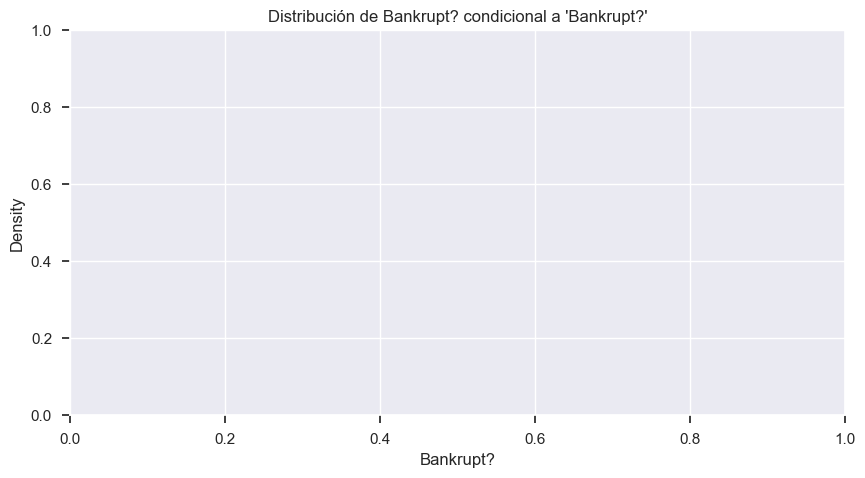

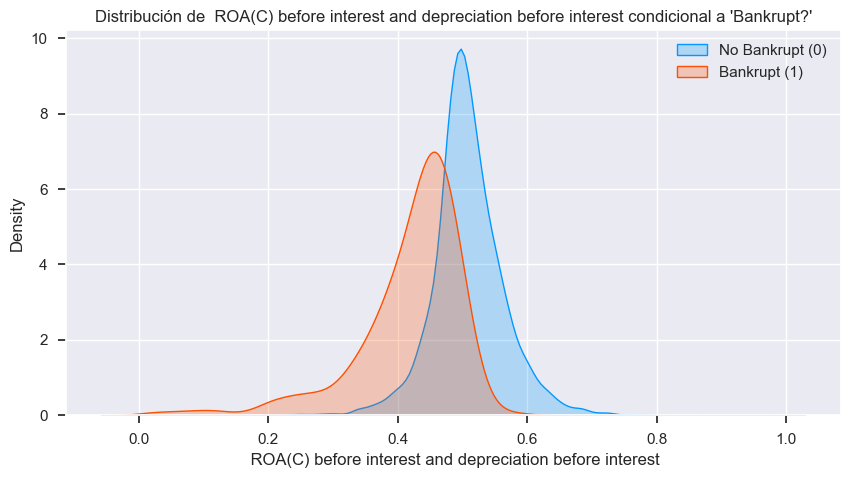

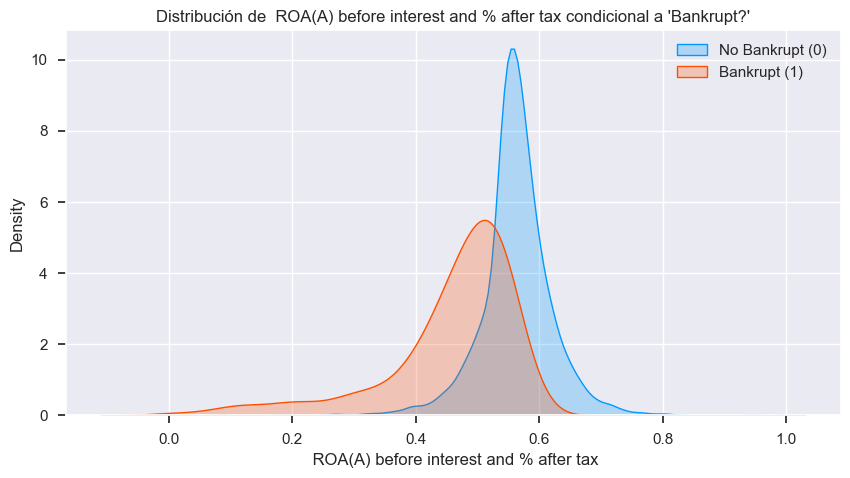

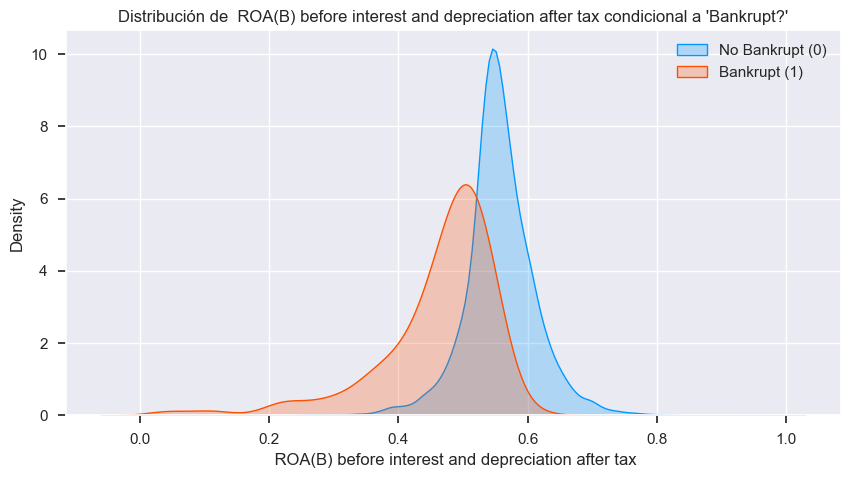

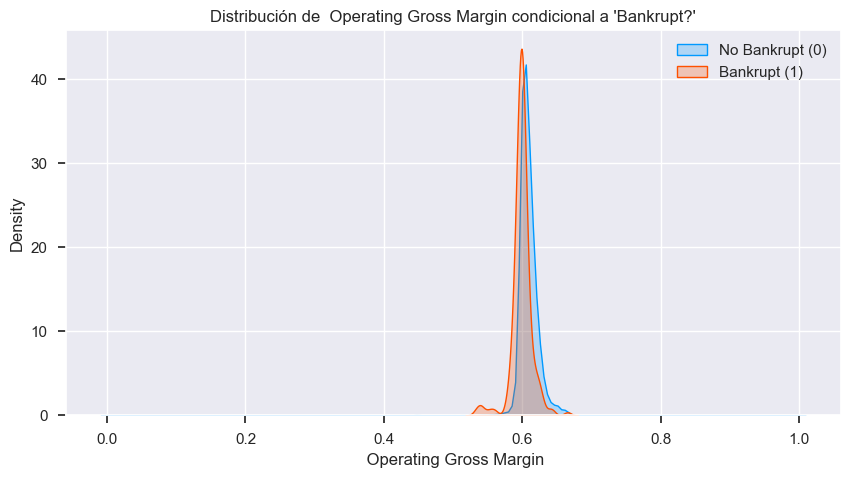

...

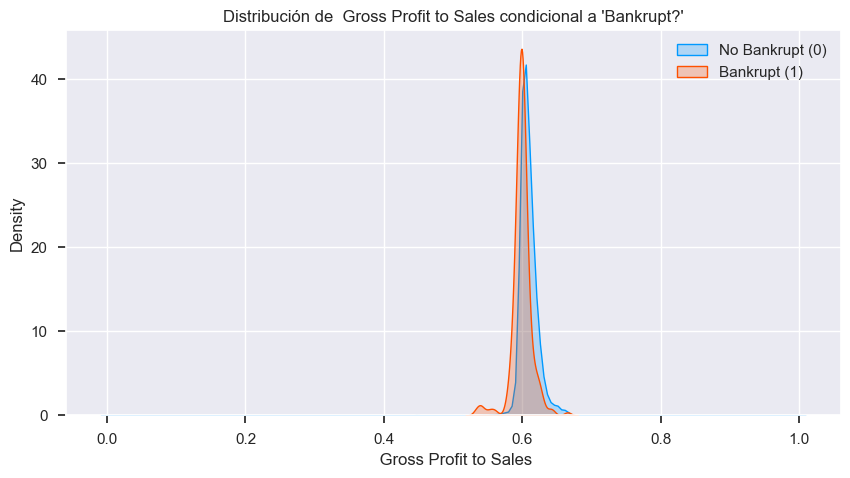

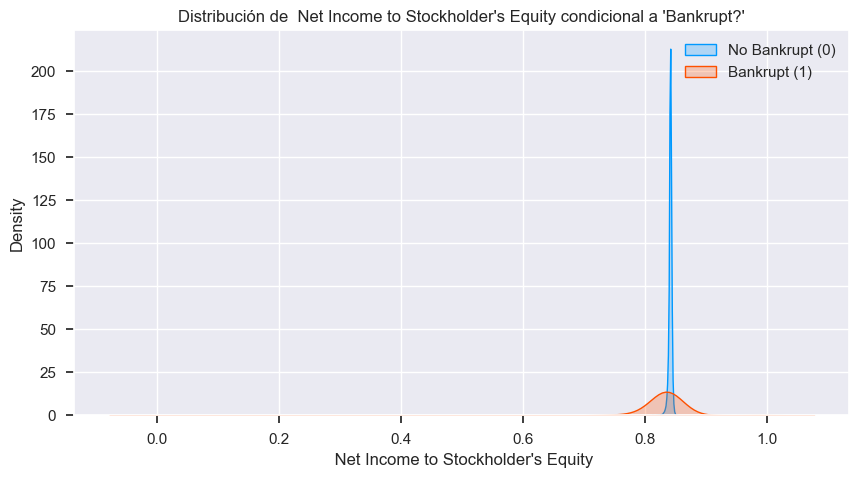

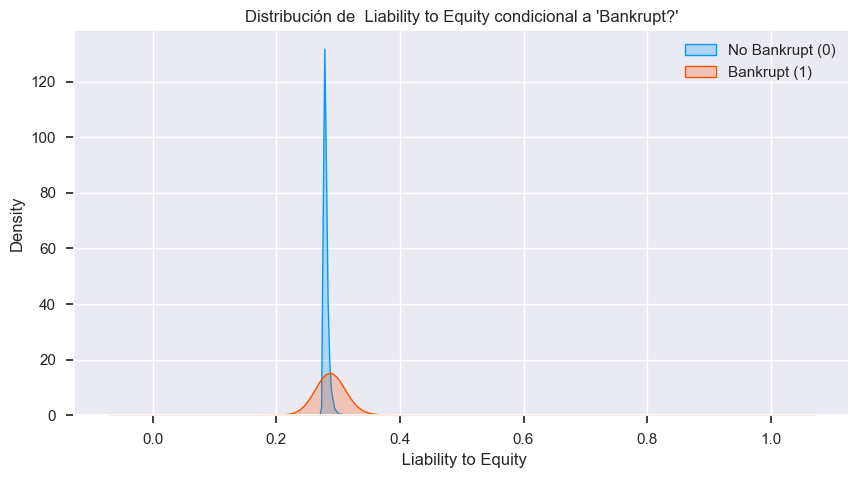

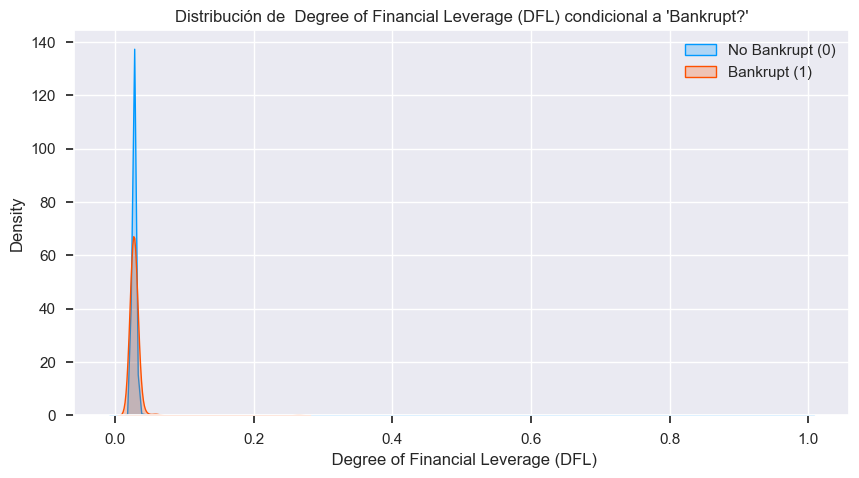

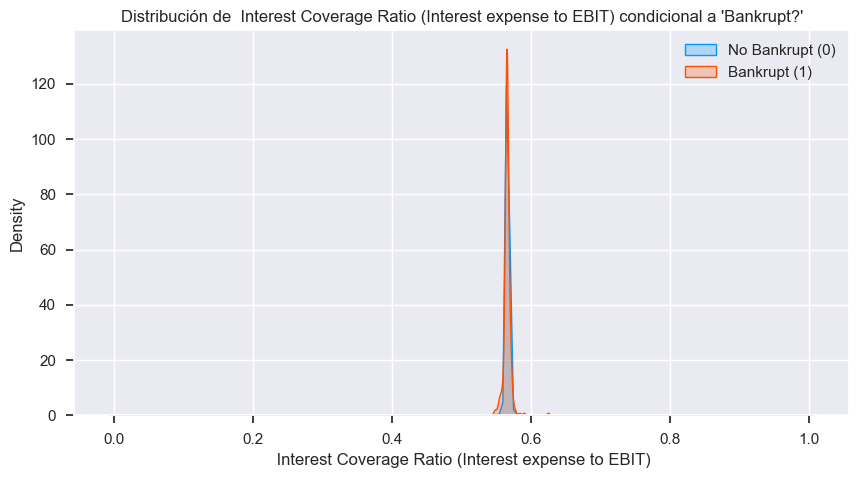

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


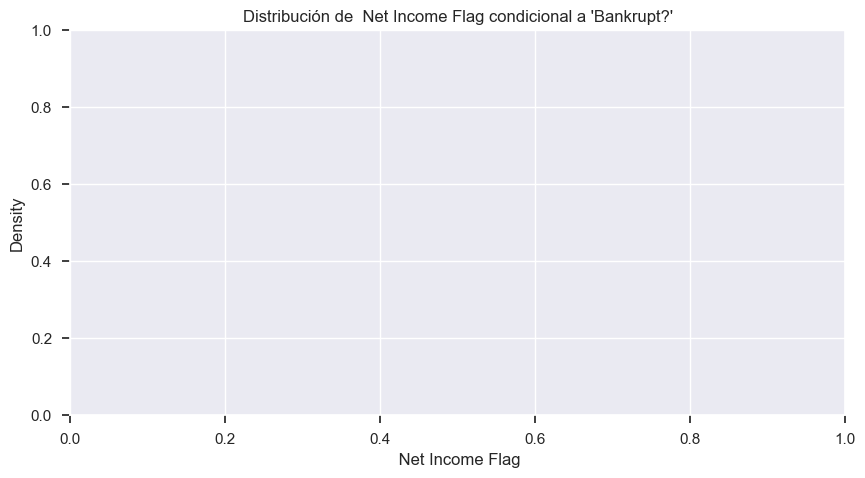

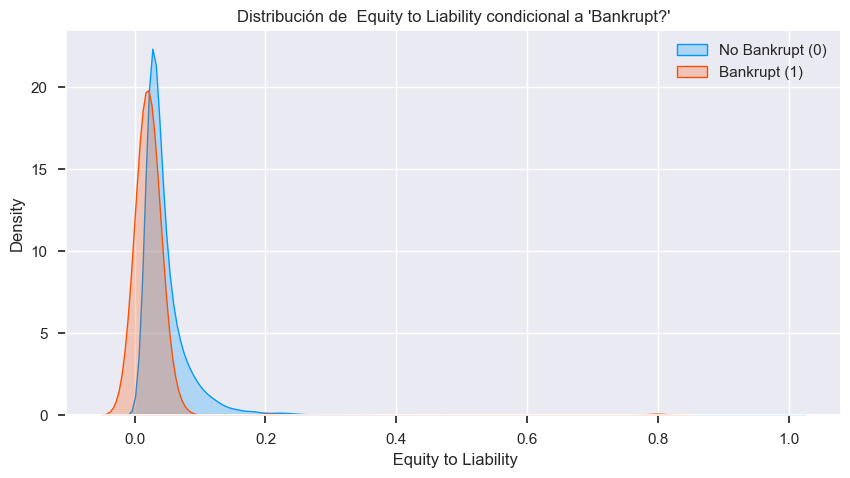

In [10]:
for col in numeric_columns:
    plt.figure(figsize=(10, 5))
    sns.kdeplot(df[col][df['Bankrupt?'] == 0], label='No Bankrupt (0)', color='#0099FF', shade=True)
    sns.kdeplot(df[col][df['Bankrupt?'] == 1], label='Bankrupt (1)', color='#FE5000', shade=True)
    plt.title(f"Distribución de {col} condicional a 'Bankrupt?'")
    plt.xlabel(col)
    plt.legend()
    plt.show()


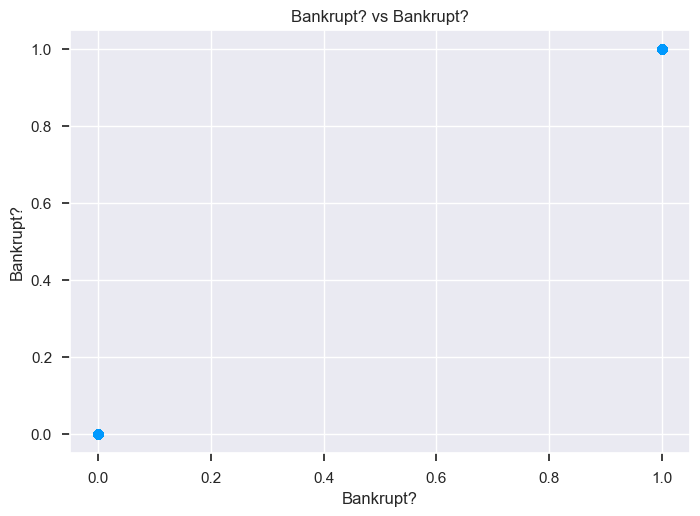

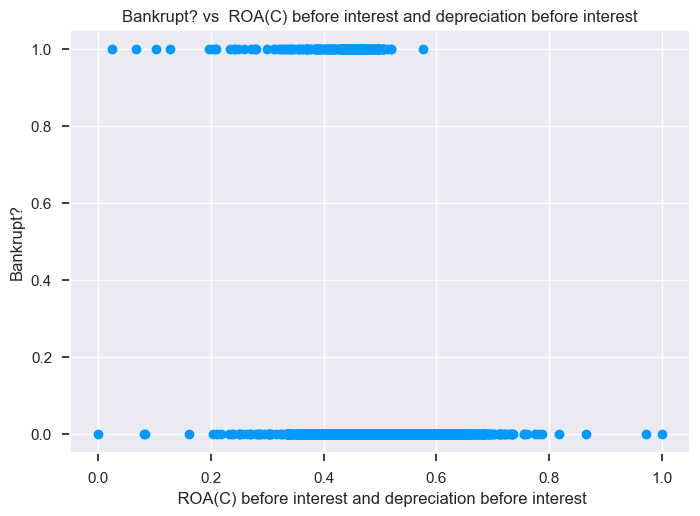

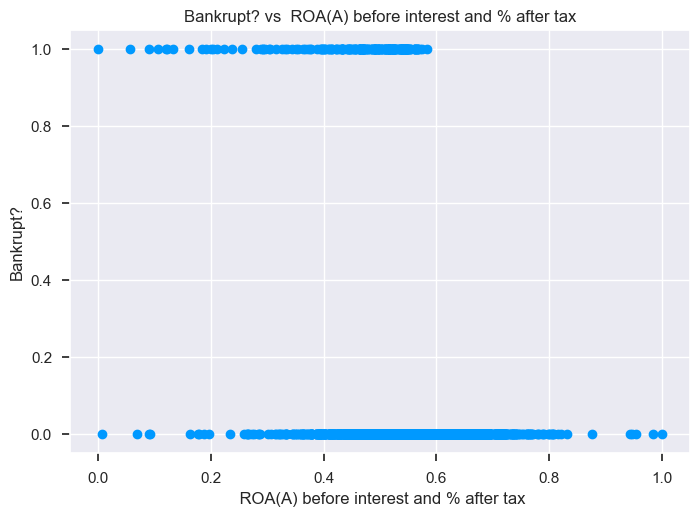

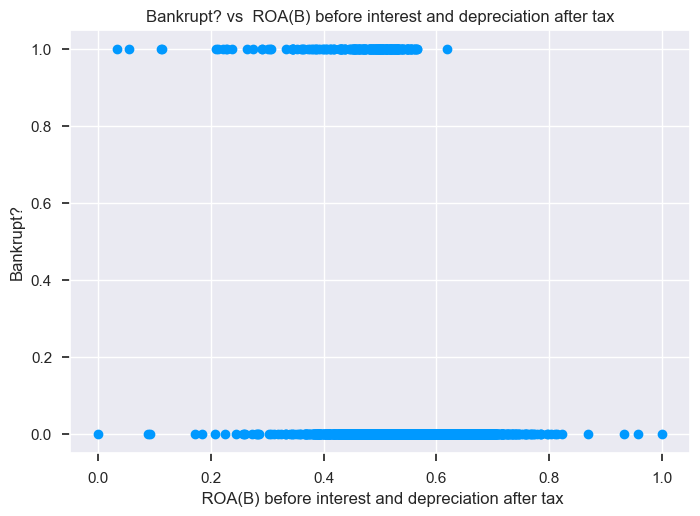

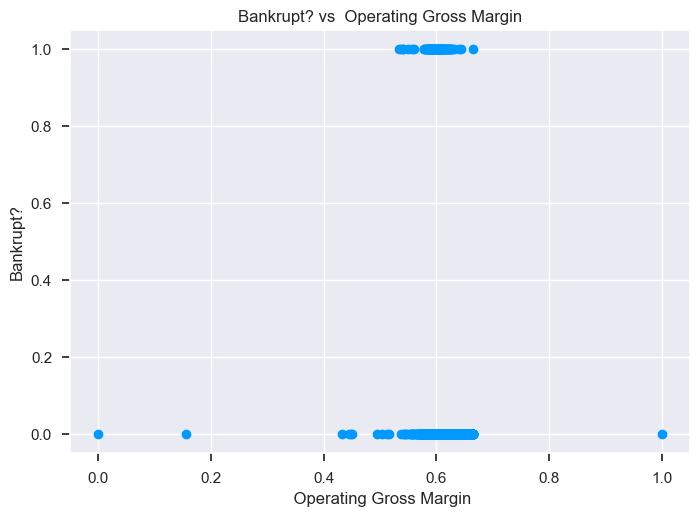

...

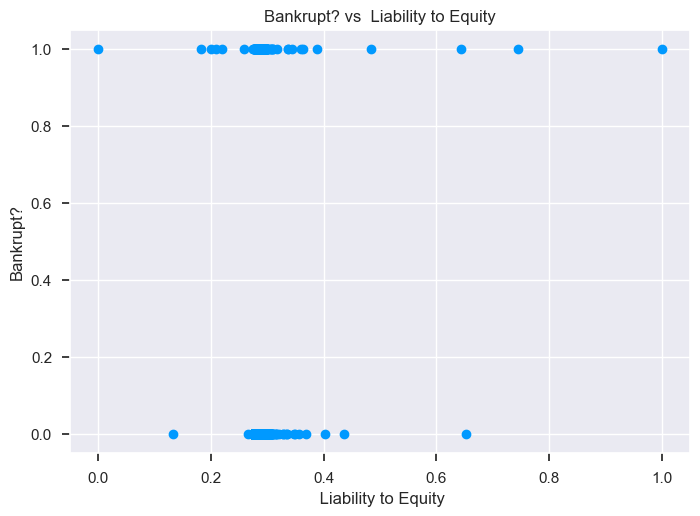

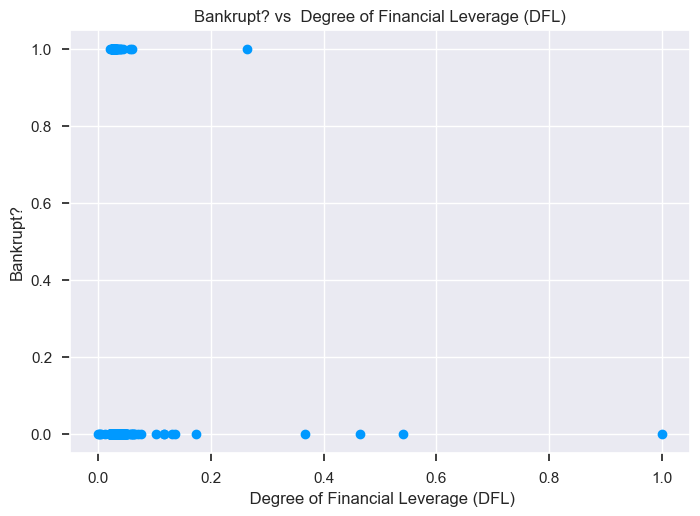

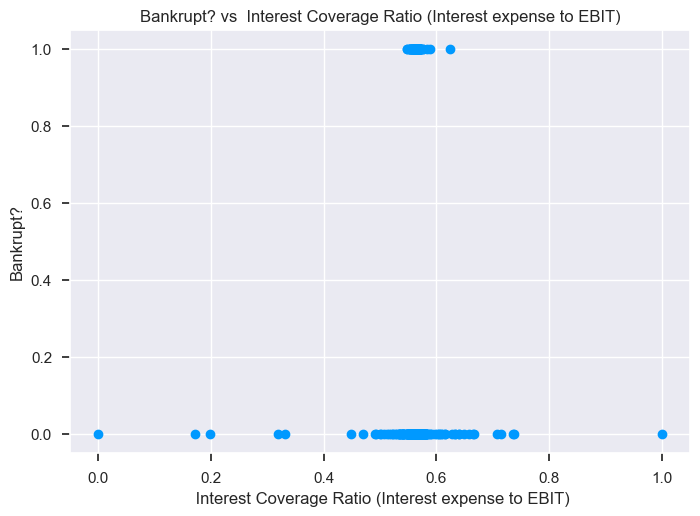

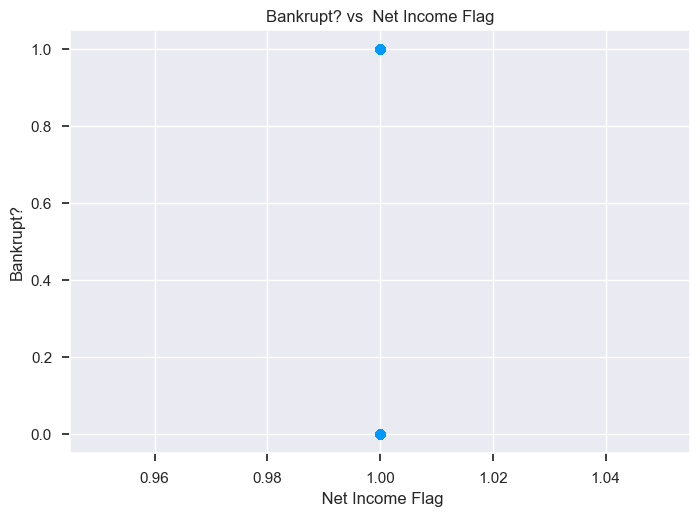

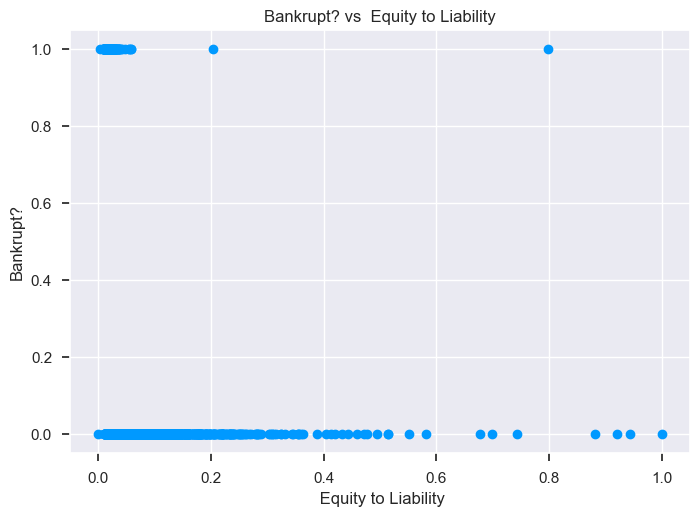

In [11]:
for i, var in enumerate(numeric_columns):
    plt.figure()
    plt.scatter(x = df[var] , y = df['Bankrupt?'], color = '#0099FF')
    plt.xlabel(var)
    plt.ylabel('Bankrupt?')
    plt.title((f'Bankrupt? vs {var}'))
    plt.show

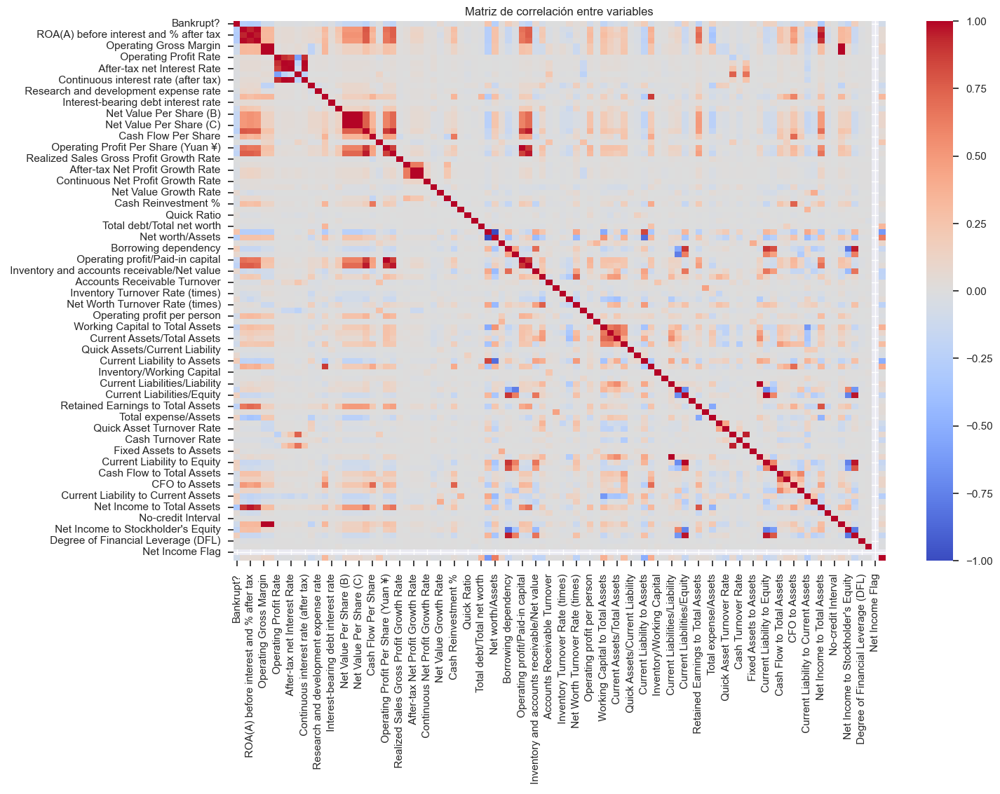


Correlación con la variable objetivo ('Bankrupt?'):
Bankrupt?                                                   1.000000
 Debt ratio %                                               0.250161
 Current Liability to Assets                                0.194494
 Borrowing dependency                                       0.176543
 Current Liability to Current Assets                        0.171306
                                                              ...   
 ROA(C) before interest and depreciation before interest   -0.260807
 ROA(B) before interest and depreciation after tax         -0.273051
 ROA(A) before interest and % after tax                    -0.282941
 Net Income to Total Assets                                -0.315457
 Net Income Flag                                                 NaN
Name: Bankrupt?, Length: 96, dtype: float64

Variables más correlacionadas con 'Bankrupt?': [' Debt ratio %', ' Current Liability to Assets', ' Borrowing dependency', ' Current Liability t

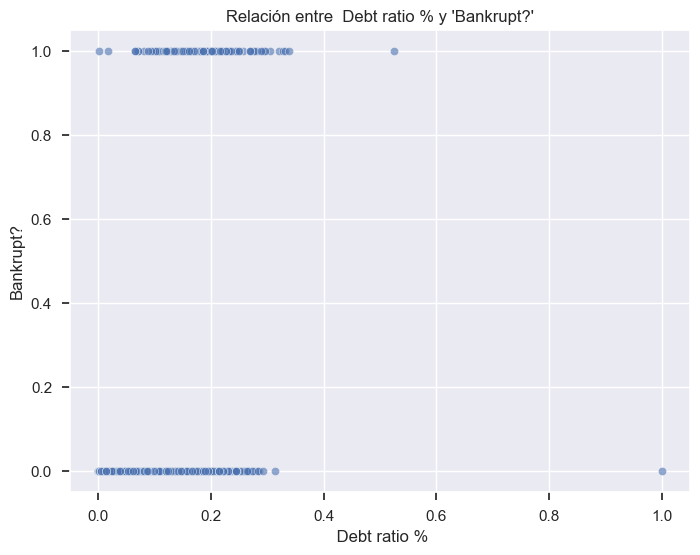

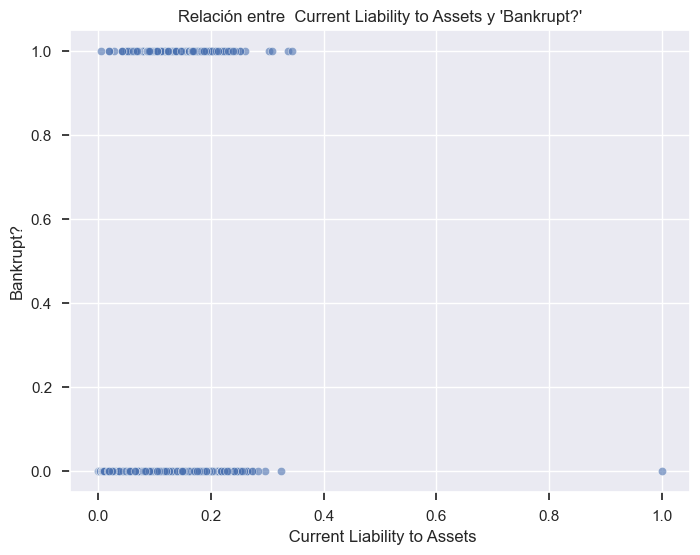

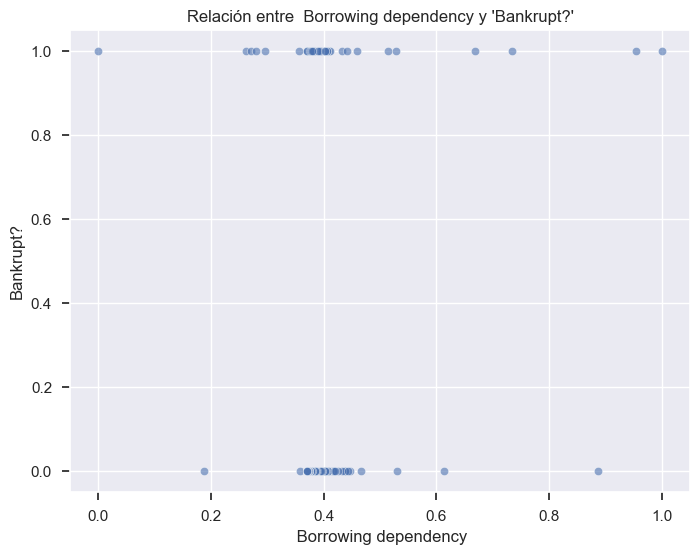

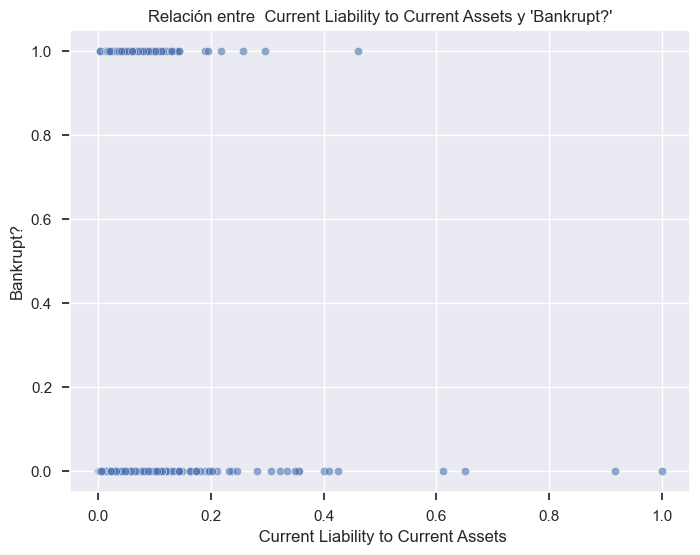

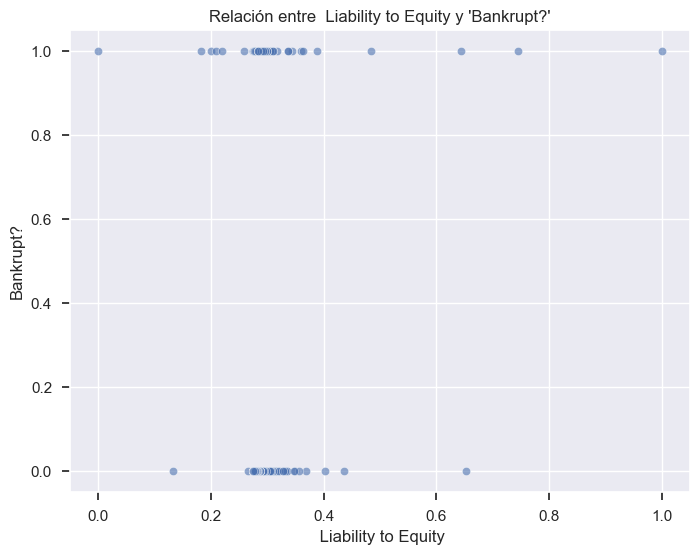

In [12]:
plt.figure(figsize=(15, 10))
sns.heatmap(df.corr(), cmap="coolwarm", annot=False, fmt=".2f", cbar=True)
plt.title("Matriz de correlación entre variables")
plt.show()

correlation_with_target = df.corr()["Bankrupt?"].sort_values(ascending=False)
print("\nCorrelación con la variable objetivo ('Bankrupt?'):")
print(correlation_with_target)

top_features = correlation_with_target.index[1:6]
print("\nVariables más correlacionadas con 'Bankrupt?':", top_features.tolist())

for feature in top_features:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=feature, y="Bankrupt?", data=df, alpha=0.6)
    plt.title(f"Relación entre {feature} y 'Bankrupt?'")
    plt.xlabel(feature)
    plt.ylabel("Bankrupt?")
    plt.show()


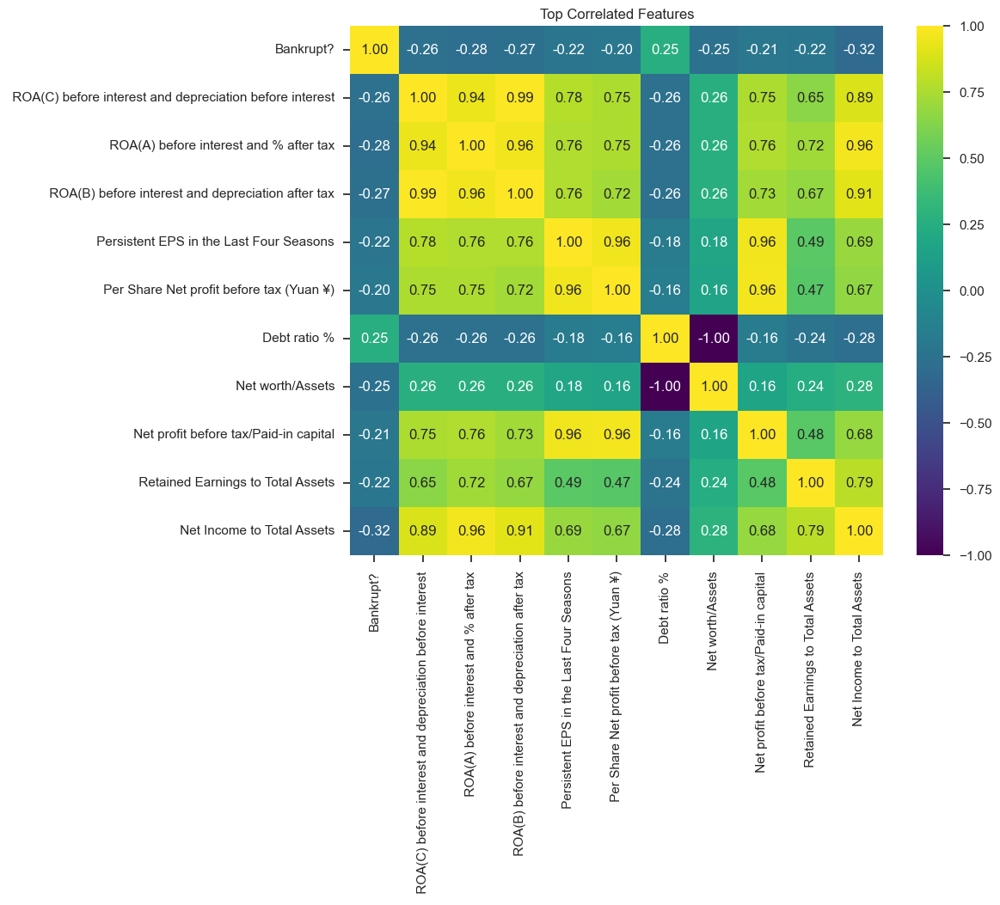

In [13]:
corrmat = df.corr(numeric_only = True)
top_var_corr = corrmat.index[abs(corrmat['Bankrupt?']) > 0.2]
plt.figure(figsize=(10, 8))
sns.heatmap(df[top_var_corr].corr(), annot=True, fmt='.2f', cmap='viridis')
plt.title('Top Correlated Features')
plt.show()

### Seleccionamos las Variables más correlacionadas para entrenar el modelo.

In [14]:
top_var_corr = list(top_var_corr)

In [15]:
df_filtered = df[top_var_corr]
df_filtered.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Persistent EPS in the Last Four Seasons,Per Share Net profit before tax (Yuan ¥),Debt ratio %,Net worth/Assets,Net profit before tax/Paid-in capital,Retained Earnings to Total Assets,Net Income to Total Assets
0,1,0.370594,0.424389,0.405750,0.169141,0.138736,0.207576,0.792424,0.137757,0.903225,0.716845
1,1,0.464291,0.538214,0.516730,0.208944,0.169918,0.171176,0.828824,0.168962,0.931065,0.795297
2,1,0.426071,0.499019,0.472295,0.180581,0.142803,0.207516,0.792484,0.148036,0.909903,0.774670
3,1,0.399844,0.451265,0.457733,0.193722,0.148603,0.151465,0.848535,0.147561,0.906902,0.739555
4,1,0.465022,0.538432,0.522298,0.212537,0.168412,0.106509,0.893491,0.167461,0.913850,0.795016


In [16]:
print(df_filtered['Bankrupt?'].value_counts())
print('-'* 50)
print('Financieramente Estable: ', round(df_filtered['Bankrupt?'].value_counts()[0]/len(df_filtered) * 100,2), '% del dataset')
print('Financieramente Inestable: ', round(df_filtered['Bankrupt?'].value_counts()[1]/len(df_filtered) * 100,2), '% del dataset')

Bankrupt?
0    6599
1     220
Name: count, dtype: int64
--------------------------------------------------
Financieramente Estable:  96.77 % del dataset
Financieramente Inestable:  3.23 % del dataset


## 3.Preparación de datos:
* Transformaciones para variables de entrada
* Transformaciones para variable de salida.
* Investigue y defina un listado de las transformaciones o procesos más usados en esta etapa.
---

1. Identificación de Nulos e imputación por la mediana.
2. Manejo de Outliers
3. transformaciones
4. Separación en entrenamiento y prueba

In [17]:
# 1
print("\nValores faltantes por columna:")
print(df_filtered.isnull().sum())

df_filtered.fillna(df_filtered.median(), inplace=True)


Valores faltantes por columna:
Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Persistent EPS in the Last Four Seasons                    0
 Per Share Net profit before tax (Yuan ¥)                   0
 Debt ratio %                                               0
 Net worth/Assets                                           0
 Net profit before tax/Paid-in capital                      0
 Retained Earnings to Total Assets                          0
 Net Income to Total Assets                                 0
dtype: int64


In [18]:
# 2.
def outliers(feature,feature_name,dataset):
    
    # Identify 25th & 75th quartiles

    q25, q75 = np.percentile(feature, 25), np.percentile(feature, 75)
    print('Quartile 25: {} | Quartile 75: {}'.format(q25, q75))
    feat_iqr = q75 - q25
    print('iqr: {}'.format(feat_iqr))
    
    feat_cut_off = feat_iqr * 1.5
    feat_lower, feat_upper = q25 - feat_cut_off, q75 + feat_cut_off
    print('Cut Off: {}'.format(feat_cut_off))
    print(feature_name +' Lower: {}'.format(feat_lower))
    print(feature_name +' Upper: {}'.format(feat_upper))
    
    outliers = [x for x in feature if x < feat_lower or x > feat_upper]
    print(feature_name + ' outliers for close to bankruptcy cases: {}'.format(len(outliers)))
    #print(feature_name + ' outliers:{}'.format(outliers))

    dataset = dataset.drop(dataset[(dataset[feature_name] > feat_upper) | (dataset[feature_name] < feat_lower)].index)
    print('-' * 65)
    
    return dataset

for col in df_filtered:
    new_df = outliers(df_filtered[col],str(col),df_filtered)

Quartile 25: 0.0 | Quartile 75: 0.0
iqr: 0.0
Cut Off: 0.0
Bankrupt? Lower: 0.0
Bankrupt? Upper: 0.0
Bankrupt? outliers for close to bankruptcy cases: 220
-----------------------------------------------------------------
Quartile 25: 0.476527080388047 | Quartile 75: 0.535562813825379
iqr: 0.05903573343733198
Cut Off: 0.08855360015599797
 ROA(C) before interest and depreciation before interest Lower: 0.38797348023204903
 ROA(C) before interest and depreciation before interest Upper: 0.624116413981377
 ROA(C) before interest and depreciation before interest outliers for close to bankruptcy cases: 391
-----------------------------------------------------------------
Quartile 25: 0.53554295682512 | Quartile 75: 0.58915721761884
iqr: 0.05361426079372
Cut Off: 0.08042139119058
 ROA(A) before interest and % after tax Lower: 0.45512156563454
 ROA(A) before interest and % after tax Upper: 0.66957860880942
 ROA(A) before interest and % after tax outliers for close to bankruptcy cases: 561
-------

Variables Numéricas

 Distribución Variable: Bankrupt?


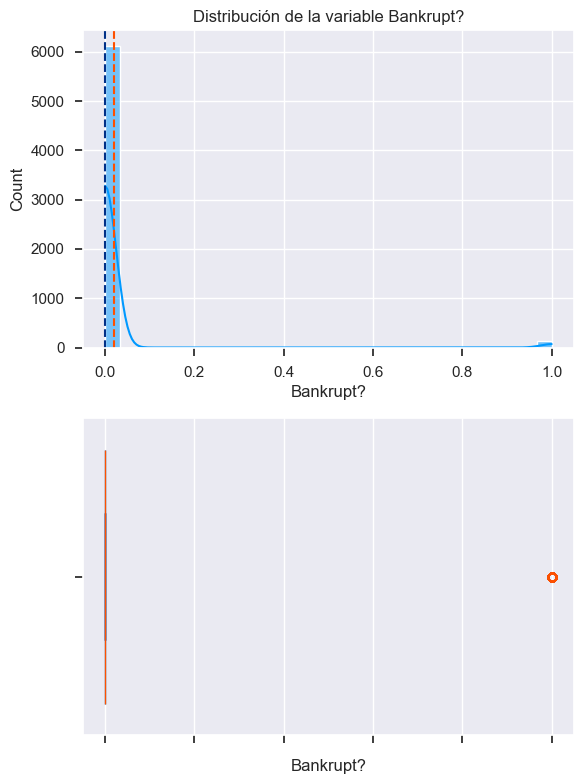

count    6258.000000
mean        0.020773
std         0.142636
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Bankrupt?, dtype: float64
------------------------------------------------------------



 Distribución Variable:  ROA(C) before interest and depreciation before interest


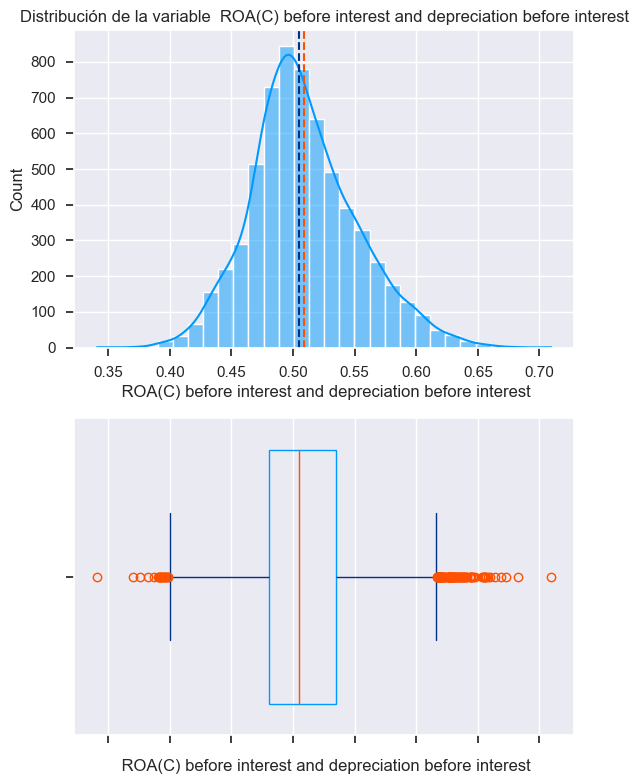

count    6258.000000
mean        0.509065
std         0.043579
min         0.340760
25%         0.480427
50%         0.504509
75%         0.534917
max         0.709648
Name:  ROA(C) before interest and depreciation before interest, dtype: float64
------------------------------------------------------------



 Distribución Variable:  ROA(A) before interest and % after tax


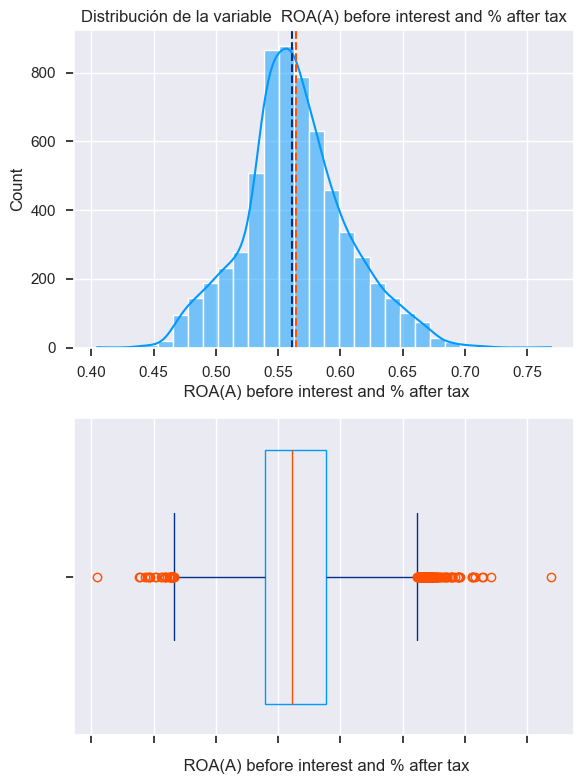

count    6258.000000
mean        0.564169
std         0.042088
min         0.404546
25%         0.539522
50%         0.561382
75%         0.588326
max         0.769298
Name:  ROA(A) before interest and % after tax, dtype: float64
------------------------------------------------------------



 Distribución Variable:  ROA(B) before interest and depreciation after tax


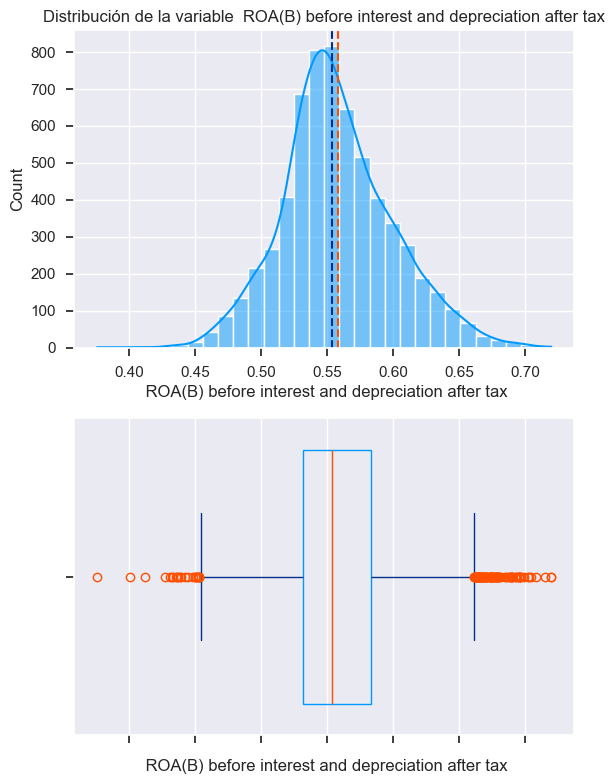

count    6258.000000
mean        0.558145
std         0.042199
min         0.375555
25%         0.531506
50%         0.553697
75%         0.583423
max         0.720006
Name:  ROA(B) before interest and depreciation after tax, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Persistent EPS in the Last Four Seasons


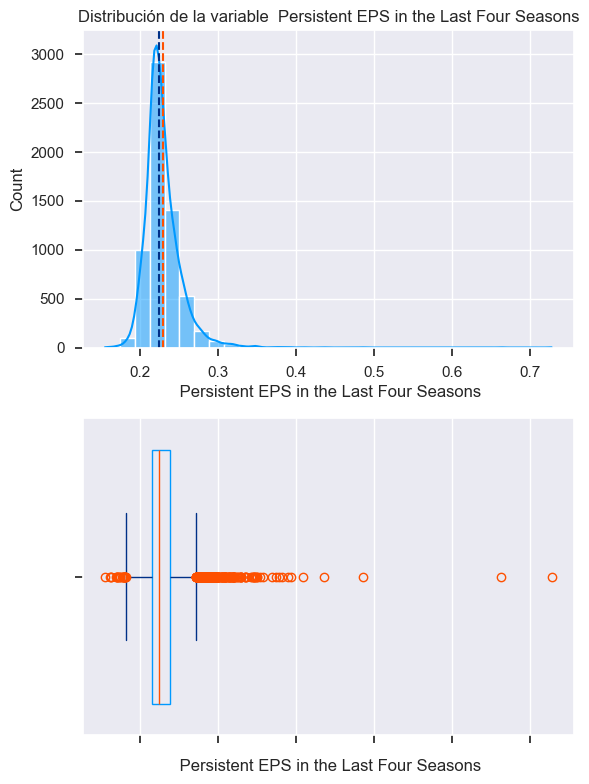

count    6258.000000
mean        0.229373
std         0.024091
min         0.155526
25%         0.215940
50%         0.225206
75%         0.238418
max         0.727522
Name:  Persistent EPS in the Last Four Seasons, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Per Share Net profit before tax (Yuan ¥)


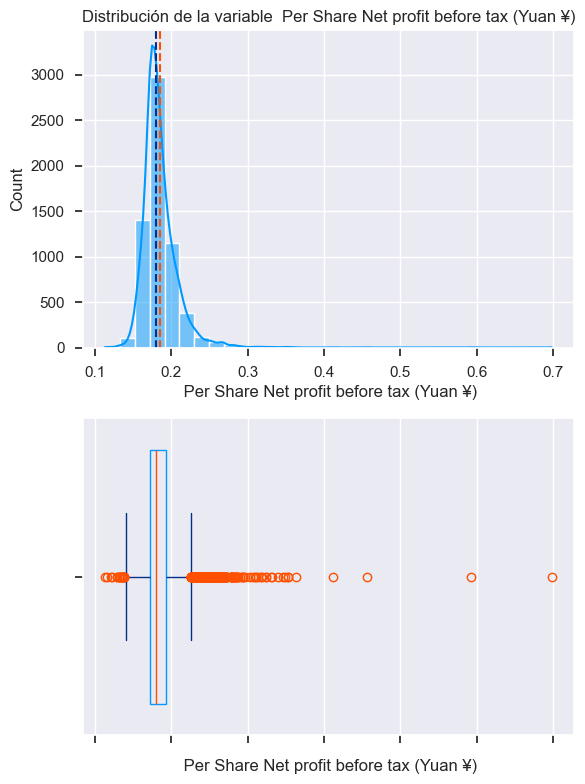

count    6258.000000
mean        0.184865
std         0.023863
min         0.112902
25%         0.171575
50%         0.180312
75%         0.193116
max         0.698125
Name:  Per Share Net profit before tax (Yuan ¥), dtype: float64
------------------------------------------------------------



 Distribución Variable:  Debt ratio %


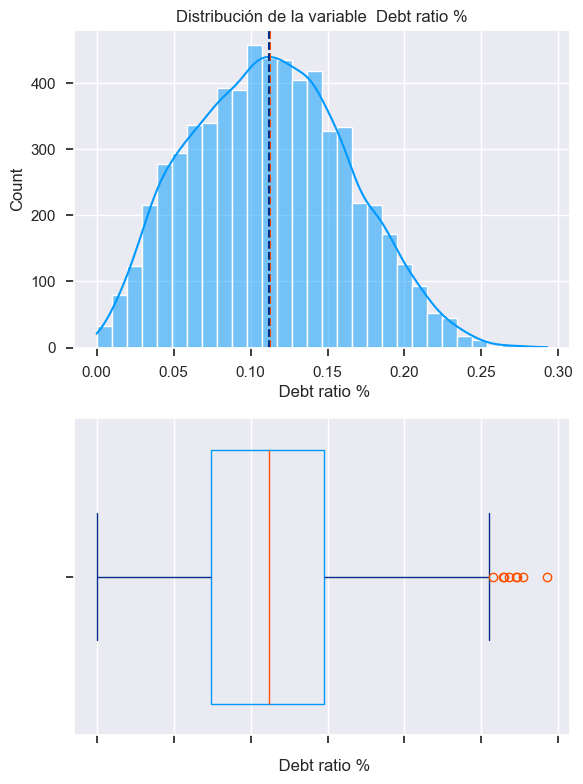

count    6258.000000
mean        0.112548
std         0.050504
min         0.000000
25%         0.074561
50%         0.111815
75%         0.147572
max         0.292711
Name:  Debt ratio %, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Net worth/Assets


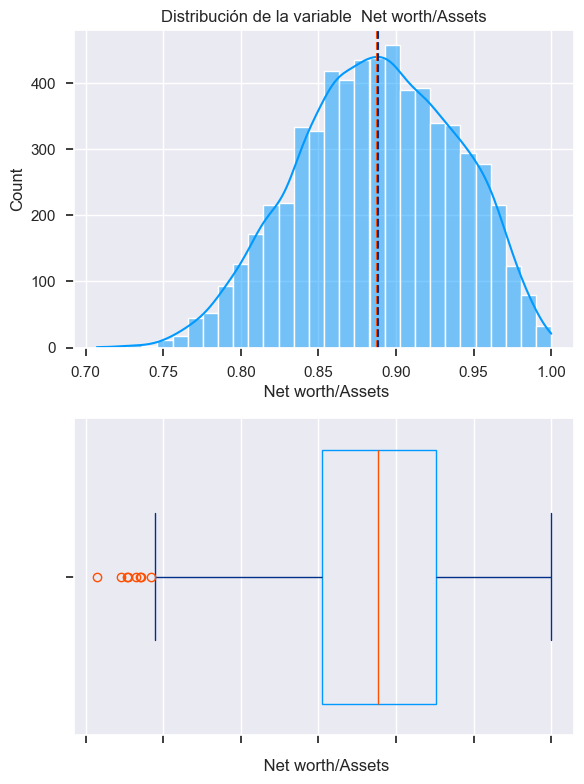

count    6258.000000
mean        0.887452
std         0.050504
min         0.707289
25%         0.852428
50%         0.888185
75%         0.925439
max         1.000000
Name:  Net worth/Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Net profit before tax/Paid-in capital


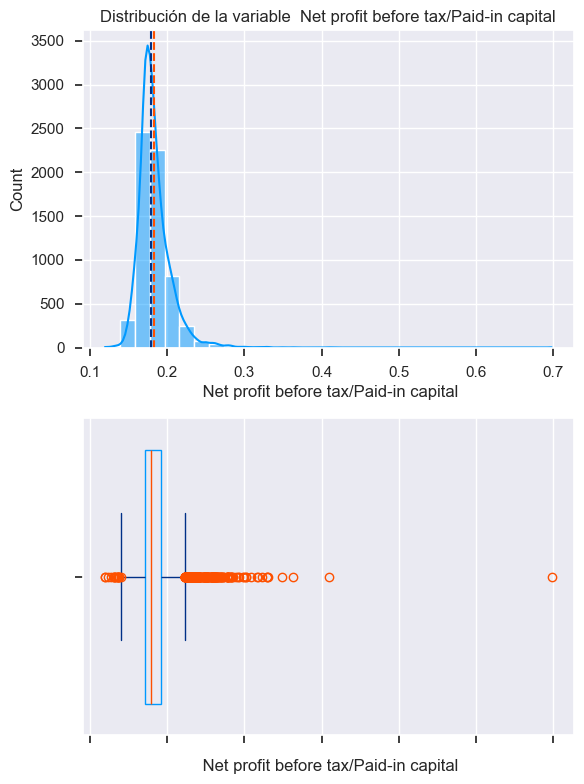

count    6258.000000
mean        0.183127
std         0.021736
min         0.119297
25%         0.170590
50%         0.179044
75%         0.191335
max         0.697813
Name:  Net profit before tax/Paid-in capital, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Retained Earnings to Total Assets


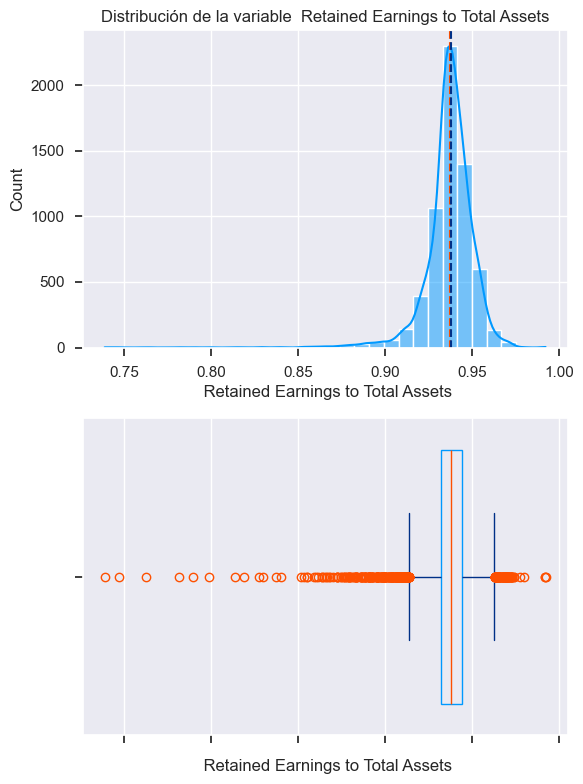

count    6258.000000
mean        0.937219
std         0.014290
min         0.738875
25%         0.932377
50%         0.938098
75%         0.944644
max         0.992404
Name:  Retained Earnings to Total Assets, dtype: float64
------------------------------------------------------------



 Distribución Variable:  Net Income to Total Assets


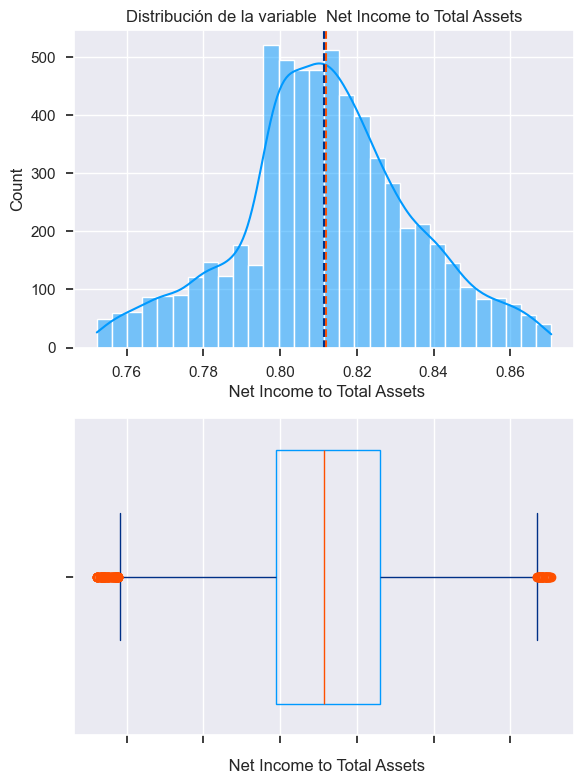

count    6258.000000
mean        0.812012
std         0.022893
min         0.752206
25%         0.798790
50%         0.811500
75%         0.826048
max         0.870631
Name:  Net Income to Total Assets, dtype: float64
------------------------------------------------------------




In [19]:
categorical_columns = new_df.select_dtypes(include=["object", "category"]).columns
numeric_columns = new_df.select_dtypes(include=["float64", "int64"]).columns

print('Variables Numéricas')

for col in numeric_columns:
    print(f'\n Distribución Variable: {col}')
    fig, axes = plt.subplots(2, 1, figsize=(6, 8))
    #plt.figure(figsize=(6, 3))
    sns.histplot(new_df[col], bins=30, kde=True, color="#0099FF", alpha=0.5, edgecolor = 'white', ax=axes[0])
    axes[0].axvline(new_df[col].mean(), color='#FE5000', linestyle='--', label='Media')
    axes[0].axvline(new_df[col].median(), color='#003087', linestyle='--', label='Mediana')
    axes[0].set_title(f"Distribución de la variable {col}")
    

    #plt.figure(figsize=(6, 3))
    sns.boxplot(x=new_df[col], ax = axes[1], boxprops = {'edgecolor' : '#0099FF' , 'facecolor' : 'none'} ,whiskerprops = {'color' : '#003087'} ,capprops= {'color' : '#003087'}, medianprops = {'color' : '#FE5000'},flierprops = {'markeredgecolor' : '#FE5000'})
    axes[1].set_xticklabels([])
    axes[1].set_yticklabels([])
    plt.tight_layout()
    plt.show()
    print(new_df[col].describe())
    print('-'*60)
    print('\n')

In [20]:
var_num = list(new_df.select_dtypes(include=['int64', 'float64']).columns)[1:]
var_cat = list(new_df.select_dtypes(include=['object']).columns)

In [21]:
#Balanceo de la clase
datos_no = new_df[new_df["Bankrupt?"] == 0]
datos_si = new_df[new_df["Bankrupt?"] == 1]
print(f'Tamaño no: {datos_no.shape}\nTamaño yes: {datos_si.shape}')

Tamaño no: (6128, 11)
Tamaño yes: (130, 11)


In [22]:
datos_no_os = datos_no.sample(datos_si.shape[0], random_state=42)

# Concatenar las muestras balanceadas
datos_os = pd.concat([datos_no_os, datos_si])
datos_os = datos_os.reset_index(drop=True)

# Mostrar los nuevos tamaños
print(f'Tamaño balanceado no: {datos_no_os.shape}\nTamaño balanceado yes: {datos_si.shape}')
print(f'Tamaño total después del balanceo: {datos_os.shape}')

Tamaño balanceado no: (130, 11)
Tamaño balanceado yes: (130, 11)
Tamaño total después del balanceo: (260, 11)


In [23]:
X = datos_os.drop(columns=["Bankrupt?"], axis=1)  
y = datos_os["Bankrupt?"]  

# 4 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [24]:
# 3
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(drop='first'))
])


preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, var_num),
        ('cat', categorical_transformer, var_cat)
    ]
)


pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)
])


In [25]:
pipeline.fit(X_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  [' ROA(C) before interest '
                                                   'and depreciation before '
                                                   'interest',
                                                   ' ROA(A) before interest '
                                                   'and % after tax',
                                                   ' ROA(B) before interest '
                                                   'and depreciation after tax',
                                                   ' Persistent EPS in the '
                                                   'Last Four Seasons',
                                                   ' Per Share Net profit '
                                                   'before tax (Yuan ¥)',
                                                   ' Debt ratio %',
                                                   ' Net worth/Assets',
                                                   ' Net profit before '
                                                   'tax/Paid-in capital',
                                                   ' Retained Earnings to '
                                                   'Total Assets',
                                                   ' Net Income to Total '
                                                   'Assets']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(drop='first'))]),
                                                  [])]))])

In [26]:
X_train = pipeline.transform(X_train)
X_test = pipeline.transform(X_test)

## 4. Modelación:
* Utilice por lo menos 5 modelos de ML. Uno de estos debe ser un método de ensamble.
* Haga una búsqueda de hiperparámetros para cada uno de los modelos.
* Aunque no es una obligación, se recomienda investigar y utilizar la librería PyCaret en esta etapa.

---
Entrenaremos cinco modelos de machine learning, incluyendo un método de ensamble, y realizaremos una búsqueda de hiperparámetros. Los modelos a implementar serán:

* Regresión Logística.
* Árbol de Decisión.
* Random Forest.
* Gradient Boosting.
* XGBoost.

In [ ]:


models = {
    "Logistic Regression": LogisticRegression(random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "XGBoost": XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="logloss")
}


param_grid = {
    "Logistic Regression": {"C": [0.1, 1, 10]},
    "Decision Tree": {"max_depth": [3, 5, 10], "min_samples_split": [2, 5, 10]},
    "Random Forest": {"n_estimators": [50, 100, 200], "max_depth": [None, 10, 20]},
    "Gradient Boosting": {"learning_rate": [0.01, 0.1, 0.2], "n_estimators": [50, 100]},
    "XGBoost": {"learning_rate": [0.01, 0.1], "n_estimators": [50, 100], "max_depth": [3, 5]}
}


best_models = {}
for model_name, model in models.items():
    print(f"\nEntrenando modelo: {model_name}")
    
   
    grid_search = GridSearchCV(model, param_grid[model_name], cv=5, scoring="roc_auc", n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    
    best_models[model_name] = grid_search.best_estimator_
    
    
    y_pred = grid_search.best_estimator_.predict(X_test)
    y_pred_proba = grid_search.best_estimator_.predict_proba(X_test)[:, 1]
    
    print(f"\nMejores hiperparámetros para {model_name}: {grid_search.best_params_}")
    print("\nReporte de clasificación:")
    print(classification_report(y_test, y_pred))
    print(f"AUC-ROC: {roc_auc_score(y_test, y_pred_proba):.4f}")



Entrenando modelo: Logistic Regression

Mejores hiperparámetros para Logistic Regression: {'C': 0.1}

Reporte de clasificación:
              precision    recall  f1-score   support

           0       0.77      0.71      0.74        24
           1       0.77      0.82      0.79        28

    accuracy                           0.77        52
   macro avg       0.77      0.76      0.77        52
weighted avg       0.77      0.77      0.77        52

AUC-ROC: 0.8929

Entrenando modelo: Decision Tree

Mejores hiperparámetros para Decision Tree: {'max_depth': 3, 'min_samples_split': 10}

Reporte de clasificación:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75        24
           1       0.79      0.79      0.79        28

    accuracy                           0.77        52
   macro avg       0.77      0.77      0.77        52
weighted avg       0.77      0.77      0.77        52

AUC-ROC: 0.7671

Entrenando modelo: Random Forest

Me

## 5 Evaluación

1. Para el caso planteado, ¿Cuál es la métrica de desempeño de mayor importancia? ¿Por qué?
2. Defina el mejor modelo.
3. Valdría la pena usar el mejor modelo en el día a día de una empresa/institución?

---

1. Para el caso la mejor métrica sería AUC-ROC dado que mide la capacidad del modelo para distinguir entre las dos clases (empresas que entran en bancarrota y las que no). Esta métrica evalúa el modelo en diferentes umbrales de probabilidad y proporciona una medida de discriminación independiente de la proporción de clases, pero sería importante complementarlas con Recall y F1 Score.
2. El mejor modelo sería XGBoost
3. La pena usar el mejor modelo en el día a día de una empresa podría depender de diferentes factores, como la disponibilidad de datos, la cantidad de datos, la calidad de los datos, el tiempo disponible para entrenar y evaluar el modelo, etc. En general, es importante tener en cuenta la complejidad del problema.

In [28]:
clf1 = setup(datos_os, target='Bankrupt?')

,Description,Value
0,Session id,4047
1,Target,Bankrupt?
2,Target type,Binary
3,Original data shape,"(260, 11)"
4,Transformed data shape,"(260, 11)"
5,Transformed train set shape,"(182, 11)"
6,Transformed test set shape,"(78, 11)"
7,Numeric features,10
8,Preprocess,True
9,Imputation type,simple


In [29]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8456,0.9037,0.8789,0.8352,0.8513,0.6913,0.7002,0.6420
ridge,Ridge Classifier,0.8456,0.9073,0.8789,0.8352,0.8513,0.6913,0.7002,0.0110
knn,K Neighbors Classifier,0.8351,0.9022,0.8478,0.8405,0.8375,0.6705,0.6807,0.0280
et,Extra Trees Classifier,0.8348,0.9012,0.8356,0.8461,0.8331,0.6699,0.6805,0.0660
lda,Linear Discriminant Analysis,0.8292,0.9096,0.8467,0.8235,0.8300,0.6584,0.6655,0.0120
rf,Random Forest Classifier,0.8184,0.9033,0.8244,0.8195,0.8161,0.6370,0.6469,0.0690
catboost,CatBoost Classifier,0.8184,0.9138,0.8244,0.8270,0.8182,0.6370,0.6466,1.4930
lightgbm,Light Gradient Boosting Machine,0.8129,0.8986,0.8244,0.8109,0.8141,0.6259,0.6317,0.0470
xgboost,Extreme Gradient Boosting,0.8076,0.8956,0.8244,0.8084,0.8078,0.6156,0.6286,0.0290
gbc,Gradient Boosting Classifier,0.8023,0.8865,0.8022,0.8064,0.7983,0.6049,0.6128,0.0500


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=4047, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [35]:
model_pycaret = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8947,0.9556,1.0000,0.8182,0.9000,0.7912,0.8090
1,0.8947,0.9333,0.9000,0.9000,0.9000,0.7889,0.7889
2,0.9444,0.9877,0.8889,1.0000,0.9412,0.8889,0.8944
3,0.8333,0.9136,0.7778,0.8750,0.8235,0.6667,0.6708
4,0.8333,0.9012,0.8889,0.8000,0.8421,0.6667,0.6708
5,0.7778,0.7531,0.6667,0.8571,0.7500,0.5556,0.5698
6,0.6111,0.7654,0.7778,0.5833,0.6667,0.2222,0.2357
7,0.9444,0.9753,1.0000,0.9000,0.9474,0.8889,0.8944
8,0.8889,1.0000,1.0000,0.8182,0.9000,0.7778,0.7977


In [36]:
model_pycaret.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 1000,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 4047,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [37]:
model_pycaret_tuned = tune_model(model_pycaret)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8947,0.9556,1.0000,0.8182,0.9000,0.7912,0.8090
1,0.8947,0.9333,0.9000,0.9000,0.9000,0.7889,0.7889
2,0.9444,0.9877,0.8889,1.0000,0.9412,0.8889,0.8944
3,0.8333,0.9136,0.7778,0.8750,0.8235,0.6667,0.6708
4,0.8333,0.9012,0.8889,0.8000,0.8421,0.6667,0.6708
5,0.7778,0.7654,0.6667,0.8571,0.7500,0.5556,0.5698
6,0.6111,0.7654,0.7778,0.5833,0.6667,0.2222,0.2357
7,0.9444,0.9753,1.0000,0.9000,0.9474,0.8889,0.8944
8,0.8889,1.0000,1.0000,0.8182,0.9000,0.7778,0.7977


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [38]:
model_pycaret_tuned.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 1000,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 4047,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

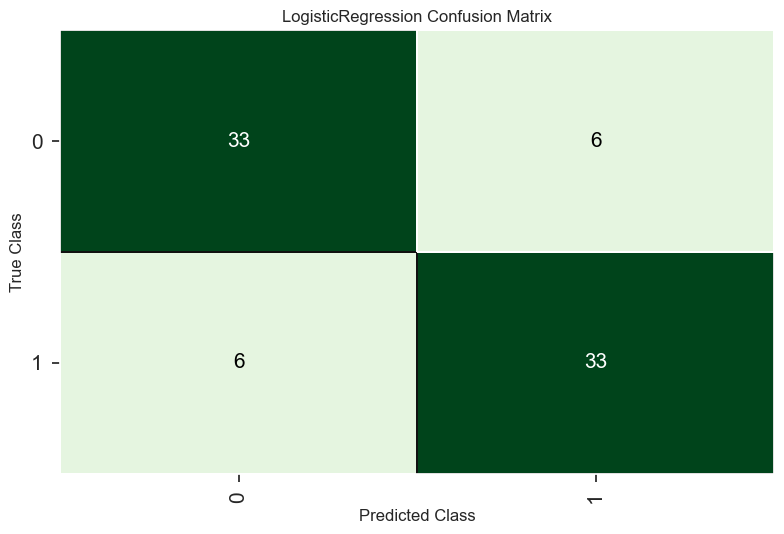

In [39]:
plot_model(model_pycaret_tuned, plot='confusion_matrix')

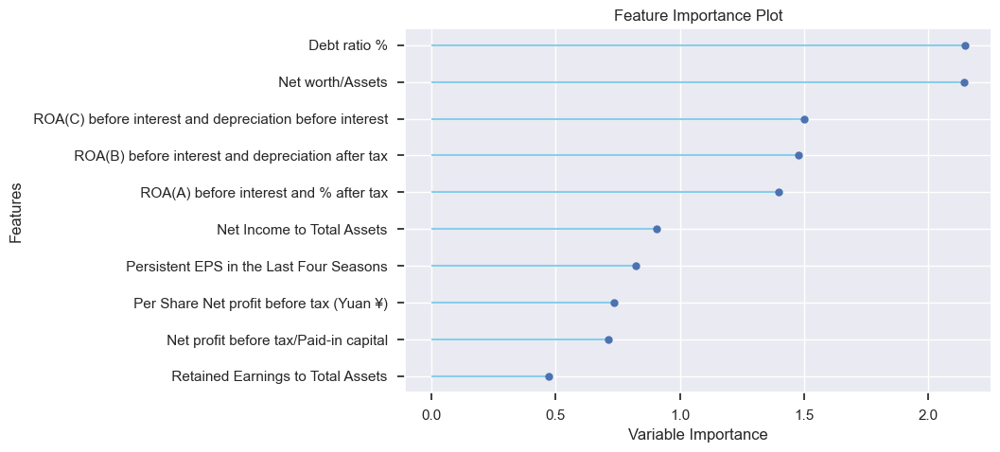

In [40]:
plot_model(model_pycaret_tuned, plot='feature')

In [41]:
predictions = predict_model(model_pycaret_tuned, data=datos_os)
predictions.head()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.8462,0.9149,0.8692,0.8309,0.8496,0.6923,0.6930


,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Persistent EPS in the Last Four Seasons,Per Share Net profit before tax (Yuan ¥),Debt ratio %,Net worth/Assets,Net profit before tax/Paid-in capital,Retained Earnings to Total Assets,Net Income to Total Assets,Bankrupt?,prediction_label,prediction_score
0,0.492029,0.560565,0.544890,0.222937,0.178128,0.110379,0.889621,0.176940,0.937702,0.812093,0,0,0.5562
1,0.531565,0.598179,0.581241,0.246573,0.200121,0.099132,0.900868,0.199171,0.953551,0.832371,0,0,0.6263
2,0.539365,0.602268,0.595000,0.241278,0.190254,0.065393,0.934607,0.190129,0.959498,0.836127,0,0,0.6653
3,0.524887,0.585205,0.566893,0.250922,0.209987,0.162530,0.837470,0.207164,0.941796,0.818148,0,0,0.5482
4,0.532102,0.604775,0.592912,0.242507,0.192287,0.075491,0.924509,0.190559,0.945094,0.837295,0,0,0.6526


## 6. Despliegue

### Creación del Pipeline

In [44]:
var_num = list(new_df.select_dtypes(include=['int64', 'float64']).columns)[1:]
var_cat = list(new_df.select_dtypes(include=['object']).columns)

In [45]:
X = datos_os.drop(columns=["Bankrupt?"], axis=1) 
y = datos_os["Bankrupt?"] 

# 4 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [46]:

numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(drop='first'))
])


preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, var_num),  
        ('cat', categorical_transformer, var_cat)  
    ]
)


model = LogisticRegression(
    C= 1.0,
    class_weight= None,
    dual=False,
    fit_intercept=True,
    intercept_scaling=1,
    l1_ratio=None,
    max_iter=1000,
    multi_class='auto',
    n_jobs=None,
    penalty='l2',
    random_state= 4047,
    solver='lbfgs',
    tol=0.0001,
    verbose=0,
    warm_start=False
)

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', model) 
])



In [47]:
pipeline.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('scaler',
                                                                   StandardScaler(copy=True,
                                                                                  with_mean=True,
                                                                                  with_std=True))],
                                                           verbose=False),
                                                  [' ROA(C) before interest '
                                                   'and depreciation before '
                                                   'interest',
                                                   ' ROA(A) before interest '
                                                   'an...
                                                                                 sparse_output=True))],
                                                           verbose=False),
                                                  [])],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('classifier',
                 LogisticRegression(C=1.0, class_weight=None, dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=1000,
                                    multi_class='auto', n_jobs=None,
                                    penalty='l2', random_state=4047,
                                    solver='lbfgs', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)

In [48]:
y_pred = pipeline.predict(X_test)

print(classification_report(y_test, y_pred))
print(f"AUC-ROC: {roc_auc_score(y_test, y_pred):.4f}")

              precision    recall  f1-score   support

           0       0.78      0.75      0.77        24
           1       0.79      0.82      0.81        28

    accuracy                           0.79        52
   macro avg       0.79      0.79      0.79        52
weighted avg       0.79      0.79      0.79        52

AUC-ROC: 0.7857


In [50]:
joblib.dump(pipeline, 'pipeline.joblib')

['pipeline.joblib']

In [53]:
import joblib
import sklearn
import pandas as pd

In [54]:
print("Versión de Joblib:", joblib.__version__)
print("Versión de scikit-learn:", sklearn.__version__)
print("Versión de Pandas:", pd.__version__)

Versión de Joblib: 1.3.2
Versión de scikit-learn: 1.4.2
Versión de Pandas: 2.1.4
